In [13]:
import sys
sys.path.append('../..')  # Expose top level program access

import re
import time
import pickle
import logging
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import pytorch_lightning as pl
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from sklearn.covariance import EllipticEnvelope
from scipy.stats import gaussian_kde
from pathlib import Path
from utils import tools, callbacks, metrics, supported_preprocessing_transforms
from modules.cae_base_module import CAEBaseModule
from modules.aae_base_module import AAEBaseModule
from modules.vae_base_module import VAEBaseModule
from datasets import supported_datamodules
from models import supported_models
from functools import reduce

In [14]:
# Import configurations and paths to logged models
root = Path.cwd() / '..' / '..'
log_path = root / 'logs' / 'LunarAnalogueDataModule'
paths_to_archived_models_ss = list(Path(log_path).glob('**/archive_nre*'))
paths_to_archived_models_bing = list(Path(log_path).glob('**/archive_bing*'))

# filter the models that don't provide structured latent representations
for i, p in enumerate(paths_to_archived_models_ss.copy()):
    if not re.search('VAE|AAE', str(p)):
        paths_to_archived_models_ss.remove(p)
# filter the models that don't provide structured latent representations
for i, p in enumerate(paths_to_archived_models_bing.copy()):
    if not re.search('VAE|AAE', str(p)):
        paths_to_archived_models_bing.remove(p)

print('Found archived models:\n------')
print('\n'.join([f'{p.parent.name}/{p.name}' for p in (*paths_to_archived_models_ss, *paths_to_archived_models_bing)]))

Found archived models:
------
SimpleVAE/archive_nre1_2021-05-04
SimpleVAE/archive_nre2_2021-05-04
BaselineAAE/archive_nre1_2021-05-07
BaselineVAE/archive_bing1_2021-05-20
BaselineAAE/archive_bing1_2021-05-19


In [15]:
from experiments.helpers import load_modules

module_catalog_ss, datamodule_ss, _ = load_modules(paths_to_archived_models_ss)
module_catalog_bing, datamodule_bing, _ = load_modules(paths_to_archived_models_bing)

Loading state dict for: SimpleVAE/archive_nre1_2021-05-04
Loading state dict for: SimpleVAE/archive_nre2_2021-05-04
Loading state dict for: BaselineAAE/archive_nre1_2021-05-07
Loading state dict for: BaselineVAE/archive_bing1_2021-05-20
Loading state dict for: BaselineAAE/archive_bing1_2021-05-19


In [16]:
def rp_test_modules(datamodule, module_catalog):
    for batch_nb, batch in enumerate(datamodule.test_dataloader()):
        print(f'------\nLoaded batch {batch_nb}\n------')
                
        # Extract the model type (e.g. CAE, AAE, VAE) and their versions
        for model_type, model_versions in module_catalog.items():
            
            # Extract the name of the archive and the module's state dict
            for model_name, module in model_versions.items():
                
                # Set the model/components in evaluation mode
                if 'AAE' in model_type:
                    module.encoder.eval()
                    module.decoder.eval()
                else:
                    module.model.eval()
                
                short_name = model_type + '-' + model_name.split('_')[1]
                if short_name not in result_catalog:
                    result_catalog[short_name] = {
                        'latent_vecs': [],
                        'scores': [], 
                        'filepaths': [],
                        'gt_bboxes': [],
                        'cr_bboxes': []
                    }
                print(f'Testing on: {short_name}')

                result = module.test_step(batch, batch_nb)

                result_catalog[short_name]['latent_vecs'].extend(result['images']['batch_lt'].cpu().numpy())
                result_catalog[short_name]['scores'].extend(result['scores'])
                result_catalog[short_name]['filepaths'].extend(result['labels']['filepaths'])
                result_catalog[short_name]['gt_bboxes'].extend(result['labels']['gt_bboxes'])
                result_catalog[short_name]['cr_bboxes'].extend(result['labels']['cr_bboxes'])
                print(f'{time.time() - start:.2f}')
    return result_catalog
    
# Testing loop
# Caution: this loop takes _minutes_ to run.
start = time.time()

# Collect scores and labels for all models in a catalog
result_catalog = {}

# Loop over the test dataloader, using the same batch for each model to save time
with torch.no_grad():
    result_catalog_ss = rp_test_modules(datamodule_ss, module_catalog_ss)
    result_catalog_bing = rp_test_modules(datamodule_bing, module_catalog_bing)
                
print(f'Testing took: {time.time() - start:.2f}')

------
Loaded batch 0
------
Testing on: SimpleVAE-nre1
98.65
Testing on: SimpleVAE-nre2
135.86
Testing on: BaselineAAE-nre1
156.33
------
Loaded batch 1
------
Testing on: SimpleVAE-nre1
158.43
Testing on: SimpleVAE-nre2
167.07
Testing on: BaselineAAE-nre1
184.29
------
Loaded batch 2
------
Testing on: SimpleVAE-nre1
184.77
Testing on: SimpleVAE-nre2
185.17
Testing on: BaselineAAE-nre1
190.06
------
Loaded batch 3
------
Testing on: SimpleVAE-nre1
190.46
Testing on: SimpleVAE-nre2
190.88
Testing on: BaselineAAE-nre1
195.77
------
Loaded batch 4
------
Testing on: SimpleVAE-nre1
196.18
Testing on: SimpleVAE-nre2
196.57
Testing on: BaselineAAE-nre1
201.49
------
Loaded batch 5
------
Testing on: SimpleVAE-nre1
201.89
Testing on: SimpleVAE-nre2
202.30
Testing on: BaselineAAE-nre1
207.21
------
Loaded batch 6
------
Testing on: SimpleVAE-nre1
207.63
Testing on: SimpleVAE-nre2
208.03
Testing on: BaselineAAE-nre1
212.92
------
Loaded batch 7
------
Testing on: SimpleVAE-nre1
213.31
Testing

In [17]:
# Merge the bing and ss results, but dataloaders are still seperate
result_catalog = {**result_catalog_ss, **result_catalog_bing}

# # Temp fix for missing numpy, cpu casting
# for sn, results in result_catalog.items():
#     results['latent_vecs'] = [lt.cpu().numpy() for lt in results['latent_vecs']]

# Format data for plotting and analysis
for sn, results in result_catalog.items():
    if 'CAE' in sn:
        continue
    results['latent_vecs'] = np.array(results['latent_vecs'])
    results['scores'] = np.array(results['scores'])
    results['filepaths'] = np.array(results['filepaths']).reshape(-1)
    results['gt_bboxes'] = np.array(results['gt_bboxes']).reshape(-1, 4)
    results['cr_bboxes'] = np.array(results['cr_bboxes']).reshape(-1, 4)
    print(f'[{sn}]\t Predicted {results["scores"].shape} scores, '\
          f'with {results["gt_bboxes"].shape} gt boxes, and {results["cr_bboxes"].shape} rps')

with open('nre-results_2021-05-05.pkl', 'wb') as f:
    pickle.dump(result_catalog, f)

[SimpleVAE-nre1]	 Predicted (13312,) scores, with (13312, 4) gt boxes, and (13312, 4) rps
[SimpleVAE-nre2]	 Predicted (13312,) scores, with (13312, 4) gt boxes, and (13312, 4) rps
[BaselineAAE-nre1]	 Predicted (13312,) scores, with (13312, 4) gt boxes, and (13312, 4) rps
[BaselineVAE-bing1]	 Predicted (13312,) scores, with (13312, 4) gt boxes, and (13312, 4) rps
[BaselineAAE-bing1]	 Predicted (13312,) scores, with (13312, 4) gt boxes, and (13312, 4) rps


In [18]:
%matplotlib inline
# Get the gt labels with IOU > thresh

# For now, just run the analysis on all of the models
lt_results = {}

for sn, res in result_catalog.items():
    if 'CAE' in sn:
        continue
    print(f'------\n{sn}\n------')
    
    ious = []
    # binary_labels = []  # IOU > 0.5 counts as a label
    n_duplicates = 0
    n_novelties = 428
    iou_thresh = 0.5

    gt_bboxes = res['gt_bboxes']
    cr_bboxes = res['cr_bboxes']
    for i, (gt, cr) in enumerate(zip(gt_bboxes, cr_bboxes)):
        cr = cr * 5  # Rescale the bounding boxes, see 'scale' parameter in LunarAnaloguePreprocesing
        iou = metrics.iou(cr, gt)
        ious.append(iou)

        if i == 0:
            prev_gt = [-1, -1, -1, -1]
        if iou > iou_thresh:
            if all(gt == prev_gt):
                n_duplicates += 1
            prev_gt = gt

    ious = np.array(ious)
    bin_labels = ious > iou_thresh
    
    print(f'N labels: {sum(bin_labels)}')
    print(f'N duplicates: {n_duplicates}')
    print(f'N novelties: {n_novelties}')
    print(f'Ratio of located novelies {(sum(bin_labels) - n_duplicates)/n_novelties:.5f}')
    print(f'Ratio of relevant regions {sum(bin_labels) / (n_novelties*16):.5f}')
    
    lt_results[sn] = {
        'latent_vecs': res['latent_vecs'],
        'ious': ious, 
        'labels': bin_labels, 
        'scores': res['scores'], 
        'n_duplicates': n_duplicates,
        'n_novelties': n_novelties
    }

2021-07-30 16:53:43,566 - DEBUG - Loaded backend module://ipykernel.pylab.backend_inline version unknown.


------
SimpleVAE-nre1
------
N labels: 159
N duplicates: 16
N novelties: 428
Ratio of located novelies 0.33411
Ratio of relevant regions 0.02322
------
SimpleVAE-nre2
------
N labels: 159
N duplicates: 16
N novelties: 428
Ratio of located novelies 0.33411
Ratio of relevant regions 0.02322
------
BaselineAAE-nre1
------
N labels: 159
N duplicates: 16
N novelties: 428
Ratio of located novelies 0.33411
Ratio of relevant regions 0.02322
------
BaselineVAE-bing1
------
N labels: 69
N duplicates: 7
N novelties: 428
Ratio of located novelies 0.14486
Ratio of relevant regions 0.01008
------
BaselineAAE-bing1
------
N labels: 69
N duplicates: 7
N novelties: 428
Ratio of located novelies 0.14486
Ratio of relevant regions 0.01008


2021-07-30 16:53:46,823 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:46,823 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:46,823 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:46,824 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:46,824 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:46,825 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:46,825 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:46,826 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:46,826 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:46,826 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:46,859 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:46,859 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:46,860 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:46,861 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:46,861 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:46,861 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:46,862 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:46,863 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:46,863 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:46,863 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:53:46,919 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:46,919 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:46,919 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:53:46,920 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:46,922 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:46,922 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:46,922 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:46,922 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:46,923 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:46,924 - DEBUG - Textile font is not compatible with

2021-07-30 16:53:46,962 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:46,962 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:46,962 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:46,964 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:46,965 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:46,966 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:46,967 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:46,967 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:46,967 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:46,968 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:53:47,005 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:47,006 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:47,006 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:47,006 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,006 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,007 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:47,007 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:53:47,007 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:47,008 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:47,009 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:53:47,061 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:47,061 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:47,062 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:47,062 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,062 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,063 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:47,064 - DEBUG - latex -interaction=nonstopmode --halt-on-error /home/brahste/.cache/matplotlib/tex.cache/b3a5626353001c0da092f7077e0980e9.tex
2021-07-30 16:53:47,154 - DEBUG - b"This is pdfTeX, Version 3.14159265-2.6-1.40.18 (TeX Live 2017/Debian) (preloaded format=latex)\n restricted \\write18 enabled.\nentering extended mode\n\n(/home/brahste/.cache/matplotlib/tex.cache/b3a5626353001c0da092f70

2021-07-30 16:53:47,652 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:47,653 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:47,653 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:47,653 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:47,653 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:47,654 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:47,654 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:47,654 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,655 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,655 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:47,690 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:53:47,691 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:47,692 - DEBUG - Assigning font /b'F1' = b'cmsy10' (dvi)
2021-07-30 16:53:47,692 - DEBUG - Assigning font /b'F2' = b'pplr8r' (dvi)
2021-07-30 16:53:47,696 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:47,698 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:47,698 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:47,698 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:47,699 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:47,699 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:47,699 - DEBUG - family: cursive, font: Zapf Cha

2021-07-30 16:53:47,735 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,735 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,736 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:47,736 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-07-30 16:53:47,736 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:47,739 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:47,739 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:47,739 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:47,740 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:47,740 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:53:47,770 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:47,771 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:47,771 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,772 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,772 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:47,772 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:47,773 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:47,773 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:47,774 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:47,774 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:53:47,807 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:47,808 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:47,808 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:47,808 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:47,808 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,809 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,810 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:47,811 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:53:47,811 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:47,812 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:53:47,852 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:47,853 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:47,853 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:47,853 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:47,854 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:47,854 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:47,855 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,855 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,855 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:47,855 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dv

2021-07-30 16:53:47,899 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:47,902 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:47,902 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:47,902 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:47,903 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:47,903 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:47,903 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:47,903 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:47,904 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,905 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:47,905 - DEBUG - fam

2021-07-30 16:53:48,063 - DEBUG - Embedding Type-1 font b'pplr8r' from dvi.
2021-07-30 16:53:48,064 - DEBUG - Embedding TeX font b'pplr8r' - fontinfo={'dvifont': <DviFont: b'pplr8r'>, 'pdfname': <Name b'F2'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/urw/palatino/uplr8a.pfb', 'basefont': b'URWPalladioL-Roma', 'encodingfile': '/usr/share/texlive/texmf-dist/fonts/enc/dvips/base/8r.enc', 'effects': {}}
2021-07-30 16:53:48,067 - DEBUG - Embedding Type-1 font b'pplri8r' from dvi.
2021-07-30 16:53:48,068 - DEBUG - Embedding TeX font b'pplri8r' - fontinfo={'dvifont': <DviFont: b'pplri8r'>, 'pdfname': <Name b'F4'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/urw/palatino/uplri8a.pfb', 'basefont': b'URWPalladioL-Ital', 'encodingfile': '/usr/share/texlive/texmf-dist/fonts/enc/dvips/base/8r.enc', 'effects': {}}
2021-07-30 16:53:48,087 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:48,088 - DEBUG - DejaVu Sans font is not c

2021-07-30 16:53:48,123 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:48,123 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:48,123 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:48,124 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:48,124 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:48,124 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,125 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,125 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:48,125 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:48,130 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:53:48,173 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:48,173 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:48,173 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:48,175 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,175 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,176 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:48,179 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:53:48,179 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:48,181 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:48,182 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:53:48,224 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:48,225 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:53:48,225 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:48,226 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:48,226 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:48,227 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:48,231 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:48,231 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:48,231 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:48,232 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:53:48,274 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:48,274 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-07-30 16:53:48,275 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:48,281 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:48,282 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:48,282 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:48,282 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:48,283 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:48,283 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:48,283 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:53:48,320 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,321 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,321 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:48,321 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:48,322 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:48,323 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:48,323 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:48,324 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:48,324 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:48,325 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:53:48,367 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:48,367 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:48,367 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,368 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,368 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:48,368 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:53:48,369 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:48,371 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:48,372 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:48,372 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:53:48,407 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:48,407 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:48,408 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:48,408 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:48,408 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:48,408 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:48,409 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:48,410 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,410 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,410 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:48,457 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:48,457 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:48,458 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:48,458 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,458 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,459 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:48,459 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:48,460 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:48,460 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:48,461 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:48,505 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:48,505 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dvi
2021-07-30 16:53:48,508 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:48,512 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:48,512 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:48,513 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:48,513 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:48,513 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:48,514 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:48,514 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:53:48,952 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,953 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,953 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:48,953 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:48,955 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:48,955 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:48,956 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:48,956 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:48,956 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:48,957 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:53:48,990 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:48,990 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:48,990 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,991 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:48,991 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:48,995 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:53:48,999 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:49,000 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:49,000 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,001 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:53:49,037 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,037 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,038 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:49,038 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:49,038 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,039 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:49,039 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:49,039 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:49,039 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:49,040 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:53:49,080 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:49,083 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:49,083 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,083 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:49,084 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:49,084 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:49,084 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:49,085 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:49,085 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,085 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,086 - DEBUG - fam

2021-07-30 16:53:49,125 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:49,125 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:49,125 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,126 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:49,127 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:49,128 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:49,128 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:49,128 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:49,129 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,129 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,129 - DEBUG - fam

2021-07-30 16:53:49,170 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:49,170 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:53:49,171 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:49,172 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:49,172 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,172 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:49,173 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:49,173 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:49,173 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:49,173 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:53:49,216 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,217 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,217 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:49,217 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:49,218 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,218 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:49,218 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:49,220 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:49,220 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:49,221 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:53:49,267 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,267 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:49,267 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:49,268 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:49,268 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:49,268 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:49,268 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,269 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,269 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:49,269 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:53:49,308 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,309 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:49,311 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:53:49,312 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:49,313 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:49,313 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,314 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:49,314 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:49,314 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:49,315 - DEBUG - Textile font is not compatible with

2021-07-30 16:53:49,355 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:49,356 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:49,357 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:49,357 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,357 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:49,358 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:49,358 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:49,358 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:49,360 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:49,361 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

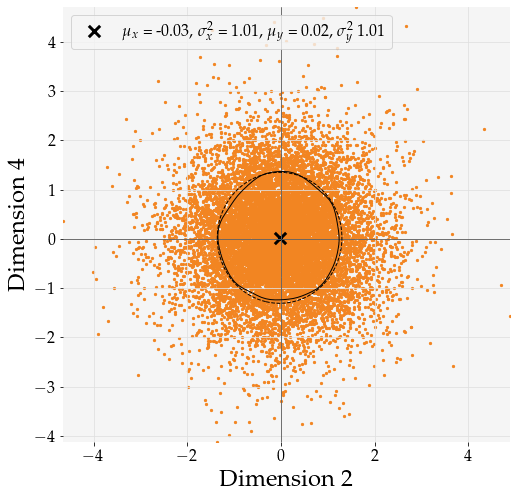

2021-07-30 16:53:49,528 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:49,528 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,528 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:49,529 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:49,529 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:49,530 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:49,530 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:49,530 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,531 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,531 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:49,622 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,622 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,622 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:49,623 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:53:49,624 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:49,625 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:49,625 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,627 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:49,627 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:49,628 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:53:49,673 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:49,673 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:49,674 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,674 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,674 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:49,674 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:49,677 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:49,682 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:49,682 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,682 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:53:49,718 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:49,718 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:49,718 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:49,719 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:49,719 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,719 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,719 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:49,720 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-07-30 16:53:49,721 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:49,722 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:53:49,761 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:49,761 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:49,761 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:49,761 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:49,762 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:49,762 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:49,762 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,762 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:49,763 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:49,763 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:53:50,594 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:50,595 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:50,595 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:50,595 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:50,595 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:50,596 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:50,596 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:50,596 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:50,596 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:50,597 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:53:50,622 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:53:50,624 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:50,625 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:50,625 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:50,625 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:50,626 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:50,626 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:50,626 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:50,626 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:50,627 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:53:50,654 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:50,654 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:50,654 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:50,654 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:50,655 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:50,655 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:50,655 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:50,655 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:50,656 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dvi
2021-07-30 16:53:50,657 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:53:50,695 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:50,696 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:50,696 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:50,696 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:50,696 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:50,697 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:50,697 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:50,697 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:50,697 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:50,698 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dv

2021-07-30 16:53:50,727 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:50,728 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:50,728 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:50,728 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:50,729 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:50,729 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:50,729 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:50,729 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:50,730 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:50,730 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:50,730 - DEBUG - fam

2021-07-30 16:53:50,760 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:50,760 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:50,761 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:50,762 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:50,762 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:50,762 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:50,763 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:50,763 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:50,763 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:50,764 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:53:50,796 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:50,797 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:50,798 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:50,798 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:50,799 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:50,799 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:50,800 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:50,800 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:50,800 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:50,800 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:50,801 - DEBUG - fam

2021-07-30 16:53:50,844 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:50,844 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:50,845 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:50,845 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:50,845 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/798d56fe5d7b88c994356e1c10aa55a0.dvi
2021-07-30 16:53:50,847 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:50,848 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:50,849 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:50,849 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:50,850 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:53:50,892 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:53:50,893 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:50,894 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:50,894 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:50,894 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:50,895 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:50,895 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:50,895 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:50,895 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:50,896 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:53:51,008 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:53:51,009 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:51,010 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:51,014 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:51,015 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,015 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,016 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,016 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,016 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,017 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:53:51,054 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,055 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:51,055 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:51,055 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:51,056 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,056 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,056 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,056 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,057 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,057 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:53:51,091 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,091 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,091 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,091 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,092 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,092 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,092 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,093 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:51,093 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:51,093 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:53:51,132 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,132 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,132 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,133 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,134 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,134 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:51,134 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:53:51,135 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:51,136 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:51,136 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:53:51,169 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,169 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,169 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,171 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,171 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,171 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,172 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,172 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:51,173 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:51,174 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:53:51,224 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:51,225 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:51,226 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,226 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,227 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,227 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,227 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,228 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,228 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,228 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:51,270 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,270 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,271 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,271 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,272 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,272 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,272 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,273 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:51,273 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:51,273 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:53:51,311 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:51,312 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:53:51,313 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:51,317 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:51,319 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:51,319 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,319 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,320 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,320 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,320 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:53:51,363 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:51,363 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,364 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,364 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,364 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,364 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,365 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,365 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,365 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:51,366 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dv

2021-07-30 16:53:51,413 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,413 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,414 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,414 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,414 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,414 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:51,420 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:51,421 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:51,421 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:51,422 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:53:51,461 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,462 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,463 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,463 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,463 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,463 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,464 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,464 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:51,464 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/be1054efb11919c0b518672140abdf0c.dvi
2021-07-30 16:53:51,466 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:53:51,506 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:51,507 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:51,508 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,508 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,509 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,509 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,509 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,510 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,510 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,510 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:51,546 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,547 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,547 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,547 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,548 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,551 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,552 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,552 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:51,553 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6e669d4270a0d6fadcab81941d2c82f8.dvi
2021-07-30 16:53:51,554 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:53:51,592 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,593 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,593 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:51,593 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:51,595 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:51,596 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,597 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,597 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,598 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,598 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:53:51,641 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:51,642 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:51,642 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:51,643 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:51,643 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:51,643 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:51,644 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,644 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:51,644 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:51,644 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dv

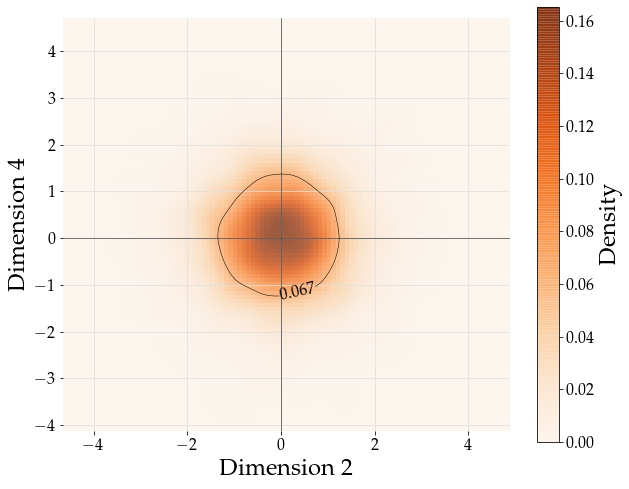

2021-07-30 16:53:53,827 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:53,827 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:53,827 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:53,828 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:53,828 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:53,828 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:53,829 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:53,829 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:53,829 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:53,830 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:53,865 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:53,865 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:53,866 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:53,866 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:53,867 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:53,867 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:53,868 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:53,868 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:53,868 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:53,869 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:53:53,905 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:53,906 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:53,906 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:53:53,907 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:53,908 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:53,908 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:53,908 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:53,909 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:53,909 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:53,909 - DEBUG - Textile font is not compatible with

2021-07-30 16:53:53,957 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:53,957 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:53,957 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:53,957 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:53,958 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:53,959 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:53,959 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:53,960 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:53,961 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:53,962 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:53:54,001 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:54,001 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:54,001 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:54,002 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,002 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,003 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:54,003 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:53:54,005 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:54,006 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:54,007 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:53:54,048 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:54,048 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:54,048 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:54,049 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:54,049 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:54,049 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,050 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,050 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:54,051 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:53:54,052 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:53:54,638 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:54,639 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:54,639 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:54,639 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:54,640 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:54,640 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:54,640 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:54,641 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,641 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,641 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:54,676 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:54,676 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:54,677 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:54,678 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:54,679 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:54,679 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:54,679 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:54,679 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:54,680 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:54,680 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:53:54,719 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,719 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:54,719 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:53:54,721 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:54,721 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:54,722 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:54,722 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:54,722 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:54,723 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:54,723 - DEBUG - Textile font is not compatible with

2021-07-30 16:53:54,767 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:54,767 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:54,768 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:54,768 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,768 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,768 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:54,769 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:53:54,770 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:54,772 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:54,772 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:53:54,818 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:54,818 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:54,818 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:54,818 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:54,819 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:54,819 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,821 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,821 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:54,822 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:53:54,822 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:53:54,858 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:54,859 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:54,859 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:54,859 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:54,860 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:54,860 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:54,860 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:54,860 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,861 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,861 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:54,903 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:54,903 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:54,905 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:54,905 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:54,905 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:54,906 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:54,906 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:54,906 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:54,906 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:54,907 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:53:54,953 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:54,954 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:54,954 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:53:54,955 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:54,957 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:54,957 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:54,958 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:54,958 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:54,959 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:54,959 - DEBUG - Textile font is not compatible with

2021-07-30 16:53:55,005 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:55,005 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,005 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,005 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:55,006 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:55,006 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:55,007 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:55,008 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:55,008 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:55,012 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:53:55,178 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:55,179 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:55,179 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:55,180 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:55,180 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:55,180 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:55,181 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:55,181 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:55,182 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,182 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,183 - DEBUG - fam

2021-07-30 16:53:55,222 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:55,223 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:53:55,223 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:55,225 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:55,225 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:55,226 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:55,226 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:55,227 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:55,227 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:55,227 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:53:55,265 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,265 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,266 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:55,266 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:55,267 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:55,268 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:55,269 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:55,269 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:55,269 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:55,270 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:53:55,311 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:55,312 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:55,314 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:55,315 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:55,315 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:55,315 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:55,316 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:55,317 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:55,317 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,317 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,317 - DEBUG - fam

2021-07-30 16:53:55,356 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:55,357 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,358 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,358 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:55,359 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:53:55,360 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:55,362 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:55,363 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:55,363 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:55,364 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:53:55,407 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,407 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:55,408 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:55,409 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:55,410 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:55,410 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:55,410 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:55,410 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:55,411 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:55,411 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:53:55,452 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,452 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:55,452 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-07-30 16:53:55,453 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:55,454 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:55,454 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:55,455 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:55,455 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:55,456 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:55,456 - DEBUG - Textile font is not compatible with

2021-07-30 16:53:55,500 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:55,500 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,500 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,501 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:55,501 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:55,502 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:55,503 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:55,503 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:55,503 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:55,504 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:53:55,550 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-07-30 16:53:55,551 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:55,552 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:55,552 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:55,553 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:55,553 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:55,553 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:55,554 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:55,554 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:55,554 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:53:55,593 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:55,597 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:55,597 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:55,598 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,599 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,599 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:55,599 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:53:55,600 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:55,605 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:55,605 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:53:55,737 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:55,738 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:55,739 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:55,739 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,740 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:55,740 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:55,740 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:55,741 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:55,741 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:55,742 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:56,084 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:56,085 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:56,085 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:56,086 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:56,086 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:56,086 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,087 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,087 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:56,087 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-07-30 16:53:56,088 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:53:56,129 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:56,130 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:56,130 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:56,131 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:56,131 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:56,131 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:56,131 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:56,132 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,132 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,133 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:56,170 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:56,171 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:56,172 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:56,172 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:56,172 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:56,173 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:56,173 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:56,173 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:56,173 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:56,174 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:53:56,211 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:56,212 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:56,212 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:56,213 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:56,213 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:56,213 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,214 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,214 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:56,215 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:56,215 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:53:56,248 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:56,250 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:53:56,251 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:56,252 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:56,252 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:56,253 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:56,253 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:56,253 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:56,253 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:56,254 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:53:56,294 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:56,294 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:56,295 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:56,295 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:56,295 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:56,296 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:56,296 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,297 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,297 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:56,298 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dv

2021-07-30 16:53:56,337 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:56,338 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:56,338 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:56,339 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:56,339 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:56,339 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:56,339 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:56,340 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:56,341 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,341 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,341 - DEBUG - fam

2021-07-30 16:53:56,380 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:56,381 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:56,381 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:56,382 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:56,382 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:56,382 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:56,383 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:56,383 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:56,383 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:56,384 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:53:56,421 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:56,422 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:56,422 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:56,422 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:56,422 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:56,423 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:56,423 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,423 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,424 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:56,424 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:53:56,458 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,459 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:56,459 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:53:56,460 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:56,463 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:56,463 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:56,464 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:56,464 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:56,465 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:56,465 - DEBUG - Textile font is not compatible with

2021-07-30 16:53:56,599 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,600 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:56,600 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:56,602 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:56,603 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:56,604 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:56,604 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:56,605 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:56,605 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:56,605 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

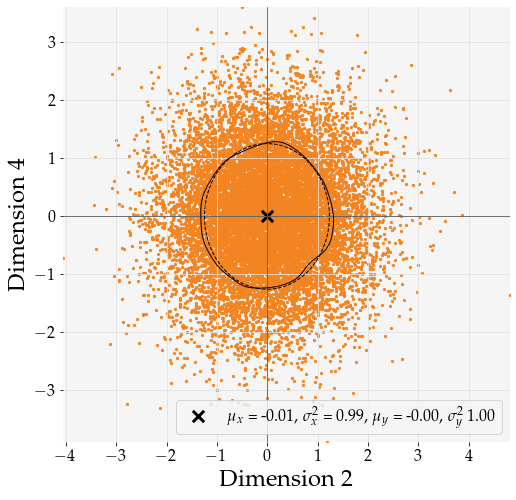

2021-07-30 16:53:56,658 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:56,658 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:56,658 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:56,659 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:56,659 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:56,659 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:56,660 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:56,660 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,660 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:56,661 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:57,562 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:57,562 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:57,562 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,562 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,563 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:57,563 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:57,563 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:57,563 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:57,564 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:57,564 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

2021-07-30 16:53:57,589 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:57,590 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:57,591 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:57,591 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:57,591 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:57,592 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:57,592 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:57,592 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:57,592 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,593 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,593 - DEBUG - fam

2021-07-30 16:53:57,620 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:57,620 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,620 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,621 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:57,621 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:53:57,621 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:57,625 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:57,625 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:57,626 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:57,626 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:53:57,653 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:57,654 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,654 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,654 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:57,654 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:57,655 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:57,656 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:57,656 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:57,656 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:57,657 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:53:57,683 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:57,683 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:57,683 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:57,683 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,684 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,684 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:57,684 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:53:57,685 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:57,686 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:57,686 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:53:57,713 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:57,714 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:57,714 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:57,714 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,714 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,715 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:57,715 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:57,715 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:57,715 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:57,716 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:57,747 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:57,748 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:57,749 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:57,749 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:57,750 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:57,750 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:57,750 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:57,751 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:57,751 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,751 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,751 - DEBUG - fam

2021-07-30 16:53:57,788 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:57,789 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:57,789 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:57,790 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,790 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,790 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:57,790 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dvi
2021-07-30 16:53:57,791 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:57,793 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:57,794 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:53:57,827 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:57,827 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:57,828 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:57,829 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,829 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,829 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:57,829 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:57,830 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:57,830 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:57,830 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:53:57,866 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:57,866 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:57,866 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:57,866 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:57,867 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:57,867 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,867 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,868 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:57,869 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/491cca92ef7fc4f0496df6cd4270a1ae.dvi
2021-07-30 16:53:57,869 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:53:57,905 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:57,905 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:57,905 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:57,906 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:57,906 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:57,906 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:57,907 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:57,907 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,907 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,908 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:57,944 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,945 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,945 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:57,946 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/be1054efb11919c0b518672140abdf0c.dvi
2021-07-30 16:53:57,946 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:57,947 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:57,948 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:57,948 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:57,953 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:57,954 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:53:57,993 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:57,993 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:57,993 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:57,993 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:57,994 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:57,995 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:57,995 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,995 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:57,996 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:57,996 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/5ba01290423d2dd279cd1135392ac508.dv

2021-07-30 16:53:58,121 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,121 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,121 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,122 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:58,122 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:58,122 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:58,122 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,123 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,123 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:58,123 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:53:58,160 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:58,161 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,161 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,162 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,162 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,162 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:58,162 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:58,163 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:58,163 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,163 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,164 - DEBUG - fam

2021-07-30 16:53:58,205 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:58,205 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:53:58,206 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:58,207 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,207 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,207 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,207 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,208 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:58,208 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:58,208 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:53:58,247 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,247 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,247 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,249 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:58,250 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:58,250 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:58,250 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,251 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,251 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:58,251 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dv

2021-07-30 16:53:58,294 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:58,295 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,295 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,296 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:58,296 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,296 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,297 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,297 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,297 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:58,297 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 

2021-07-30 16:53:58,343 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-07-30 16:53:58,344 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:58,346 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,346 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,347 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,347 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,347 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:58,348 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:58,348 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:58,348 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:53:58,383 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:58,384 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:58,384 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,385 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,385 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,386 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,386 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:58,387 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:58,387 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:58,387 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:53:58,425 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,426 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:58,426 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:53:58,427 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:58,428 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,428 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,428 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,429 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,429 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:58,429 - DEBUG - Textile font is not compatible with

2021-07-30 16:53:58,477 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,477 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,478 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,478 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,478 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:58,479 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:58,479 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:58,479 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,480 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,480 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:58,520 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:58,520 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:58,521 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:58,521 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,522 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,522 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:58,523 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,523 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,523 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,524 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:53:58,566 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,566 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,566 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:58,567 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/57a85119836865e916b48dc1a0450c8c.dvi
2021-07-30 16:53:58,567 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:58,569 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,570 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,570 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,571 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,571 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:53:58,612 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,612 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,613 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:58,613 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:53:58,614 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:58,615 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,615 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,616 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,616 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,616 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:53:58,654 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:58,655 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:58,655 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,655 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,656 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:58,656 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/798d56fe5d7b88c994356e1c10aa55a0.dvi
2021-07-30 16:53:58,657 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:58,658 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,658 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,659 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:53:58,700 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:58,701 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:58,701 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,702 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,703 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:58,703 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,704 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,704 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,704 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,705 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

2021-07-30 16:53:58,744 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:58,745 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,746 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:53:58,746 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:53:58,746 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:53:58,746 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:58,747 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:58,747 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:58,747 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,748 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,749 - DEBUG - fam

2021-07-30 16:53:58,796 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:53:58,796 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:53:58,796 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:53:58,797 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,797 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:53:58,798 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:53:58,799 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-07-30 16:53:58,799 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:53:58,801 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:53:58,801 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

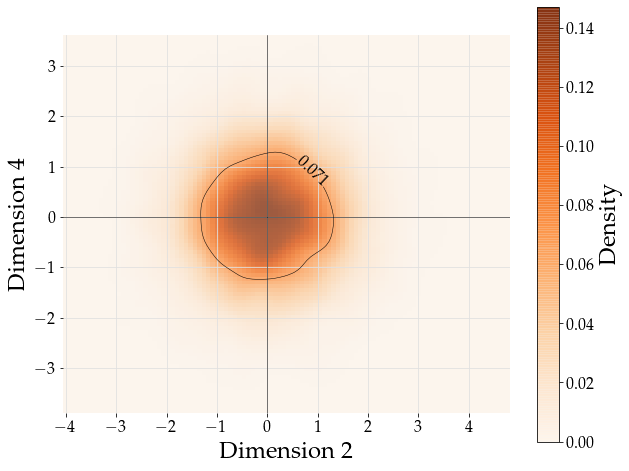

2021-07-30 16:54:00,974 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:00,975 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:00,975 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:00,975 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:00,976 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:00,976 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:00,976 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:00,977 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:00,977 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:00,977 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:01,013 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:01,013 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:01,014 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:01,014 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:01,015 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:01,015 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:01,015 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:01,015 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:01,016 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:01,016 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:01,051 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,051 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:01,052 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:01,052 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:01,053 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:01,054 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:01,054 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:01,054 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:01,054 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:01,055 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:01,103 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:01,103 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,103 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,104 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:01,104 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:01,106 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:01,107 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:01,108 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:01,108 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:01,108 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:01,149 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:01,149 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:01,149 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:01,150 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,150 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,150 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:01,151 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-07-30 16:54:01,151 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:01,153 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:01,153 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:01,192 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:01,193 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:01,193 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:01,195 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:01,202 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:01,202 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,203 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,203 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:01,203 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:01,204 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:01,336 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e2b83ee0a3928cb27e879242772e9f87.dvi
2021-07-30 16:54:01,337 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:01,806 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:01,807 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:01,807 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:01,807 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:01,808 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:01,808 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:01,808 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:01,809 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:01,844 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,844 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:01,845 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:01,845 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:01,846 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:01,846 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:01,847 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:01,847 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:01,848 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:01,848 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:01,886 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:01,886 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,886 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,887 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:01,887 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:01,887 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:01,888 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:01,889 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:01,889 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:01,889 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:01,927 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:01,928 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:01,928 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:01,928 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:01,929 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:01,929 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,929 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,930 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:01,931 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:01,931 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:01,978 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:01,978 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:01,979 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:01,979 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:01,979 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:01,980 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:01,980 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:01,980 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,980 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:01,981 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:02,018 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-07-30 16:54:02,019 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:02,020 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,021 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:02,021 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:02,021 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:02,021 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:02,022 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:02,022 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:02,022 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:02,060 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,062 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,062 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:02,063 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:02,064 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,064 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:02,064 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:02,065 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:02,065 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:02,065 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:02,105 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:02,105 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,105 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,106 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,106 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-07-30 16:54:02,107 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:02,109 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,111 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:02,111 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:02,111 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:02,155 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:02,155 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:02,155 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:02,156 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,156 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,156 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,156 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:54:02,157 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:02,158 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,158 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:02,307 - DEBUG - Embedding TeX font b'pplri8r' - fontinfo={'dvifont': <DviFont: b'pplri8r'>, 'pdfname': <Name b'F4'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/urw/palatino/uplri8a.pfb', 'basefont': b'URWPalladioL-Ital', 'encodingfile': '/usr/share/texlive/texmf-dist/fonts/enc/dvips/base/8r.enc', 'effects': {}}
2021-07-30 16:54:02,326 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,327 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:02,327 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:02,328 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:02,328 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:02,328 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:02,329 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\

2021-07-30 16:54:02,362 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,362 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,363 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,363 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:02,364 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:02,364 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,365 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:02,365 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:02,365 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:02,366 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:02,400 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:02,400 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:02,400 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,400 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,401 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,401 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:02,402 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:02,403 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,404 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:02,404 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:02,441 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:02,441 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:02,442 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,443 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,443 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,443 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,444 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:02,444 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:02,444 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:02,444 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:02,565 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:02,567 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,567 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:02,567 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:02,567 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:02,568 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:02,568 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:02,568 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:02,569 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,569 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,569 - DEBUG - fam

2021-07-30 16:54:02,612 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:02,613 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,613 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,613 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,614 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:02,614 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:02,617 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,617 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:02,618 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:02,618 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:02,665 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:02,665 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,666 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,666 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,667 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:02,668 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:02,668 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,669 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:02,669 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:02,669 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:02,708 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:02,708 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:02,708 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:02,709 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,709 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,709 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,710 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:54:02,711 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:02,712 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,712 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:02,756 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:02,757 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:02,757 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:02,757 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:02,757 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:02,758 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,758 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,760 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,760 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,761 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:02,799 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,799 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-07-30 16:54:02,800 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:02,801 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,801 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:02,801 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:02,802 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:02,802 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:02,803 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:02,803 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:02,838 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:02,838 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:02,838 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:02,838 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:02,839 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,839 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,839 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,839 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:54:02,840 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:02,847 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:02,988 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:02,988 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:02,988 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:02,989 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:02,990 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,990 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:02,991 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:02,991 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:02,991 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:02,992 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:03,340 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:03,340 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:03,341 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:03,341 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:03,341 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:03,342 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:03,342 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:03,346 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:03,348 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:03,348 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dv

2021-07-30 16:54:03,381 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:03,382 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:03,382 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:03,383 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:03,383 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:03,383 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:03,383 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:03,384 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:03,384 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:03,384 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:03,385 - DEBUG - fam

2021-07-30 16:54:03,420 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:03,420 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:03,421 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:03,421 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:03,422 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:03,422 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:03,422 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:03,423 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:03,423 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:03,423 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:03,463 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:03,463 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:03,464 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:03,464 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:03,465 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:03,465 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:03,465 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:03,465 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:03,466 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:03,466 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:54:03,503 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:03,503 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:03,503 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:03,504 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:03,505 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:03,506 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:03,506 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:03,506 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:03,507 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:03,509 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:03,551 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:03,551 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:03,552 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:03,553 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:03,554 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:03,554 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:03,555 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:03,555 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:03,555 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:03,556 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:03,595 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:03,596 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:03,598 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:03,598 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:03,599 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:03,599 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:03,599 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:03,599 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:03,600 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:03,600 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:03,636 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:03,637 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:03,638 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:03,638 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:03,639 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:03,639 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:03,639 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:03,640 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:03,640 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:03,640 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:03,684 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-07-30 16:54:03,685 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:03,686 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:03,686 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:03,687 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:03,687 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:03,687 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:03,688 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:03,688 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:03,688 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:03,732 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:03,733 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:03,733 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:03,733 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:03,734 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:03,734 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:03,734 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:54:03,737 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:03,739 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:03,739 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:04,705 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:54:04,706 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:04,707 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:04,707 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:04,707 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:04,708 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:04,708 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:04,708 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:04,708 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:04,709 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:04,766 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:04,767 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:04,767 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:04,767 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:04,768 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:04,768 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:04,768 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:04,768 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:04,769 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:04,769 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:04,796 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:04,796 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:04,797 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:04,797 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:04,797 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:04,797 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:04,798 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:04,798 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:04,798 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:04,798 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:04,825 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:04,826 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:04,826 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:04,826 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:04,827 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:04,829 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:04,829 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:04,829 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:04,830 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:04,830 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:04,856 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:04,856 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:04,856 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:04,857 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:04,857 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:04,857 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:04,857 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:04,857 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:04,858 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-07-30 16:54:04,859 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:04,891 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:04,893 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:04,893 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:04,893 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:04,894 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:04,894 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:04,894 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:04,895 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:04,895 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:04,895 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:04,933 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:04,935 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:04,936 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:04,937 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:04,938 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:04,938 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:04,938 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:04,939 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:04,941 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:04,941 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:04,941 - DEBUG - fam

2021-07-30 16:54:04,977 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:04,977 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:04,978 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:04,979 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:04,979 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:04,979 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:04,980 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:04,980 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:04,981 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:04,981 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:05,019 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,021 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,022 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,023 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:05,023 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,024 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,025 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,025 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,025 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,026 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:05,066 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,067 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,067 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,067 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,068 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,068 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,068 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,068 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:05,070 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,071 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:05,116 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,116 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,117 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,117 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:05,117 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,117 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,118 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,118 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,118 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,119 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:05,159 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,160 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,160 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,161 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dvi
2021-07-30 16:54:05,161 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,164 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,164 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,164 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,165 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,165 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:05,216 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,216 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,217 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,217 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dvi
2021-07-30 16:54:05,218 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,219 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,220 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,220 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,221 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,221 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:05,259 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,260 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:05,260 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,261 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,262 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,262 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:05,264 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,264 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,265 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,265 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:05,297 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,298 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,298 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,298 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6e669d4270a0d6fadcab81941d2c82f8.dvi
2021-07-30 16:54:05,299 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,301 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,301 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,301 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,302 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,302 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:05,343 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,343 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,343 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,344 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,344 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,344 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:05,344 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,345 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,345 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,345 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/798d56fe5d7b88c994356e1c10aa55a0.dv

2021-07-30 16:54:05,470 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,470 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,471 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,471 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,471 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,472 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:05,472 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,477 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,477 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,477 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:54:05,516 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,516 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,517 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,517 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,518 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,518 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,519 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,519 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:05,520 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,520 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,522 - DEBUG - fam

2021-07-30 16:54:05,559 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,559 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:54:05,560 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,561 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,562 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,562 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,562 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,563 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,563 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,563 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:05,596 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,596 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,596 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,596 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,597 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,597 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:05,597 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,597 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,598 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,598 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dv

2021-07-30 16:54:05,634 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:05,635 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,635 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,635 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,636 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,639 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,639 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,640 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,640 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,640 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:05,674 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-07-30 16:54:05,675 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,677 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,677 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,677 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,678 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,678 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,678 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,678 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:05,679 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:05,717 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:05,718 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,718 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,719 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,719 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,720 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,720 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,720 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,721 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:05,721 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:05,760 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,761 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,761 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:54:05,762 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,763 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,763 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,764 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,764 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,764 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,764 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:05,805 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,806 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,806 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,807 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,808 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,808 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,809 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,809 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,809 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:05,809 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:05,847 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,848 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,849 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,849 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,849 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:05,850 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,850 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,850 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,850 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,851 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:05,892 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,892 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,892 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,893 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dvi
2021-07-30 16:54:05,893 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,896 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,897 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,897 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,897 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,898 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:05,943 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,944 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:05,944 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,945 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,945 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,946 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,946 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,946 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:05,947 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:05,947 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:05,989 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,989 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:05,989 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:05,989 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/be1054efb11919c0b518672140abdf0c.dvi
2021-07-30 16:54:05,994 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:05,996 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:05,996 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:05,996 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:05,997 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:05,997 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:06,039 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:06,040 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:06,041 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:06,041 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:06,041 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:06,042 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:06,043 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:06,043 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:06,043 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:06,044 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:06,084 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:06,084 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:06,085 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:06,085 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:06,085 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:06,086 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:06,086 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:06,087 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:06,087 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:06,087 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

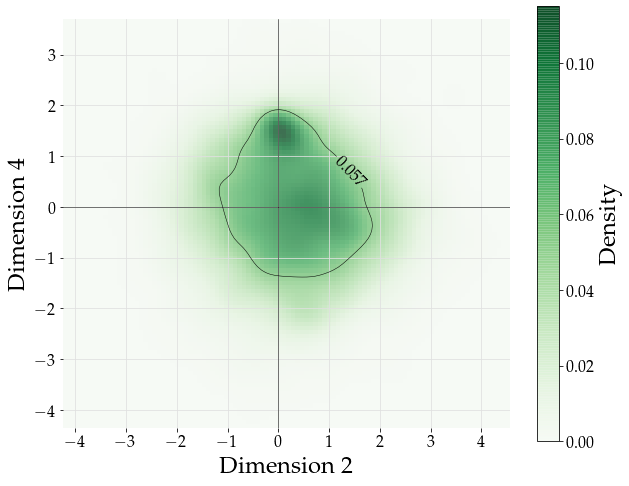

2021-07-30 16:54:08,287 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:08,287 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:08,288 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:08,288 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:08,288 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:08,289 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:08,289 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:08,290 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:08,290 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:08,290 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:08,321 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:08,322 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:08,322 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:08,323 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:08,329 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:08,329 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:08,330 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:08,330 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:08,330 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:08,331 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:08,371 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:08,372 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:08,372 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:54:08,373 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:08,378 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:08,379 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:08,379 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:08,380 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:08,380 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:08,380 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:08,426 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:08,426 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:08,427 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:08,427 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:08,428 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:08,428 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:08,429 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:08,429 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:08,429 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:08,430 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:08,465 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:08,465 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:08,465 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:08,465 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:08,466 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:08,466 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:08,467 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:54:08,467 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:08,468 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:08,468 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:08,521 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:08,522 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:08,522 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:08,522 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:08,523 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:08,524 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:08,525 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:08,525 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:08,526 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:54:08,526 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:09,114 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,115 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,115 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:09,116 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,116 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,116 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,117 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,118 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,118 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,118 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:09,155 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:09,157 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:09,157 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,157 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,158 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:09,158 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,158 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,159 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,159 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,159 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:09,195 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,195 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:09,196 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:54:09,197 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:09,200 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,200 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,200 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:09,203 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,207 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,207 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:09,248 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,249 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,249 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,249 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,249 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,252 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:09,255 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:54:09,255 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:09,258 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,258 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:09,289 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:09,290 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,290 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,290 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,291 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,291 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,291 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,291 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:09,292 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-07-30 16:54:09,293 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:09,327 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,328 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,328 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:09,329 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,329 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,329 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,329 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,330 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,330 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,330 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:09,370 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:09,371 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:09,371 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,372 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,372 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:09,372 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,373 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,373 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,373 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,373 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:09,416 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,416 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:09,416 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:54:09,417 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:09,419 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,420 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,420 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:09,420 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,421 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,421 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:09,470 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,471 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,471 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,471 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:09,474 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:09,474 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:09,475 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,475 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,476 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:09,476 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:09,643 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:09,644 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,644 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,645 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:09,645 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,645 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,646 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,646 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,646 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,647 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,647 - DEBUG - fam

2021-07-30 16:54:09,686 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:09,687 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:54:09,687 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:09,688 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,689 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,689 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:09,690 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,690 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,690 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,690 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:09,727 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:09,728 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,728 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,728 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:09,729 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,729 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,729 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,730 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,730 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,730 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:09,773 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,773 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,775 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,775 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,775 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,776 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,776 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:09,776 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,777 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,777 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:09,828 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,828 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,829 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:09,829 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-07-30 16:54:09,830 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:09,832 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,833 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,833 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:09,833 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,834 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:09,873 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,874 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,874 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,874 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,875 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:09,875 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:09,876 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:09,878 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,878 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,879 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:09,913 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,913 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,913 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,914 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,914 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,914 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,914 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:09,915 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:09,916 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:09,917 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:09,954 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:09,954 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:09,956 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:09,957 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:09,957 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,957 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:09,958 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:09,958 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,959 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:09,959 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:09,996 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:54:09,997 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:09,999 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:09,999 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:10,000 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:10,000 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:10,004 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:10,005 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:10,005 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:10,006 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:10,047 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:10,047 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:10,047 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:10,048 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,048 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,048 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:10,049 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:10,050 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:10,053 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:10,053 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:10,195 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:10,195 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:10,196 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:10,196 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,196 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,196 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:10,197 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:10,197 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:10,197 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:10,199 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:10,545 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:10,545 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:10,545 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:10,546 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:10,546 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:10,546 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,547 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,547 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:10,548 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:10,548 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:10,589 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:10,589 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:10,589 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:10,590 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:10,590 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:10,590 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:10,590 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:10,591 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,591 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,591 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:10,631 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:10,631 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:10,631 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:10,632 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:10,632 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:10,632 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,632 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,633 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:10,633 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:10,634 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:10,671 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,672 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,672 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:10,672 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:10,673 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:10,673 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:10,673 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:10,674 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:10,674 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:10,674 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:10,712 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:10,714 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:10,715 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:10,715 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:10,715 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:10,716 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:10,717 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:10,717 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:10,718 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,719 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,719 - DEBUG - fam

2021-07-30 16:54:10,762 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:10,762 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:10,763 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:10,763 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:10,764 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:10,764 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:10,765 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:10,765 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:10,766 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:10,766 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:10,802 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,803 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,803 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:10,803 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:10,804 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:10,805 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:10,805 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:10,806 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:10,806 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:10,806 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:10,847 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,847 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,847 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:10,847 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:10,848 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:10,848 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:10,848 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:10,848 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:10,849 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:10,849 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:10,890 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:10,891 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:10,891 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:10,892 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:10,892 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:10,892 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:10,892 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,893 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,893 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:10,893 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:54:10,932 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:10,934 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:10,938 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:10,939 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:10,942 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:10,942 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:10,942 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:10,943 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:10,943 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:10,943 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:11,082 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:11,082 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:11,083 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:11,084 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:11,084 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:11,084 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:11,085 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:11,085 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:11,086 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:11,086 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

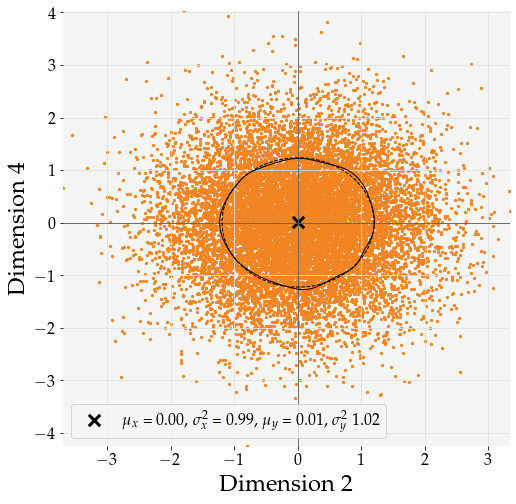

2021-07-30 16:54:11,148 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:11,148 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:11,148 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:11,149 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:11,149 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:11,149 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:11,150 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:11,150 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:11,150 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:11,151 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:11,983 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:11,983 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:11,983 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:11,983 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:11,983 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:11,984 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:11,984 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:11,984 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:11,985 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:11,985 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:12,012 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,012 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,012 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,012 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,013 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,013 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,013 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,013 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:54:12,015 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:12,016 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:12,041 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,042 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,042 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,042 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,042 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,043 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,043 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,043 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,043 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,044 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:12,071 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,071 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,071 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,072 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,072 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,072 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,072 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,073 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,073 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,073 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:54:12,102 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,102 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,102 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,103 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,103 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,103 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,103 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/67856056dc10071d8800bd076b632e1b.dvi
2021-07-30 16:54:12,104 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:12,106 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,106 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:12,135 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,135 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,136 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,136 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,136 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,136 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,137 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:12,137 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:12,137 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,138 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:12,166 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,166 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,166 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,166 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,167 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,167 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,167 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,167 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,168 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/798d56fe5d7b88c994356e1c10aa55a0.dvi
2021-07-30 16:54:12,169 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:12,196 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,196 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,196 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,196 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,197 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,197 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,197 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,198 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,199 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,199 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:12,226 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,228 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/491cca92ef7fc4f0496df6cd4270a1ae.dvi
2021-07-30 16:54:12,229 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:12,230 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,230 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,230 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,231 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,231 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,231 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,232 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:12,266 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,266 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,266 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,266 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,267 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,267 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,267 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,268 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,268 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,268 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dv

2021-07-30 16:54:12,387 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,387 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,387 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,388 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,388 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,389 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,389 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,389 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,389 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,390 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:54:12,424 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,424 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,424 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,425 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,425 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:12,427 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:12,429 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,431 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,431 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,432 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:12,469 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,469 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,470 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,470 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,470 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:12,471 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:12,472 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,472 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,473 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,473 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:12,514 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,514 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,514 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,515 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,517 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,518 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,518 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:54:12,519 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:12,519 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,520 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:12,553 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,554 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,554 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,554 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,555 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,555 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,556 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,556 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,556 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:12,557 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:12,597 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,597 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,597 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,597 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:12,598 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:12,599 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,600 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,600 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,600 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,600 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:12,646 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,646 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,646 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,648 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,648 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,648 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,649 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,649 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,649 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,650 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dv

2021-07-30 16:54:12,694 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,694 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,694 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,695 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,695 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,696 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,696 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,696 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,696 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,697 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:12,735 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,736 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,736 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,736 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dvi
2021-07-30 16:54:12,738 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:12,739 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,739 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,739 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,740 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,740 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:12,785 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,785 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,785 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,786 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,786 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,786 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:12,787 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:12,788 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,788 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,788 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:12,825 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,825 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,826 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,826 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,826 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,827 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,827 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,827 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/5ba01290423d2dd279cd1135392ac508.dvi
2021-07-30 16:54:12,829 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:12,831 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:12,868 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,868 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,869 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,869 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:12,869 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,869 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,870 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,870 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,870 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,871 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:12,907 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:12,908 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:12,908 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:12,908 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:12,908 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:12,909 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:12,909 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,910 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:12,910 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:12,910 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

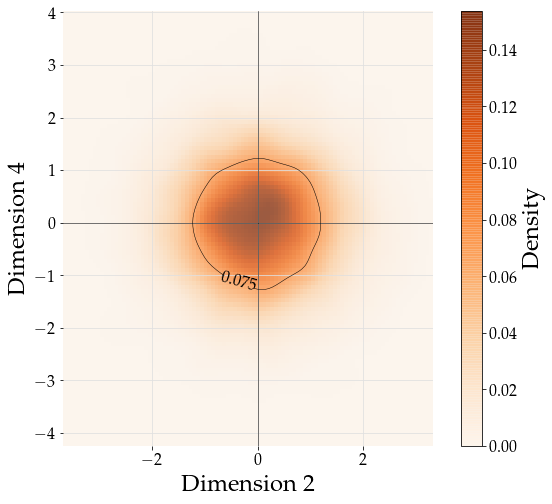

2021-07-30 16:54:15,106 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:15,106 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:15,107 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:15,107 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:15,107 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:15,108 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:15,108 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:15,109 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:15,109 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:15,109 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:15,147 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:15,147 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:15,148 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:15,148 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:15,148 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:15,149 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:15,150 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:15,151 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:15,151 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:15,152 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:15,190 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:15,190 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:15,191 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:54:15,192 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:15,193 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:15,194 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:15,194 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:15,195 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:15,195 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:15,196 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:15,251 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:15,251 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:15,252 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:15,252 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:15,252 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:15,253 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:15,254 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:15,255 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:15,255 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:15,256 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:15,291 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:15,293 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:15,293 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:15,294 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:15,294 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:15,294 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:15,295 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/643cf41e7951529fcc9a3fcb10c62b53.dvi
2021-07-30 16:54:15,296 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:15,297 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:15,297 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:15,335 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:15,335 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:15,336 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:15,336 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:15,336 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:15,336 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:15,337 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:15,337 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:15,338 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:54:15,339 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:15,941 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:15,942 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:15,942 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:15,943 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:15,943 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:15,943 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:15,944 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:15,944 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:15,945 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:15,945 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:15,977 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:15,979 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:15,980 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:15,980 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:15,981 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:15,981 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:15,981 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:15,982 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:15,982 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:15,982 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:16,020 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,021 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,021 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:54:16,022 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:16,023 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,023 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,023 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,024 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:16,024 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,024 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:16,072 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,072 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:16,073 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:16,073 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,074 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,074 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,074 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:54:16,075 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:16,077 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,077 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:16,114 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,114 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:16,114 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,115 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:16,115 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:16,115 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,115 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,116 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,116 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:16,117 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:16,148 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,149 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,149 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,149 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:16,150 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,150 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:16,150 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:16,150 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,151 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,151 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:16,187 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/ed13600b0516334410debb9bb94bb511.dvi
2021-07-30 16:54:16,188 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:16,189 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,190 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,190 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,190 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:16,191 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,191 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:16,191 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:16,192 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:16,239 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,239 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,239 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/643cf41e7951529fcc9a3fcb10c62b53.dvi
2021-07-30 16:54:16,240 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:16,242 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,242 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,243 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,243 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:16,243 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,245 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:16,289 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:16,289 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,290 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,290 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,290 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:16,291 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:16,291 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,292 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,292 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,292 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:16,459 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:16,462 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,466 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,467 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,467 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:16,467 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,468 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:16,468 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:16,468 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,469 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,469 - DEBUG - fam

2021-07-30 16:54:16,510 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,510 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:54:16,511 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:16,512 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,513 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,513 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,513 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:16,514 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,514 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:16,514 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:16,554 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,555 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,555 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,555 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,556 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,556 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,556 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:16,556 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,557 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:16,557 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:16,593 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,593 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,594 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:16,596 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,597 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:16,597 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:16,597 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,597 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,598 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,598 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:54:16,633 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,633 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,634 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:16,634 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:16,637 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,637 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,638 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,638 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:16,638 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,639 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:16,684 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,685 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,685 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:16,686 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:16,687 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,687 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,687 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,687 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:16,688 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,688 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:16,729 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:16,729 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,729 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,729 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,730 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/643cf41e7951529fcc9a3fcb10c62b53.dvi
2021-07-30 16:54:16,735 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:16,737 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,738 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,738 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,738 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:16,779 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,780 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:16,780 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:16,780 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,781 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,782 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,783 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,783 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,783 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,784 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:16,820 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:16,821 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,821 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,822 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,822 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:16,823 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:16,823 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:16,823 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:16,824 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,824 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,825 - DEBUG - fam

2021-07-30 16:54:16,858 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:16,858 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,858 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:16,858 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:16,859 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2a372c44497f81d554ba4741c0df8c05.dvi
2021-07-30 16:54:16,861 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:16,863 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:16,864 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:16,864 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:16,864 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:17,006 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:17,007 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,007 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,007 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:17,008 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:17,008 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:17,009 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:17,009 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:17,009 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,010 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:17,352 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,352 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:17,352 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:17,353 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,353 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,353 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:17,354 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:17,354 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:17,355 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:17,355 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:17,391 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:17,391 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:17,392 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,392 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:17,392 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:17,392 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,393 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,393 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:17,393 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:17,396 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:17,432 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:17,432 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:17,433 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,433 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:17,433 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:17,434 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,434 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,434 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:17,434 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-07-30 16:54:17,435 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:17,476 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,477 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,478 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:17,478 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:17,478 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:17,479 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:17,479 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:17,479 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,480 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:17,480 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:17,517 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:17,518 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:17,518 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:17,518 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,519 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:17,519 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:17,519 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,519 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,520 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:17,520 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dv

2021-07-30 16:54:17,557 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:17,558 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:17,558 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:17,558 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,558 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:17,559 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:17,559 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,559 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,559 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:17,564 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/81e412b12a1721960ca5638d3c9fa110.dv

2021-07-30 16:54:17,604 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:17,605 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:17,605 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:17,606 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:17,606 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:17,606 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,606 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:17,607 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:17,607 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,607 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,607 - DEBUG - fam

2021-07-30 16:54:17,647 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:17,647 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:17,647 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:17,647 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:17,648 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:17,648 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,648 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:17,649 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:17,650 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,650 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:17,687 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:17,687 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,688 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:17,688 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:17,689 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,689 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,689 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:17,690 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:17,690 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:17,691 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:17,727 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2a372c44497f81d554ba4741c0df8c05.dvi
2021-07-30 16:54:17,727 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:17,732 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:17,733 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:17,733 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:17,734 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:17,734 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,734 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:17,734 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:17,735 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:17,873 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:17,874 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:17,874 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:17,874 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:17,875 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,875 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:17,875 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:17,875 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,876 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,877 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

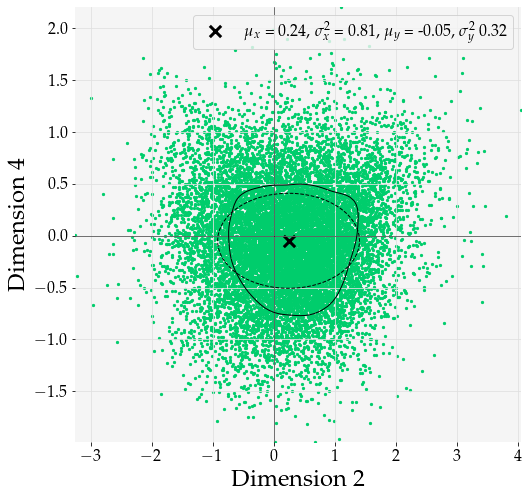

2021-07-30 16:54:17,928 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:17,928 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:17,929 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:17,929 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:17,930 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:17,930 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:17,930 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:17,931 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,931 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:17,932 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:18,810 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:18,810 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:18,810 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:18,810 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:18,811 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:18,811 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:18,811 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:18,811 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:18,812 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:18,812 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:54:18,840 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:18,840 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:18,840 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:18,841 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:18,841 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:18,841 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:18,841 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:54:18,842 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:18,843 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:18,843 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:18,871 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:18,871 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:18,872 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:18,872 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:18,872 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:18,873 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:18,873 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:18,873 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:18,873 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:18,874 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:18,905 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:18,906 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:18,907 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:18,907 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:18,908 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:18,908 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:18,908 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:18,908 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:18,909 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:18,909 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:18,936 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:18,936 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:18,936 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:18,937 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/50b063103f9808b81526cf7a814e0d24.dvi
2021-07-30 16:54:18,937 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:18,938 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:18,938 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:18,938 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:18,938 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:18,939 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:18,967 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:18,967 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:18,967 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:18,967 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:18,968 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:18,968 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:18,968 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:18,969 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:18,969 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:18,969 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:18,995 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:18,996 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:18,996 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:18,996 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:18,997 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:18,997 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:18,997 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:18,998 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:18,999 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,000 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,000 - DEBUG - fam

2021-07-30 16:54:19,027 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:19,028 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:19,028 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:19,028 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,028 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,028 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,029 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-07-30 16:54:19,030 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:19,031 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:19,031 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:19,142 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:19,142 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:19,144 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:19,144 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,145 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,145 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,146 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:19,146 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:19,147 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:19,147 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:19,195 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:19,195 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:19,196 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:19,196 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:19,196 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:19,197 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,197 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,197 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,197 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:19,198 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:19,234 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:19,234 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:19,234 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:19,235 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:19,235 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:19,235 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,236 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,236 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,236 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:19,236 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:19,266 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,266 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:54:19,267 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:19,268 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:19,268 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:19,271 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:19,271 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:19,271 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:19,272 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:19,272 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:19,305 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:19,305 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:19,305 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:19,306 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:19,306 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:19,306 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:19,307 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,307 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,308 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,308 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dv

2021-07-30 16:54:19,344 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:19,344 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:19,344 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:19,345 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:19,345 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:19,345 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:19,345 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,346 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,346 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,346 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:54:19,383 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:19,384 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:19,384 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:19,385 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,386 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,386 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,386 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:54:19,390 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:19,392 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:19,392 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:19,429 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,430 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,430 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,430 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:19,430 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:19,431 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:19,431 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:19,431 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:19,432 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:19,432 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:19,471 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,472 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dvi
2021-07-30 16:54:19,472 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:19,474 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:19,476 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:19,477 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:19,477 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:19,477 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:19,478 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:19,478 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:19,514 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,514 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,514 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,515 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:19,516 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:19,516 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:19,517 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:19,517 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:19,518 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:19,521 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:19,560 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,561 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,561 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,562 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dvi
2021-07-30 16:54:19,562 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:19,563 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:19,563 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:19,564 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:19,564 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:19,564 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:19,604 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:19,605 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:19,605 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:19,606 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:19,606 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:19,606 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:19,607 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,607 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,607 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,608 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/efec8296de9918f3450d8d95431443de.dv

2021-07-30 16:54:19,649 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:19,649 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:19,650 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:19,650 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,650 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:19,651 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:19,651 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:19,653 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:19,654 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:19,654 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

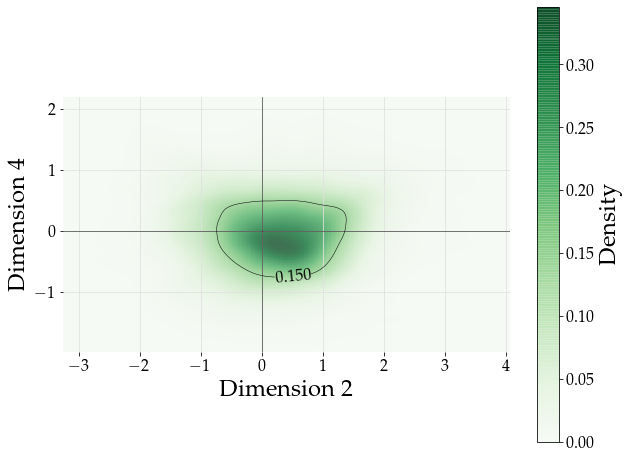

In [19]:
def gaussian2d(x, y, x_mu, x_var, y_mu, y_var):
    arg_x = (x - x_mu)**2 / (2*x_var**2)
    arg_y = (y - y_mu)**2 / (2*y_var**2)    
    return np.exp(-(arg_x + arg_y))

def fwhm(std):
    return 2*np.sqrt(2*np.log(2))*std

# Use standard custom styling
plt.style.use('../../utils/_extras/primary.mplstyle')

def latent_vis_2d(latent_vecs, dim_x: int = 2, dim_y: int = 4, save_name=None, color='C1', show_plots=True):

    # Code for setting up advanced plotting and graphing
    x_mean, x_var = latent_vecs[:, dim_x].mean(), latent_vecs[:, dim_x].var()
    y_mean, y_var = latent_vecs[:, dim_y].mean(), latent_vecs[:, dim_y].var()
    kde = gaussian_kde(latent_vecs[:, [dim_x, dim_y]].T)

    x_steps = np.linspace(latent_vecs[:, dim_x].min(), latent_vecs[:, dim_x].max(), 100)
    y_steps = np.linspace(latent_vecs[:, dim_y].min(), latent_vecs[:, dim_y].max(), 100)
    X, Y = np.meshgrid(x_steps, y_steps)
    Z = kde.evaluate(np.vstack([X.ravel(), Y.ravel()]))



    Zgaussian = gaussian2d(X, Y, x_mean, x_var, y_mean, y_var)

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(latent_vecs[:, dim_x], latent_vecs[:, dim_y], s=5, alpha=1., color=color)

    ax.contour(
        X, Y, Zgaussian, levels=[fwhm(Zgaussian.std())], 
        colors='k', linewidths=1., linestyles='--', alpha=1.0)
    ax.contour(
        X, Y, Z.reshape(X.shape), levels=[fwhm(Z.std())], 
        colors='k', linewidths=1., linestyles='-', alpha=1.0)

    ax.scatter([x_mean], [y_mean], color='k', marker='x', s=2**7, 
                label=r'$\mu_x$ = {:.2f}, $\sigma^2_x$ = {:.2f}, $\mu_y$ = {:.2f}, $\sigma^2_y$ {:.2f}'.format(x_mean, x_var, y_mean, y_var))

    ax.axhline(0, 0, c='k', lw=0.5)
    ax.axvline(0, 0, c='k', lw=0.5)
    ax.legend()
    ax.set_xlabel(f'Dimension {dim_x}')
    ax.set_ylabel(f'Dimension {dim_y}')

    if save_name is not None and isinstance(save_name, str):
        plt.savefig(f'LatentScatter-{save_name}.pdf', format='pdf',  bbox_inches='tight')
    plt.show()

    fig, ax = plt.subplots(1, 1, figsize=(10, 8))

    cb = ax.imshow(Z.reshape(X.shape), cmap='Oranges' if color=='C6' else 'Greens', 
              extent=[x_steps[0], x_steps[-1], y_steps[0], y_steps[-1]], origin='lower', alpha=0.75)
    c = ax.contour(X, Y, Z.reshape(X.shape), colors='k', levels=[fwhm(Z.std())], linewidths=0.5)

    ax.axhline(0, 0, c='k', lw=0.5)
    ax.axvline(0, 0, c='k', lw=0.5)
    ax.set_xlabel(f'Dimension {dim_x}')
    ax.set_ylabel(f'Dimension {dim_y}')
    ax.clabel(c, fontsize=16)
    
    cb = fig.colorbar(cb)
    cb.set_label('Density')
    
    if save_name is not None and isinstance(save_name, str):
        plt.savefig(f'LatentKDE-{save_name}.pdf', format='pdf',  bbox_inches='tight')
    plt.show()
    
for sn, res in lt_results.items():
    lt_vecs = np.stack(res['latent_vecs'], axis=0)
    color = 'C1' if 'AAE' in sn else 'C6'
    latent_vis_2d(lt_vecs, save_name=sn, color=color)

2021-07-30 16:54:22,234 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:22,235 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:22,235 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:22,235 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:22,236 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:22,237 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:22,237 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:22,238 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:22,238 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:22,238 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:22,278 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:22,280 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:22,282 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:22,282 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:22,283 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:22,283 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:22,283 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:22,284 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:22,284 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:22,284 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:22,322 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:22,322 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:22,322 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-07-30 16:54:22,323 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:22,331 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:22,333 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:22,334 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:22,334 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:22,334 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:22,335 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:22,371 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:22,372 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:22,372 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:22,372 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:22,374 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:22,375 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:22,377 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:22,377 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:22,377 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:22,378 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:22,414 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:22,414 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:22,415 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:22,415 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:22,415 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:22,415 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:22,416 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/14896f6a4e63cfb45d66ae52288a88e7.dvi
2021-07-30 16:54:22,416 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:22,425 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:22,431 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:22,684 - DEB

2021-07-30 16:54:22,719 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:22,720 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:22,720 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:22,720 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:22,721 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:22,721 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:22,721 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:22,721 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:22,722 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:22,722 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:22,761 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:22,761 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:22,762 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:22,762 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:22,763 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:22,763 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:22,763 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:22,764 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:22,764 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:22,764 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:22,801 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:22,801 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:22,801 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:22,802 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:22,803 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:22,804 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:22,804 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:22,804 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:22,804 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:22,805 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:22,841 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:22,841 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:22,841 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:22,841 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:22,842 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:22,843 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:22,843 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:22,844 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:22,844 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:22,844 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:23,908 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:23,908 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:23,909 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:23,909 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:23,909 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:23,909 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:23,910 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:23,910 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:23,911 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:23,911 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:23,911 - DEBUG - fam

2021-07-30 16:54:23,941 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:23,941 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:23,941 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:23,945 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:23,945 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:23,946 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:23,946 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:23,946 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:23,947 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:23,947 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:23,986 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:23,986 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:23,986 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:23,986 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:23,986 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:23,987 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-07-30 16:54:23,989 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:23,989 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:23,990 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:23,990 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:24,022 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:24,022 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:24,023 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:24,023 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:24,023 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,023 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,024 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:24,024 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:54:24,024 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:24,025 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:24,152 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:24,152 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:24,152 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:24,153 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:24,153 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:24,153 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:24,153 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,154 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,154 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:24,154 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-07-30 16:54:24,204 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:24,204 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:24,204 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:24,205 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:24,205 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:24,205 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:24,205 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:24,206 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:24,206 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,207 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,207 - DEBUG - fam

2021-07-30 16:54:24,337 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:24,337 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c5e8f6a64eefb12ed54839f8f9faa89a.dvi
2021-07-30 16:54:24,338 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:24,343 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:24,343 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:24,344 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:24,344 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:24,344 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:24,345 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:24,345 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:24,590 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:24,591 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:24,591 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:24,591 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:24,592 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:24,592 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:24,592 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:24,592 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:24,593 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:24,593 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:24,623 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:54:24,625 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:24,627 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:24,631 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:24,632 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:24,632 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:24,634 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:24,635 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:24,635 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:24,635 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:24,668 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:24,669 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:24,669 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:24,669 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,670 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,671 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:24,672 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:24,672 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:24,674 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:24,675 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:24,718 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:24,718 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:24,719 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:24,719 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,721 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,723 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:24,723 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:24,724 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:24,724 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:24,725 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:24,760 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:24,760 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:24,762 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:24,766 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:24,766 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:24,767 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,767 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,768 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:24,768 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:24,769 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:24,810 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,810 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,810 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:24,811 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:24,811 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:24,811 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:24,811 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:24,812 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:24,812 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:24,813 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:24,851 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:24,853 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:24,853 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:24,854 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:24,854 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:24,854 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:24,855 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:24,855 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:24,855 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,856 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:24,856 - DEBUG - fam

2021-07-30 16:54:24,999 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:24,999 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:25,000 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:25,000 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:25,000 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:25,001 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:25,001 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:25,001 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:25,002 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,002 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

<Figure size 720x720 with 0 Axes>

2021-07-30 16:54:25,160 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:25,167 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:25,223 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:25,230 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:25,332 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:25,337 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:25,518 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:25,519 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:25,519 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:25,519 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:25,520 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-0

2021-07-30 16:54:25,547 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:25,547 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:25,547 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,548 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,548 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:25,548 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:25,549 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:25,550 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:25,550 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:25,550 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:25,590 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,591 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,591 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:25,591 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:25,592 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:25,593 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:25,593 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:25,594 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:25,594 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:25,599 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:25,643 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:25,643 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:25,644 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:25,644 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:25,644 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:25,645 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:25,645 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:25,645 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:25,647 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,647 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,647 - DEBUG - fam

2021-07-30 16:54:25,686 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:25,687 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:25,688 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:25,688 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:25,688 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:25,688 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:25,689 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:25,689 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:25,689 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,689 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,690 - DEBUG - fam

2021-07-30 16:54:25,733 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:25,734 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:25,734 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:25,734 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:25,734 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:25,735 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:25,735 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:25,736 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:25,736 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,737 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:25,774 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:25,774 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:25,775 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:25,775 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:25,777 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,779 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,779 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:25,780 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:25,780 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:25,780 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:25,819 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:25,819 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:25,819 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,819 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,820 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:25,820 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6eafde7961efc9437c68c146d179b6d1.dvi
2021-07-30 16:54:25,821 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:25,822 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:25,822 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:25,823 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:25,964 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:25,966 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:25,966 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,966 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:25,967 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:25,967 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:25,967 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:25,969 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:25,970 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:25,971 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

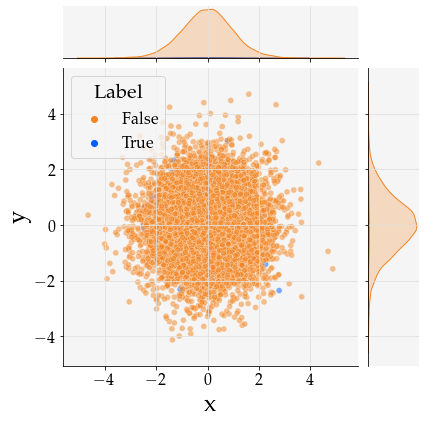

2021-07-30 16:54:26,063 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:26,063 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:26,064 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:26,064 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:26,064 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:26,065 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:26,065 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:26,066 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,066 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,067 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:26,100 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:26,102 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:26,102 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:26,102 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:26,103 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:26,103 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:26,103 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:26,103 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:26,104 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:26,104 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:26,150 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,150 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:26,151 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:54:26,152 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:26,153 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:26,154 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:26,154 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:26,155 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:26,155 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:26,155 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:26,198 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:26,199 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,200 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,201 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:26,201 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:26,202 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:26,202 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:26,203 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:26,203 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:26,203 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:26,247 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:26,247 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:26,247 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:26,248 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,249 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,249 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:26,250 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-07-30 16:54:26,250 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:26,252 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:26,252 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:26,663 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:26,663 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:26,664 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:26,664 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:26,665 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:26,665 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,665 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,665 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:26,666 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:26,666 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:26,702 - DEBUG - Assigning font /b'F1' = b'cmsy10' (dvi)
2021-07-30 16:54:26,702 - DEBUG - Assigning font /b'F2' = b'pplr8r' (dvi)
2021-07-30 16:54:26,704 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:26,704 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:26,705 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:26,705 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:26,705 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:26,705 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:26,706 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:26,706 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,706 - DEBUG - Bitstream Vera Sans Mono font is not compatible wit

2021-07-30 16:54:26,746 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:26,746 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-07-30 16:54:26,746 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:26,749 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:26,750 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:26,750 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:26,750 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:26,751 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:26,751 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:26,751 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:26,789 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,789 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,790 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:26,790 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:26,791 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:26,791 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:26,792 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:26,792 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:26,792 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:26,793 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:26,831 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:26,831 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:26,832 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,833 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,833 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:26,833 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:26,834 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:26,835 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:26,835 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:26,836 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:26,874 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:26,875 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:26,875 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:26,876 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:26,877 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,877 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:26,878 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:26,878 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:26,879 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:26,879 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:26,962 - DEBUG - Embedding TeX font b'cmsy10' - fontinfo={'dvifont': <DviFont: b'cmsy10'>, 'pdfname': <Name b'F1'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/public/amsfonts/cm/cmsy10.pfb', 'basefont': b'CMSY10', 'encodingfile': None, 'effects': {}}
2021-07-30 16:54:26,969 - DEBUG - Embedding Type-1 font b'pplr8r' from dvi.
2021-07-30 16:54:26,970 - DEBUG - Embedding TeX font b'pplr8r' - fontinfo={'dvifont': <DviFont: b'pplr8r'>, 'pdfname': <Name b'F2'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/urw/palatino/uplr8a.pfb', 'basefont': b'URWPalladioL-Roma', 'encodingfile': '/usr/share/texlive/texmf-dist/fonts/enc/dvips/base/8r.enc', 'effects': {}}
2021-07-30 16:54:27,006 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,006 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,006 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,007 - D

2021-07-30 16:54:27,044 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:27,044 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:27,044 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,045 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,045 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,045 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,046 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:27,046 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:27,047 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:27,047 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:27,078 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,078 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,079 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,079 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,082 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:27,083 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:27,084 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:27,086 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,087 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,087 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:27,117 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:54:27,117 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:27,118 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,118 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,118 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,118 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:27,119 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:27,119 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,119 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,119 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:27,155 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:27,156 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:27,157 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,157 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,158 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,158 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:27,159 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:27,159 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,159 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,160 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:27,197 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,198 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:27,198 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,198 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,199 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,199 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:27,199 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:27,200 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,200 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,200 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:27,237 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,237 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:27,238 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:27,238 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,239 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,239 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,240 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,240 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:27,240 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,240 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:27,289 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:27,289 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,290 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,290 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,290 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,291 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:27,291 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-07-30 16:54:27,292 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:27,293 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,297 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:27,380 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:27,380 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,380 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,381 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,381 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,381 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:27,382 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,382 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,383 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,384 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:27,587 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,588 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,588 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:27,588 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:27,589 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:27,590 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,590 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,591 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,591 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:27,591 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:27,628 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,629 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,629 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,630 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,630 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:27,630 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,631 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,631 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,631 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:27,632 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:27,668 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:27,669 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,670 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,670 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,670 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:27,671 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:27,671 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,671 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,672 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,672 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,672 - DEBUG - fam

2021-07-30 16:54:27,716 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,716 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,717 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:27,717 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:27,717 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,717 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,718 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,718 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,719 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:27,719 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dv

2021-07-30 16:54:27,760 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:27,761 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,761 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,762 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,763 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:27,763 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:27,763 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,764 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,764 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,764 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,765 - DEBUG - fam

2021-07-30 16:54:27,803 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:27,803 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,804 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:27,804 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,804 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,804 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:27,805 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:54:27,806 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:27,807 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,808 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:27,846 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,846 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,846 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:27,847 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,847 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,847 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,848 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:27,848 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:27,849 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:27,849 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:27,890 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,890 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:27,890 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:27,891 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e398d07b0d52461180ba9f5bce00f37a.dvi
2021-07-30 16:54:27,893 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:27,929 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:27,930 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:27,930 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:27,931 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:27,931 - DEBUG - Apple Chancery font is not compat

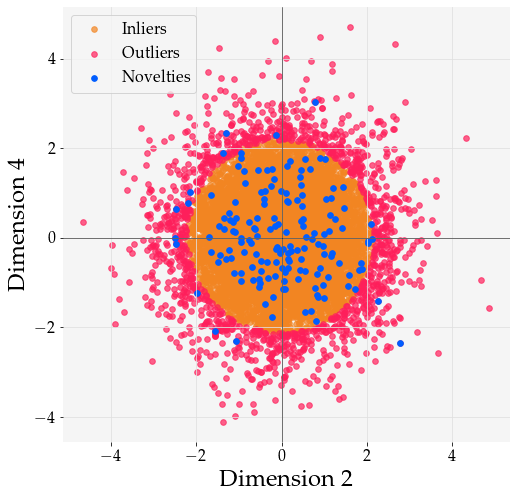

2021-07-30 16:54:28,136 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:28,137 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:28,137 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:28,138 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:28,138 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:28,138 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:28,139 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:28,139 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:28,139 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:28,139 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:28,871 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:28,872 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:28,872 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:28,873 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:28,873 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:28,873 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:28,873 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:28,874 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:28,874 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:28,875 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:28,902 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:28,902 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:28,903 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:28,903 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:28,903 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:28,904 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:28,904 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:28,904 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:28,904 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:28,905 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:28,938 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:28,939 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:28,939 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:28,940 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:28,940 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:28,941 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:28,942 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:28,942 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:28,942 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:28,943 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:28,984 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:28,984 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:28,985 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:28,986 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:28,986 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:28,987 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:28,987 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:28,988 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:28,988 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:28,990 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:29,030 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,030 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,031 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:29,031 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-07-30 16:54:29,032 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:29,033 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:29,033 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:29,034 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:29,035 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:29,035 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:29,070 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:29,071 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:29,071 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:29,071 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:29,072 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:29,072 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:29,072 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:29,073 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:29,073 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,073 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:29,115 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:29,115 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:29,116 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:29,117 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:29,117 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:29,117 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:29,118 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,118 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,118 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:29,118 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:54:29,170 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:29,171 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:29,171 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:29,172 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,172 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,173 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:29,174 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-07-30 16:54:29,174 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:29,176 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:29,176 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

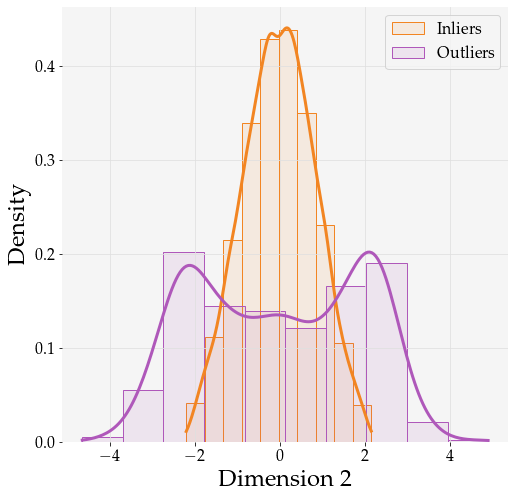

2021-07-30 16:54:29,322 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:29,323 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:29,323 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:29,323 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:29,324 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:29,324 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:29,326 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:29,327 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,328 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,330 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:29,371 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:29,372 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:29,373 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:29,373 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:29,374 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:29,374 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:29,374 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:29,375 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:29,376 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:29,376 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:29,420 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,420 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:29,421 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:54:29,422 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:29,424 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:29,424 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:29,424 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:29,425 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:29,425 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:29,425 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:29,457 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:29,458 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,458 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,458 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:29,458 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:29,459 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:29,460 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:29,460 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:29,461 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:29,464 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:29,505 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:29,505 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:29,506 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:29,506 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,506 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,506 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:29,508 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-07-30 16:54:29,509 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:29,563 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:29,563 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:29,982 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:29,983 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:29,983 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:29,983 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:29,983 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,984 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:29,984 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:29,984 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e5e322fdddbe6793c3847197ff838d63.dvi
2021-07-30 16:54:29,985 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:29,986 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:30,014 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,015 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,015 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:30,015 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:54:30,016 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:30,017 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:30,018 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:30,018 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:30,018 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:30,018 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:30,047 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,047 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,048 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:30,048 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-07-30 16:54:30,049 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:30,056 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:30,056 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:30,056 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:30,057 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:30,057 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:30,147 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:30,148 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:30,149 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:30,149 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:30,150 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:30,150 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:30,150 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:30,150 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:30,151 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:30,151 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:30,191 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,192 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,192 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:30,192 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:30,193 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:30,195 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:30,195 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:30,195 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:30,196 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:30,196 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:30,232 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:30,233 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:30,233 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:30,234 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:30,234 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:30,234 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:30,235 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,235 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,235 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:30,236 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dv

2021-07-30 16:54:30,286 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:30,286 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:30,286 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:30,287 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,287 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,287 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:30,294 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:30,296 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:30,297 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:30,297 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:30,339 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:30,339 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:30,339 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:30,340 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:30,340 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:30,340 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,340 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,341 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:30,341 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-07-30 16:54:30,342 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:30,382 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:30,382 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:30,382 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:30,383 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,383 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,383 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:30,383 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:30,384 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:30,384 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:30,384 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:30,424 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:30,424 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-07-30 16:54:30,424 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:30,426 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:30,426 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:30,427 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:30,427 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:30,427 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:30,427 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:30,428 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:30,479 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:30,480 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:30,480 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:30,481 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:30,481 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:30,481 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:30,481 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:30,482 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:30,482 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:30,482 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

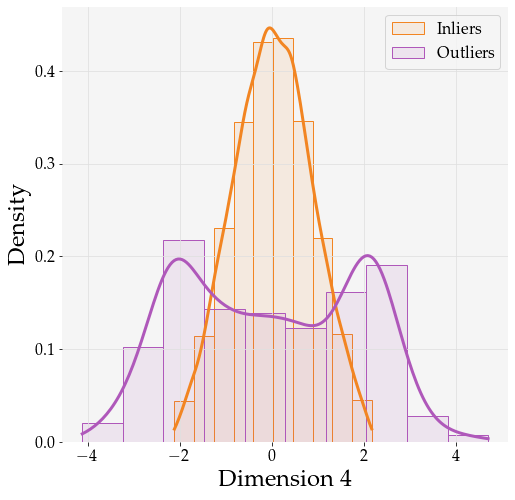

2021-07-30 16:54:33,062 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:33,063 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:33,063 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:33,063 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:33,064 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:33,064 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:33,064 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:33,065 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:33,066 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:33,066 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:33,101 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:33,106 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:33,106 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:33,107 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:33,107 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:33,107 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:33,108 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:33,108 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:33,108 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:33,109 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:33,142 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:33,143 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:33,143 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-07-30 16:54:33,144 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:33,151 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:33,152 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:33,152 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:33,153 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:33,153 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:33,153 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:33,191 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:33,191 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:33,191 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:33,192 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:33,192 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:33,193 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:33,194 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:33,195 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:33,195 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:33,195 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:33,231 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:33,232 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:33,232 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:33,232 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:33,232 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:33,233 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:33,233 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/14896f6a4e63cfb45d66ae52288a88e7.dvi
2021-07-30 16:54:33,234 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:33,242 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:33,248 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:33,496 - DEB

2021-07-30 16:54:33,526 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:33,527 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:33,527 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:33,527 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:33,528 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:33,528 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:33,528 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:33,529 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:33,529 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:33,530 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:33,565 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:33,567 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:33,567 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:33,567 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:33,568 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:33,568 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:33,568 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:33,568 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:33,569 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:33,569 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:33,609 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:33,609 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:33,609 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:33,611 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:33,612 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:33,613 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:33,614 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:33,614 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:33,615 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:33,615 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:33,655 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:33,656 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:33,656 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:33,656 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:33,658 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:33,659 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:33,659 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:33,660 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:33,660 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:33,660 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:34,749 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:34,749 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:34,750 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:34,750 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:34,750 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:34,751 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:34,751 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:34,751 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:34,752 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:34,752 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:34,752 - DEBUG - fam

2021-07-30 16:54:34,780 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:34,780 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:34,782 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:34,784 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:34,784 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:34,784 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:34,785 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:34,785 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:34,785 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:34,786 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:34,821 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:34,821 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:34,822 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:34,822 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:34,823 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:34,823 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-07-30 16:54:34,824 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:34,825 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:34,825 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:34,825 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:34,861 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:34,862 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:34,862 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:34,862 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:34,863 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:34,863 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:34,863 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:34,863 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:54:34,866 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:34,867 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:34,906 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:34,906 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:34,906 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:34,907 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:34,907 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:34,907 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:34,908 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:34,908 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:34,908 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:34,909 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-07-30 16:54:34,954 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:34,954 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:34,954 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:34,955 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:34,955 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:34,955 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:34,955 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:34,956 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:34,956 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:34,956 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:34,956 - DEBUG - fam

2021-07-30 16:54:35,086 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:35,087 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c5e8f6a64eefb12ed54839f8f9faa89a.dvi
2021-07-30 16:54:35,087 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:35,092 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:35,092 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:35,093 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:35,093 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:35,093 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:35,094 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:35,094 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:35,353 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:35,355 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:35,355 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:35,356 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:35,356 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:35,356 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:35,357 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:35,357 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:35,357 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:35,357 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:35,393 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:54:35,394 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:35,396 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:35,398 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:35,398 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:35,399 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:35,399 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:35,399 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:35,399 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:35,401 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:35,435 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:35,436 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:35,436 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:35,437 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:35,437 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:35,437 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:35,437 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:35,438 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:35,440 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:35,441 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:35,484 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:35,484 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:35,485 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:35,485 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:35,486 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:35,487 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:35,487 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:35,488 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:35,489 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:35,489 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:35,528 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:35,528 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:35,528 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:35,529 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:35,531 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:35,531 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:35,531 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:35,532 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:35,532 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:35,533 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:35,570 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:35,570 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:35,570 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:35,571 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:35,571 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:35,571 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:35,571 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:35,572 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:35,572 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:35,572 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:35,619 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:35,621 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:35,621 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:35,621 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:35,622 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:35,622 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:35,622 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:35,623 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:35,623 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:35,624 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:35,624 - DEBUG - fam

2021-07-30 16:54:35,752 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:35,753 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:35,753 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:35,753 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:35,754 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:35,754 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:35,754 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:35,755 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:35,755 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:35,755 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

<Figure size 720x720 with 0 Axes>

2021-07-30 16:54:35,907 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:35,914 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:35,968 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:35,974 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:36,074 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:36,081 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:36,263 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,264 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,264 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:36,264 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:36,265 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-0

2021-07-30 16:54:36,292 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:36,292 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:36,292 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,292 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,293 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:36,293 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:36,294 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:36,294 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,295 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,295 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:36,326 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,326 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,326 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:36,327 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:36,328 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:36,329 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,329 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,330 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:36,330 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:36,330 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:36,365 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:36,370 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,371 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,371 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:36,372 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:36,372 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:36,372 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:36,373 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:36,373 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,373 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,374 - DEBUG - fam

2021-07-30 16:54:36,410 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:36,412 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,412 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,412 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:36,413 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:36,414 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:36,414 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:36,415 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:36,415 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,415 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,415 - DEBUG - fam

2021-07-30 16:54:36,453 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:36,453 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,454 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,454 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:36,454 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:36,455 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:36,455 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:36,456 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:36,456 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,456 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:36,494 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:36,494 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:36,494 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:36,495 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:36,495 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,495 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,495 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:36,496 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,497 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,497 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:36,544 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:36,544 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:36,544 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,544 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,545 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:36,545 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6eafde7961efc9437c68c146d179b6d1.dvi
2021-07-30 16:54:36,546 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:36,549 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,550 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,550 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:36,688 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:36,688 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:36,688 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,689 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,689 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:36,690 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,690 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,690 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:36,691 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:36,691 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

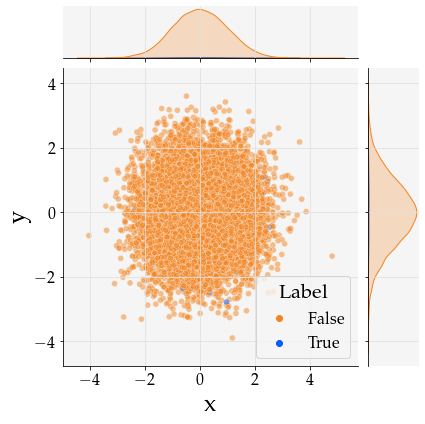

2021-07-30 16:54:36,788 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,789 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,789 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:36,789 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:36,790 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:36,790 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:36,790 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:36,790 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,791 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,792 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:36,827 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:36,827 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:36,828 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,828 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,828 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:36,828 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:36,829 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:36,829 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:36,832 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:36,832 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:36,883 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,884 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:36,885 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:54:36,886 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:36,887 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,887 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,888 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:36,888 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:36,888 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:36,889 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:36,924 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:36,925 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,925 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,925 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:36,926 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:36,927 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:36,927 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,928 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:36,928 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:36,928 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:36,969 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:36,969 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:36,969 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:36,971 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,971 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:36,971 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:36,972 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:54:36,973 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:36,977 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:36,978 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:37,029 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:37,029 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:37,031 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:37,032 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:37,032 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:37,032 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,033 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,033 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:37,033 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:37,034 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:37,465 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:37,465 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:37,465 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:37,466 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:37,467 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:37,467 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:37,468 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:37,468 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,468 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,469 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:37,516 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:37,516 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:37,517 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:37,519 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:37,519 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:37,520 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:37,520 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:37,521 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:37,521 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:37,521 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:37,568 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,569 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,569 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:37,569 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:37,571 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:37,573 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:37,574 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:37,575 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:37,575 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:37,575 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:37,621 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:37,621 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:37,621 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,622 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,622 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:37,622 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-07-30 16:54:37,624 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:37,625 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:37,626 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:37,626 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:37,660 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:37,661 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:37,661 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:37,661 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:37,662 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,663 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,663 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:37,663 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:37,664 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:37,664 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:37,705 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:37,705 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:37,706 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:37,706 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:37,707 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:37,707 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:37,707 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,710 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,711 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:37,711 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dv

2021-07-30 16:54:37,754 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:37,755 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:37,755 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:37,756 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:37,756 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:37,756 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:37,757 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:37,757 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:37,757 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,758 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,758 - DEBUG - fam

2021-07-30 16:54:37,855 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:37,855 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-07-30 16:54:37,858 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:37,867 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:37,867 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:37,868 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:37,868 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:37,868 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:37,869 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:37,869 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:37,948 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:37,948 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:37,949 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:37,949 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:37,949 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:37,950 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:37,950 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:37,950 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:37,951 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,951 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,951 - DEBUG - fam

2021-07-30 16:54:37,983 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:37,985 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:37,985 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:37,985 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:37,986 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:37,986 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:37,986 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:37,986 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:37,987 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,987 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:37,988 - DEBUG - fam

2021-07-30 16:54:38,020 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:38,021 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,021 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,021 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:38,021 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:38,026 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:38,028 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:38,028 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:38,028 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:38,029 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:38,082 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:38,082 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,082 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,082 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:38,083 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:38,084 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:38,084 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:38,085 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:38,085 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:38,086 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:38,124 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:38,125 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:38,125 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:38,125 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,126 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,127 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:38,127 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:54:38,128 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:38,129 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:38,129 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:38,167 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:38,168 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:38,168 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:38,169 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:38,169 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:38,169 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,169 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,170 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:38,170 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:38,170 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:38,681 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:38,682 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:38,682 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:38,682 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:38,682 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,683 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,683 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:38,683 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:38,683 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:38,684 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:38,712 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:38,712 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:38,713 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:38,713 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:38,713 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:38,713 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:38,714 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,714 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,714 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:38,714 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dv

2021-07-30 16:54:38,745 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:38,746 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:38,746 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:38,746 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,746 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,747 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:38,747 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:38,747 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:38,748 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:38,748 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:38,783 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:38,784 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:38,784 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:38,785 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:38,785 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:38,785 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:38,786 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:38,786 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:38,787 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,787 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,788 - DEBUG - fam

2021-07-30 16:54:38,829 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:38,830 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:38,831 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:38,831 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,831 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,832 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:38,832 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dvi
2021-07-30 16:54:38,834 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:38,836 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:38,837 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:38,921 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:38,921 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:38,921 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:38,922 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:38,922 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:38,922 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,922 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:38,923 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:38,923 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:38,923 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

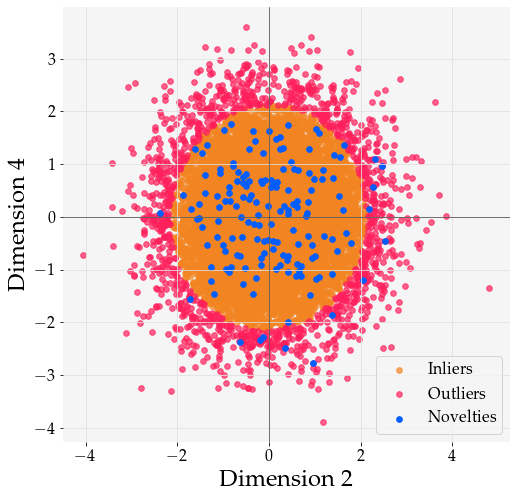

2021-07-30 16:54:39,153 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:39,153 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:39,154 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:39,154 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:39,154 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:39,155 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:39,155 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:39,156 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,156 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,156 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:39,195 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:39,196 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:39,197 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:39,198 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:39,198 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:39,198 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:39,202 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:39,203 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:39,203 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:39,204 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:39,246 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,247 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:39,247 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dvi
2021-07-30 16:54:39,248 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:39,249 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:39,250 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:39,251 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:39,251 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:39,251 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:39,251 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:39,291 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:39,292 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,292 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,292 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:39,293 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:39,294 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:39,295 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:39,295 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:39,298 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:39,298 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:39,338 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:39,339 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:39,339 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:39,340 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,340 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,342 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:39,343 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/f416d242fa7c68b0f76c3a53a55632c5.dvi
2021-07-30 16:54:39,343 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:39,344 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:39,345 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:39,388 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:39,388 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:39,388 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:39,389 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:39,389 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:39,389 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,389 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,390 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:39,390 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:39,391 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:39,483 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:39,483 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:39,483 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:39,484 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:39,484 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:39,484 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:39,485 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:39,485 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,485 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,486 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:39,528 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:39,529 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:39,531 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:39,533 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:39,534 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:39,534 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:39,535 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:39,535 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:39,535 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:39,539 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:39,581 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,581 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,581 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:39,581 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:39,583 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:39,583 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:39,583 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:39,584 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:39,584 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:39,585 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:39,619 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:39,619 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:39,619 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,620 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,620 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:39,620 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/50b063103f9808b81526cf7a814e0d24.dvi
2021-07-30 16:54:39,621 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:39,622 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:39,623 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:39,623 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:39,662 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:39,662 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:39,662 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:39,663 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:39,665 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,665 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:39,665 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:39,666 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:39,667 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:39,667 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:40,349 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:40,351 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:40,351 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:40,352 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:40,352 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:40,352 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:40,352 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:40,353 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:40,353 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,353 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,353 - DEBUG - fam

2021-07-30 16:54:40,380 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:40,381 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:40,382 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:40,382 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:40,382 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:40,383 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:40,383 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:40,383 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:40,383 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:40,384 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:40,410 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:40,410 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dvi
2021-07-30 16:54:40,412 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:40,413 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:40,413 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:40,414 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:40,414 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:40,414 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:40,414 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:40,415 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:40,443 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:40,444 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:40,444 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:40,444 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:40,444 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,445 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,445 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:40,445 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/efec8296de9918f3450d8d95431443de.dvi
2021-07-30 16:54:40,447 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:40,448 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:40,475 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,476 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,476 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:40,476 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:40,477 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:40,477 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:40,477 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:40,477 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:40,478 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:40,478 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:40,509 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:40,509 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-07-30 16:54:40,510 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:40,511 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:40,512 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:40,512 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:40,512 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:40,513 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:40,513 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:40,513 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

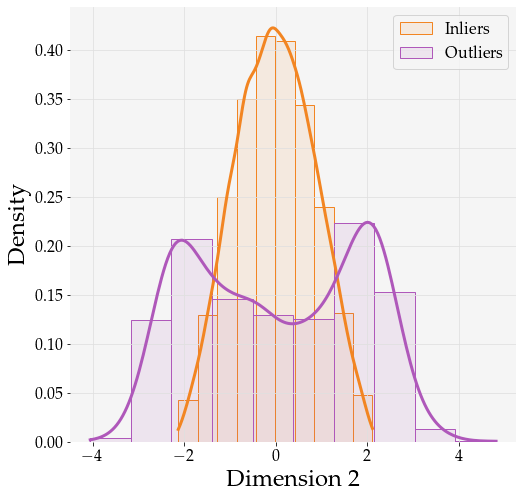

2021-07-30 16:54:40,725 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:40,725 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:40,726 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:40,726 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:40,726 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:40,727 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:40,727 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:40,728 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,728 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,728 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:40,775 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:40,775 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:40,776 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:40,776 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:40,777 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:40,777 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:40,777 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:40,777 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:40,778 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:40,778 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:40,822 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,824 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:40,824 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:40,825 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:40,826 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:40,826 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:40,826 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:40,827 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:40,827 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:40,827 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:40,868 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:40,868 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,869 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,869 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:40,869 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:40,872 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:40,873 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:40,874 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:40,875 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:40,876 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:40,925 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:40,925 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:40,926 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:40,926 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,926 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:40,927 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:40,927 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dvi
2021-07-30 16:54:40,928 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:40,932 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:40,932 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:41,038 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:41,038 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:41,039 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:41,039 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:41,039 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:41,040 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,040 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,040 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:41,041 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:41,042 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:41,079 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:41,079 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:41,079 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:41,080 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:41,080 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:41,080 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:41,081 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:41,081 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,081 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,081 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:41,118 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:41,120 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:41,122 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:41,123 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:41,123 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:41,123 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:41,123 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:41,125 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:41,125 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:41,126 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:41,170 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,172 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,172 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:41,173 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:54:41,173 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:41,175 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:41,176 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:41,177 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:41,177 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:41,177 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:41,229 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:41,229 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:41,230 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,230 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,231 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:41,231 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:41,232 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:41,232 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:41,232 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:41,233 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:41,278 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:41,278 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:41,278 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:41,279 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:41,279 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,279 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,280 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:41,280 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-07-30 16:54:41,281 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:41,282 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:41,332 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:41,332 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:41,333 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:41,333 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:41,333 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:41,334 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:41,334 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,334 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,334 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:41,335 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dv

2021-07-30 16:54:41,368 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:41,369 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:41,369 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:41,369 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:41,369 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:41,370 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:41,370 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:41,370 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:41,370 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,371 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,371 - DEBUG - fam

2021-07-30 16:54:41,430 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:41,430 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:41,430 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:41,430 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:41,431 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:41,431 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:41,431 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,431 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:41,432 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:41,432 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dv

2021-07-30 16:54:42,016 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:42,016 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:42,016 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:42,016 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:42,017 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:42,017 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:42,017 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:42,017 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:42,018 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:42,020 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:42,045 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:42,045 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:42,045 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:42,045 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:42,046 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:42,046 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:42,046 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:42,048 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:42,049 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:42,050 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:42,077 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:42,078 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:42,078 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:42,078 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:42,078 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:42,079 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:42,079 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:42,079 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:42,079 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:42,080 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:42,106 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:42,108 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:42,108 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:42,109 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-07-30 16:54:42,109 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:42,110 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:42,110 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:42,111 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:42,111 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:42,111 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:42,146 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:42,146 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:42,146 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:42,146 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:42,147 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:42,147 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:42,147 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:42,147 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:42,148 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:42,148 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

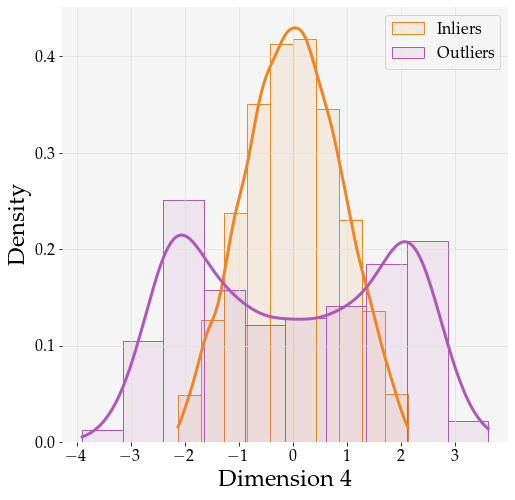

2021-07-30 16:54:45,306 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:45,306 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:45,307 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:45,307 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:45,307 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:45,307 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:45,308 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:45,308 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:45,308 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:45,309 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:45,341 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:45,345 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:45,346 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:45,348 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:45,348 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:45,348 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:45,348 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:45,349 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:45,349 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:45,349 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:45,384 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:45,384 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:45,385 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-07-30 16:54:45,385 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:45,392 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:45,392 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:45,393 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:45,394 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:45,395 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:45,395 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:45,438 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:45,439 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:45,439 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:45,439 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:45,440 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:45,441 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:45,441 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:45,442 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:45,442 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:45,442 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:45,486 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:45,486 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:45,486 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:45,486 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:45,487 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:45,487 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:45,487 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/14896f6a4e63cfb45d66ae52288a88e7.dvi
2021-07-30 16:54:45,488 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:45,496 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:45,503 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:45,752 - DEB

2021-07-30 16:54:45,783 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:45,784 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:45,784 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:45,784 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:45,785 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:45,785 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:45,785 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:45,785 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:45,786 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:45,786 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:45,822 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:45,823 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:45,824 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:45,824 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:45,825 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:45,825 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:45,825 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:45,826 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:45,826 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:45,826 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:45,860 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:45,860 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:45,861 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:45,861 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:45,862 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:45,863 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:45,863 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:45,864 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:45,864 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:45,864 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:45,907 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:45,908 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:45,908 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:45,908 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:45,909 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:45,910 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:45,911 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:45,911 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:45,912 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:45,912 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:47,007 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:47,008 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:47,008 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:47,008 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:47,009 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:47,009 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,010 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,010 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:47,010 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,011 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,011 - DEBUG - fam

2021-07-30 16:54:47,041 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:47,042 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:47,045 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:47,047 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:47,047 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:47,047 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:47,048 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:47,048 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,048 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,049 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:47,089 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,090 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:47,090 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,090 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,090 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:47,091 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-07-30 16:54:47,091 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:47,093 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:47,093 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:47,094 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:47,137 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:47,137 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,137 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,138 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:47,138 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,138 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,139 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:47,139 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:54:47,140 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:47,140 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:47,185 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:47,186 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:47,186 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:47,186 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,187 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,187 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:47,188 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,188 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,189 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:47,189 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-07-30 16:54:47,234 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:47,235 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:47,235 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:47,235 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:47,236 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:47,236 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,236 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,237 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:47,237 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,238 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,238 - DEBUG - fam

2021-07-30 16:54:47,374 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:47,374 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c5e8f6a64eefb12ed54839f8f9faa89a.dvi
2021-07-30 16:54:47,374 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:47,380 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:47,381 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:47,381 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:47,382 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:47,382 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,382 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,382 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:47,629 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:47,629 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:47,630 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:47,630 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:47,631 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:47,631 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:47,631 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,634 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,635 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:47,635 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:47,683 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:54:47,683 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:47,685 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:47,685 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:47,686 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:47,686 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:47,686 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,687 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,687 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:47,688 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:47,724 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,725 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,725 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:47,725 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,726 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,726 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:47,727 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:47,727 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:47,730 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:47,731 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:47,768 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,769 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,769 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:47,769 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,769 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,770 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:47,770 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:47,771 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:47,771 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:47,772 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:47,814 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:47,814 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:47,815 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,815 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,815 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:47,815 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,816 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,817 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:47,817 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:47,818 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:47,858 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,858 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,858 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:47,859 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:47,859 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:47,861 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:47,861 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:47,862 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,862 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,862 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:47,903 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:47,905 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:47,905 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:47,905 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:47,906 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:47,906 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:47,907 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:47,907 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:47,907 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,907 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:47,908 - DEBUG - fam

2021-07-30 16:54:48,041 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:48,042 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:48,042 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:48,044 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:48,044 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:48,045 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:48,045 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:48,045 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:48,046 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,046 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

<Figure size 720x720 with 0 Axes>

2021-07-30 16:54:48,204 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:48,211 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:48,267 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:48,273 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:48,376 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:48,382 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:48,565 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:48,565 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:48,565 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:48,566 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:48,566 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-0

2021-07-30 16:54:48,593 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:48,594 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:48,594 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,594 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,594 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:48,595 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:48,595 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:48,596 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:48,596 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:48,596 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:48,626 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,626 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,626 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:48,626 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:48,628 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:48,630 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:48,630 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:48,630 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:48,631 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:48,631 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:48,664 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:48,665 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:48,665 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:48,665 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:48,666 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:48,666 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:48,667 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:48,667 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:48,667 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,667 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,668 - DEBUG - fam

2021-07-30 16:54:48,703 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:48,705 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:48,705 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:48,705 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:48,706 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:48,706 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:48,706 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:48,707 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:48,707 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,707 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,707 - DEBUG - fam

2021-07-30 16:54:48,751 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:48,751 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:48,752 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:48,752 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:48,752 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:48,752 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:48,753 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:48,754 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:48,754 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,756 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:48,791 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:48,792 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:48,793 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:48,798 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:48,798 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,798 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,799 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:48,799 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:48,799 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:48,800 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:48,845 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:48,846 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:48,847 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,848 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,849 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:48,849 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6eafde7961efc9437c68c146d179b6d1.dvi
2021-07-30 16:54:48,850 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:48,852 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:48,852 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:48,852 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:48,992 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:48,993 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:48,994 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,994 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:48,998 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:48,999 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:48,999 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:49,000 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:49,000 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:49,001 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

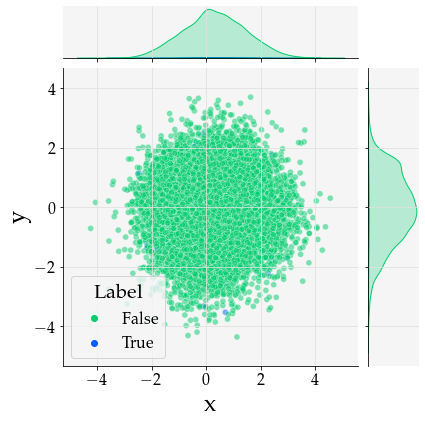

2021-07-30 16:54:49,094 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:49,095 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:49,095 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:49,096 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:49,096 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:49,096 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:49,097 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:49,097 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,097 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,098 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:49,139 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:49,139 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:49,140 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:49,140 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:49,141 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:49,141 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:49,141 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:49,141 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:49,142 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:49,142 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:49,196 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,196 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:49,197 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:54:49,198 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:49,199 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:49,200 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:49,200 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:49,200 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:49,200 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:49,201 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:49,240 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:49,241 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,241 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,241 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:49,242 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:49,242 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:49,243 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:49,243 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:49,244 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:49,249 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:49,284 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:49,285 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:49,285 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:49,286 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,287 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,288 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:49,289 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:54:49,289 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:49,290 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:49,290 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:49,339 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:49,340 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:49,340 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:49,340 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:49,340 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:49,341 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,342 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,345 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:49,346 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:49,346 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:49,880 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:49,881 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:49,881 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:49,881 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:49,881 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:49,882 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:49,882 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:49,882 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,883 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,883 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:49,922 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:49,922 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:49,924 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:49,925 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:49,925 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:49,925 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:49,926 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:49,926 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:49,926 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:49,927 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:49,974 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,974 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:49,974 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:49,974 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-07-30 16:54:49,975 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:49,977 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:49,977 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:49,977 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:49,977 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:49,978 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:50,011 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,011 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,012 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,012 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,012 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:50,013 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:50,014 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:50,015 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:50,015 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:50,015 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:50,052 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:50,052 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,053 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,053 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,053 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,054 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,054 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:50,054 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:50,055 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:50,056 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:50,094 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:50,094 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:50,095 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:50,095 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,095 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,096 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,096 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,096 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,096 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:50,097 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dv

2021-07-30 16:54:50,139 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:50,141 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:50,142 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:50,142 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:50,142 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:50,142 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,143 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,143 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,143 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,144 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,144 - DEBUG - fam

2021-07-30 16:54:50,182 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:50,182 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:50,183 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:50,184 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:50,184 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:50,185 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:50,185 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:50,185 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,186 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,187 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:50,390 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:50,390 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:50,391 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:50,391 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:50,391 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,392 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,392 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,392 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,392 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,393 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:50,430 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:50,431 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:50,431 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:50,431 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:50,432 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:50,432 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:50,432 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,434 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,435 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,435 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:50,473 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:50,474 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:50,474 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:50,475 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:50,475 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,476 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,476 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,476 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,477 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,477 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:50,515 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,516 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,516 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,517 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,517 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,517 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:50,518 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-07-30 16:54:50,519 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:50,521 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:50,521 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:50,563 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,564 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,564 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,564 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,565 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,565 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:50,566 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:50,567 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:50,568 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:50,568 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:50,615 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:50,615 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:50,615 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,615 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,616 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,616 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,616 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,617 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:50,618 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:54:50,618 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:50,658 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:50,658 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:50,659 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:50,659 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:50,659 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,660 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,660 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,660 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,660 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,661 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:50,697 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,697 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,698 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:50,698 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-07-30 16:54:50,699 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:50,702 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:50,703 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:50,703 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:50,703 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:50,704 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:50,749 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:50,750 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:50,750 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:50,750 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,751 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,754 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,755 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,755 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,756 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:50,756 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dv

2021-07-30 16:54:50,795 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,795 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,796 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,796 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,796 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,797 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:50,798 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:50,798 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:50,799 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:50,799 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:50,935 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:50,936 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:50,936 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:50,936 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,937 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:50,937 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:50,938 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-07-30 16:54:50,939 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:50,945 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:50,945 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:51,264 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:51,264 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:51,264 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:51,265 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:51,265 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:51,266 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:51,266 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:51,267 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:51,267 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:51,268 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:51,303 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:51,304 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:51,304 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:51,305 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:51,305 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:51,306 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:51,306 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:51,308 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:51,308 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:51,308 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:51,350 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:51,350 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:51,350 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:51,351 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:51,351 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:51,352 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:51,353 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:51,354 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:51,354 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:51,355 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:51,397 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:51,397 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:51,397 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:51,398 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:51,398 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:51,398 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:51,399 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:51,399 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:51,400 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
IOPub message rate exceeded.
The notebook server will temporarily stop sending o

2021-07-30 16:54:51,971 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:51,972 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:51,972 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:51,972 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:51,973 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:51,973 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:51,973 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:51,973 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:51,974 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:51,974 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:51,976 - DEBUG - fam

2021-07-30 16:54:52,009 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:52,009 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:52,010 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:52,011 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:52,011 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:52,011 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:52,012 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:52,012 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:52,012 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:52,012 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:52,050 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,050 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,051 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:52,051 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-07-30 16:54:52,052 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:52,110 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:52,110 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:52,111 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:52,111 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:52,111 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:52,152 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:52,152 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:52,152 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,153 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,153 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:52,153 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:52,153 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:52,154 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:52,154 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:52,155 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:52,209 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:52,210 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:52,211 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:52,211 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:52,211 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:52,212 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:52,212 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,212 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,212 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:52,213 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dv

2021-07-30 16:54:52,255 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:52,258 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:52,262 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:52,263 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:52,263 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:52,264 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:52,264 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:52,265 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:52,265 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,265 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,266 - DEBUG - fam

2021-07-30 16:54:52,298 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:52,298 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:52,299 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:52,299 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:52,300 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:52,300 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:52,300 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:52,300 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:52,301 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:52,301 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:52,338 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,338 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,339 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:52,341 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/f416d242fa7c68b0f76c3a53a55632c5.dvi
2021-07-30 16:54:52,341 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:52,342 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:52,343 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:52,343 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:52,343 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:52,344 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:52,393 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:52,393 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:52,394 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,394 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,394 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:52,395 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/efec8296de9918f3450d8d95431443de.dvi
2021-07-30 16:54:52,396 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:52,399 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:52,399 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:52,399 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:52,448 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:52,448 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:52,449 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:52,450 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:52,450 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,451 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,452 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:52,453 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-07-30 16:54:52,453 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:52,456 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:52,509 - DEBUG - Embedding TeX font b'cmsy10' - fontinfo={'dvifont': <DviFont: b'cmsy10'>, 'pdfname': <Name b'F1'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/public/amsfonts/cm/cmsy10.pfb', 'basefont': b'CMSY10', 'encodingfile': None, 'effects': {}}
2021-07-30 16:54:52,516 - DEBUG - Embedding Type-1 font b'pplr8r' from dvi.
2021-07-30 16:54:52,516 - DEBUG - Embedding TeX font b'pplr8r' - fontinfo={'dvifont': <DviFont: b'pplr8r'>, 'pdfname': <Name b'F2'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/urw/palatino/uplr8a.pfb', 'basefont': b'URWPalladioL-Roma', 'encodingfile': '/usr/share/texlive/texmf-dist/fonts/enc/dvips/base/8r.enc', 'effects': {}}
2021-07-30 16:54:52,529 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:52,529 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:52,530 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:52,530 - D

2021-07-30 16:54:52,567 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:52,568 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:52,568 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:52,568 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:52,568 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,569 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,569 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:52,569 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:52,570 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:52,571 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:52,609 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:52,610 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:52,610 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,610 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:52,611 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:52,611 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:52,612 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:52,614 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:52,614 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:52,614 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:52,649 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:54:52,650 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:52,651 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:52,652 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:52,652 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:52,653 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:52,653 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:52,654 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:52,654 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:52,655 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:53,211 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:53,211 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:53,211 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,211 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,212 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:53,212 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:53,212 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:53,212 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:53,213 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:53,213 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

2021-07-30 16:54:53,241 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:53,243 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:53,244 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:53,244 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:53,244 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:53,244 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:53,245 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:53,245 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:53,245 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,245 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,246 - DEBUG - fam

2021-07-30 16:54:53,275 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:53,275 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:53,275 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:53,276 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:53,276 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:53,276 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:53,277 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:53,277 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:53,278 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,278 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,278 - DEBUG - fam

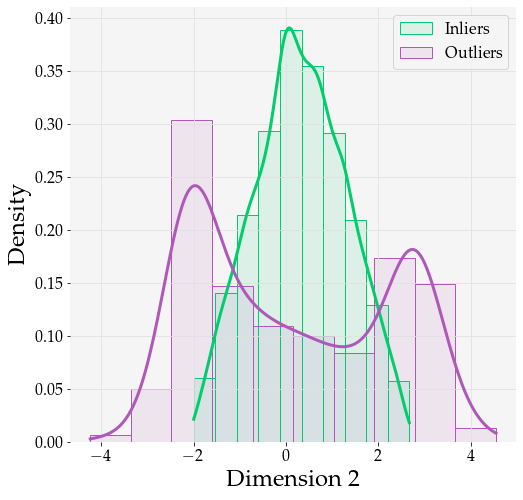

2021-07-30 16:54:53,467 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:53,468 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:53,468 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:53,469 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:53,469 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:53,469 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:53,469 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:53,470 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,470 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,470 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:53,505 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:53,507 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:53,507 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:53,509 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:53,509 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:53,510 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:53,514 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:53,515 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:53,515 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:53,515 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:53,551 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,551 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:53,551 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:53,552 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:53,553 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:53,554 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:53,554 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:53,554 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:53,554 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:53,555 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:53,598 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:53,599 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,599 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,599 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:53,600 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:53,600 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:53,602 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:53,602 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:53,603 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:53,603 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:53,651 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:53,652 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:53,652 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:53,653 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,653 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,653 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:53,654 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/50b063103f9808b81526cf7a814e0d24.dvi
2021-07-30 16:54:53,654 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:53,655 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:53,656 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:53,692 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:53,692 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:53,692 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:53,698 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:53,698 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:53,699 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,699 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,699 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:53,700 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:53,700 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:53,750 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:53,750 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:53,750 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:53,752 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:53,752 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:53,753 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:53,753 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:53,753 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,754 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,754 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:53,850 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:54:53,850 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:53,852 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:53,852 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:53,854 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:53,855 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:53,855 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:53,856 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:53,856 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:53,856 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:53,893 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,893 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:53,894 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:53,894 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:53,895 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:53,896 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:53,897 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:53,898 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:53,898 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:53,898 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:53,938 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:53,939 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:53,939 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:53,940 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,940 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,940 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:53,941 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-07-30 16:54:53,942 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:53,944 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:53,945 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:53,988 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:53,989 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:53,989 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:53,989 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:53,989 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:53,990 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,990 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:53,992 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:53,993 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:53,994 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:54,031 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:54,032 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:54,032 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:54,033 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:54,033 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:54,033 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:54,033 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:54,034 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,034 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,035 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:54,076 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/efec8296de9918f3450d8d95431443de.dvi
2021-07-30 16:54:54,077 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:54,078 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:54,078 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:54,078 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:54,078 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:54,079 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:54,079 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:54,079 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:54,079 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:54,117 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,117 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:54,117 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dvi
2021-07-30 16:54:54,118 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:54,120 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:54,120 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:54,121 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:54,121 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:54,121 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:54,122 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:54,167 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:54,168 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,168 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,168 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:54,168 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/f416d242fa7c68b0f76c3a53a55632c5.dvi
2021-07-30 16:54:54,170 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:54,172 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:54,173 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:54,173 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:54,174 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:54,212 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:54,214 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:54,214 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:54,215 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,216 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,216 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:54,216 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-07-30 16:54:54,217 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:54,225 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:54,225 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:54,302 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,302 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,302 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:54,302 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-07-30 16:54:54,303 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:54,305 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:54,305 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:54,306 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:54,306 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:54,306 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:54:54,344 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:54,345 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:54,345 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,345 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,346 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:54,346 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:54,347 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:54,348 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:54,348 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:54,348 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:54,386 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:54,386 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:54,386 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:54,387 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:54,387 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,387 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,387 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:54,388 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:54,389 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:54,390 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:54,435 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,435 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:54,435 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:54,436 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:54,436 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:54,436 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:54,436 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:54,438 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:54,438 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:54,438 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:55,112 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:55,113 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:55,113 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:55,113 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:55,114 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:55,114 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:55,114 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:55,114 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:55,115 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:55,115 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:55,115 - DEBUG - fam

2021-07-30 16:54:55,142 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:55,143 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:55,143 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:55,143 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:55,143 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/f416d242fa7c68b0f76c3a53a55632c5.dvi
2021-07-30 16:54:55,144 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:55,147 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:55,147 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:55,148 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:55,148 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:55,176 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:55,176 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:55,176 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:55,176 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:55,177 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:55,177 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:55,177 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:55,178 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:55,178 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:55,178 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

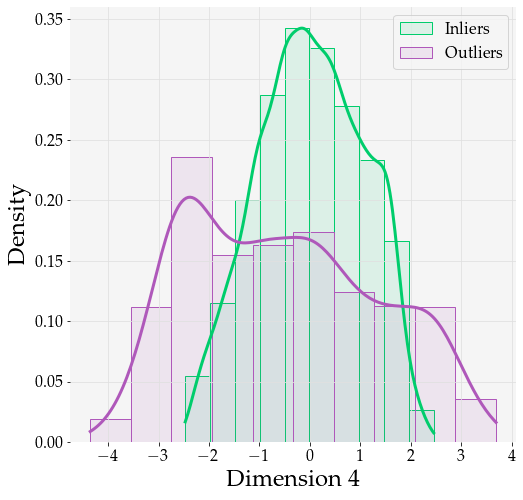

2021-07-30 16:54:57,415 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:57,416 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:57,416 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:57,417 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:57,417 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:57,417 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:57,418 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:57,418 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:57,418 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:57,418 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:57,450 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:57,451 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:57,452 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:57,452 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:57,454 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:57,455 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:57,455 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:57,455 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:57,456 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:57,456 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:57,491 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:57,492 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:57,493 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-07-30 16:54:57,495 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:57,503 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:57,504 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:57,505 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:57,505 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:57,505 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:57,506 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:57,541 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:57,542 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:57,542 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:57,542 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:57,543 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:57,543 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:57,545 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:57,545 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:57,546 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:57,546 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:57,581 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:57,582 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:57,582 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:57,582 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:57,583 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:57,583 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:57,583 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/14896f6a4e63cfb45d66ae52288a88e7.dvi
2021-07-30 16:54:57,585 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:57,593 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:57,600 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:54:57,848 - DEB

2021-07-30 16:54:57,878 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:57,878 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:57,878 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:57,879 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:57,879 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:57,879 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:57,879 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:57,880 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:57,880 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:57,880 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:54:57,914 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:57,915 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:57,916 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:57,916 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:57,917 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:57,917 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:57,917 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:57,917 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:57,918 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:57,918 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:57,949 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:57,951 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:57,952 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:54:57,953 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:57,954 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:57,954 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:57,954 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:57,955 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:57,955 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:57,955 - DEBUG - Textile font is not compatible with

2021-07-30 16:54:58,012 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:58,012 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:58,012 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:58,013 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:58,013 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:58,014 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:58,014 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:58,015 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:58,015 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:58,015 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:54:59,090 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:59,091 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:59,091 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:59,092 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:59,092 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:59,092 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,092 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,093 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:59,093 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,094 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,094 - DEBUG - fam

2021-07-30 16:54:59,123 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:59,123 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:59,124 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:59,127 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:59,127 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:59,127 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:59,128 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:59,128 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,128 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,128 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:59,166 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,166 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:59,166 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,166 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,167 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:59,167 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-07-30 16:54:59,168 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:59,169 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:59,170 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:59,170 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:54:59,205 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:59,205 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,206 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,206 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:59,206 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,206 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,207 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:59,207 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:54:59,208 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:59,211 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:54:59,255 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:59,255 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:59,255 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:59,255 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,256 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,256 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:59,256 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,256 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,257 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:59,257 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-07-30 16:54:59,307 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:59,308 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:59,308 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:59,308 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:59,309 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:59,309 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,309 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,310 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:59,311 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,311 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,311 - DEBUG - fam

2021-07-30 16:54:59,448 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:59,448 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c5e8f6a64eefb12ed54839f8f9faa89a.dvi
2021-07-30 16:54:59,449 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:59,454 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:59,454 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:59,455 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:59,455 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:59,455 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,456 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,457 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:54:59,707 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:59,707 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:59,708 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:59,708 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:59,709 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:59,709 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:59,709 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,710 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,710 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:59,710 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:59,749 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:54:59,750 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:59,752 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:59,752 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:59,752 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:59,752 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:59,753 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,753 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,754 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:59,754 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:54:59,799 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,800 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,800 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:59,801 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,801 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,801 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:59,802 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:59,802 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:59,805 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:59,805 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:59,848 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,848 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,849 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:59,849 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,849 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,850 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:59,851 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:54:59,851 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:59,852 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:59,853 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:54:59,890 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:59,890 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:59,891 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,891 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,891 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:59,892 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,892 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,894 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:59,894 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:54:59,895 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:54:59,938 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,938 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,939 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:54:59,939 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:59,939 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:59,939 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:59,940 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:59,940 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,940 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,941 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:54:59,983 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:54:59,985 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:54:59,985 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:54:59,985 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:54:59,986 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:54:59,986 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:54:59,986 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:54:59,987 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:54:59,987 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,987 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:54:59,988 - DEBUG - fam

2021-07-30 16:55:00,117 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:00,117 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:00,118 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:00,120 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:00,120 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:00,120 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:00,121 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:00,121 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:00,121 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,121 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

<Figure size 720x720 with 0 Axes>

2021-07-30 16:55:00,279 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:55:00,286 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:55:00,340 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:55:00,346 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:55:00,445 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:55:00,451 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:55:00,622 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:00,623 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:00,623 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:00,624 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:00,624 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-0

2021-07-30 16:55:00,652 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:00,652 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:00,652 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,653 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,653 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:00,653 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:00,654 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:00,655 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:00,655 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:00,656 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:00,683 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,683 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,684 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:00,684 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:55:00,686 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:00,687 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:00,687 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:00,688 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:00,688 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:00,688 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:00,718 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:00,719 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:00,719 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:00,720 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:00,720 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:00,721 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:00,721 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:00,722 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:00,722 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,722 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,723 - DEBUG - fam

2021-07-30 16:55:00,767 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:00,768 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:00,769 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:00,769 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:00,769 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:00,769 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:00,770 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:00,770 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:00,770 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,771 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,771 - DEBUG - fam

2021-07-30 16:55:00,819 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:00,820 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:00,821 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:00,821 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:00,821 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:00,822 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:00,822 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:00,822 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:00,823 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,824 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:00,860 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:00,861 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:00,861 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:00,862 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:00,862 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,862 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,863 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:00,863 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:00,864 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:00,864 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:00,901 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:00,901 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:00,902 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,902 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:00,902 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:00,903 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6eafde7961efc9437c68c146d179b6d1.dvi
2021-07-30 16:55:00,904 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:00,906 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:00,906 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:00,906 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:01,039 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:01,040 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:01,040 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,040 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,041 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:01,041 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:01,042 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:01,042 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:01,042 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:01,043 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

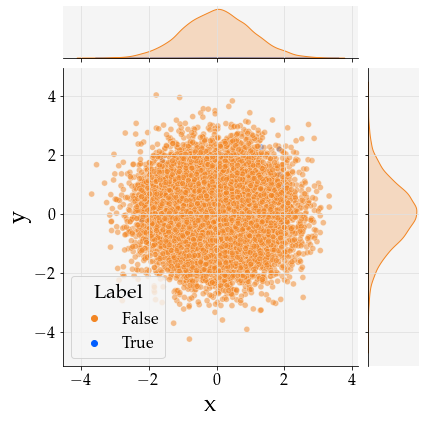

2021-07-30 16:55:01,150 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:01,151 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:01,151 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:01,151 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:01,152 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:01,152 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:01,152 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:01,152 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,153 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,153 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:01,190 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:01,190 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:01,191 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:01,191 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:01,192 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:01,192 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:01,193 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:01,193 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:01,193 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:01,193 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:01,230 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,231 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:01,232 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:55:01,233 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:01,234 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:01,234 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:01,234 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:01,234 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:01,235 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:01,235 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:01,287 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:01,288 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,288 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,288 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:01,289 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:01,290 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:01,291 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:01,291 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:01,292 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:01,294 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:01,339 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:01,340 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:01,340 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:01,340 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,341 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,341 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:01,341 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:55:01,342 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:01,348 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:01,348 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:01,394 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:01,394 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:01,395 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:01,395 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:01,396 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:01,396 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,396 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,397 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:01,397 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:01,398 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:01,929 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:01,929 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:01,929 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:01,930 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:01,930 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:01,931 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:01,931 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:01,931 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,932 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:01,932 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:01,965 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:55:01,965 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:01,966 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:01,968 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:01,969 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:01,969 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:01,969 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:01,971 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:01,972 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:01,972 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:02,013 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,013 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,013 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,014 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:55:02,014 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:02,016 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:02,019 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,020 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:02,020 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,020 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:02,060 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:02,061 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:02,061 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,061 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,062 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,062 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-07-30 16:55:02,063 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:02,065 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:02,065 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,065 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:02,096 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,096 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:02,097 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:02,097 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:02,097 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,097 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,098 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,098 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:55:02,099 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:02,100 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:55:02,143 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,143 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:02,144 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,144 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:02,144 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:02,144 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:02,145 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,145 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,145 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,146 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-07-30 16:55:02,191 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:02,192 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:02,192 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,193 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:02,193 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,193 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:02,194 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:02,194 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:02,194 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,195 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,195 - DEBUG - fam

2021-07-30 16:55:02,336 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,337 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-07-30 16:55:02,338 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:02,343 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:02,343 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,343 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:02,344 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,344 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:02,344 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:02,345 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:02,425 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:02,426 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:02,426 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,426 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:02,427 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,427 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:02,427 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:02,427 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:02,428 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,428 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,428 - DEBUG - fam

2021-07-30 16:55:02,463 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,463 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:55:02,464 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:02,465 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:02,465 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,466 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:02,466 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,466 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:02,469 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:02,470 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:02,513 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,514 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:02,514 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,514 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:02,515 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,515 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:02,515 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:02,515 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:02,516 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,516 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:02,560 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,560 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:02,561 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:02,561 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:02,561 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,562 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,562 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,562 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:02,563 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,563 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:02,603 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,604 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,605 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,605 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-07-30 16:55:02,606 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:02,607 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:02,607 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,608 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:02,608 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,608 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:02,648 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,649 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,649 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,649 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:02,651 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:02,652 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:02,652 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,653 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:02,653 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,653 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:02,691 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,691 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,691 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,692 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:55:02,693 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:02,694 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:02,694 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,695 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:02,695 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,695 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:02,729 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,729 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:02,730 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,730 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:02,730 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:02,731 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:02,731 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,732 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,732 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,732 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dv

2021-07-30 16:55:02,777 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:02,777 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:02,778 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:02,778 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:02,778 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:02,779 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:02,779 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,779 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,779 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,780 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:55:02,916 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:02,919 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:02,919 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:02,920 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,920 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:02,920 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:02,921 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-07-30 16:55:02,922 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:02,927 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:02,927 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:03,235 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:03,235 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:03,235 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:03,236 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:03,236 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:03,236 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:03,236 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:03,238 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:03,238 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:03,238 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:03,280 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:03,281 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:03,281 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:03,287 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:03,288 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:03,288 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:03,289 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:03,290 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:03,290 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:55:03,291 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:03,334 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:03,334 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:03,334 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:03,335 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:03,335 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:03,335 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:03,336 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:03,336 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:03,336 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:03,337 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:03,373 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:03,374 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:55:03,374 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:03,377 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:03,378 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:03,378 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:03,378 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:03,379 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:03,379 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:03,380 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:03,420 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:03,420 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:03,421 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:03,421 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:03,421 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:03,422 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:03,422 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:03,423 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:03,423 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:03,423 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dv

2021-07-30 16:55:04,007 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,007 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:04,008 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-07-30 16:55:04,009 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:04,011 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:04,011 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:04,012 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:04,012 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:04,012 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:04,013 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:04,097 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:04,098 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,098 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,098 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:04,098 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:04,099 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:04,100 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:04,100 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:04,100 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:04,102 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:04,143 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:04,143 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:04,143 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:04,144 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,144 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,144 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:04,145 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:55:04,146 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:04,148 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:04,148 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:04,184 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:04,184 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:04,184 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:04,185 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:04,185 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:04,186 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,186 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,186 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:04,187 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:55:04,187 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:04,238 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:55:04,238 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:04,240 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:04,241 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:04,241 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:04,241 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:04,242 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:04,242 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:04,242 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:04,243 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:04,283 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,283 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:04,283 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:04,284 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:04,285 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:04,285 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:04,285 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:04,285 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:04,286 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:04,286 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:04,318 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:04,319 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,319 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,319 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:04,319 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dvi
2021-07-30 16:55:04,321 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:04,323 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:04,325 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:04,325 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:04,325 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:04,365 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:04,365 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:04,365 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:04,365 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,366 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,366 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:04,366 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-07-30 16:55:04,368 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:04,369 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:04,370 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:04,421 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:04,421 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:04,421 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:04,422 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:04,422 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:04,422 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,422 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,423 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:04,423 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-07-30 16:55:04,425 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:04,488 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:04,488 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:04,488 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:04,489 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,489 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,489 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:04,490 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:55:04,491 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:04,492 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:04,492 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:04,529 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:04,530 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:04,530 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:04,530 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:04,531 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:04,532 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,532 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,532 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:04,534 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:04,535 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:04,573 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:04,573 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:04,576 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:04,578 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,578 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,578 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:04,579 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-07-30 16:55:04,579 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:04,581 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:04,581 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:04,621 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:04,621 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:04,623 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:04,625 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:04,626 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:04,626 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:04,626 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:04,627 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:04,627 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:04,628 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:05,194 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-07-30 16:55:05,195 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:05,196 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:05,197 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:05,197 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:05,197 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:05,197 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:05,198 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:05,198 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:05,198 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:05,226 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:05,226 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:05,226 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:05,227 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:05,227 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:05,227 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,227 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,228 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:05,228 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-07-30 16:55:05,230 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:05,265 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:05,265 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:05,265 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:05,265 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:05,266 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:05,266 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,266 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,266 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:05,267 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:05,267 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

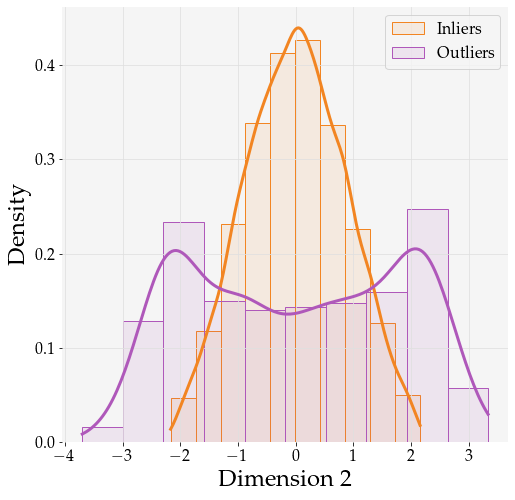

2021-07-30 16:55:05,503 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:05,504 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:05,504 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:05,504 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:05,505 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:05,505 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:05,505 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:05,505 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,506 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,506 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:05,547 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:05,547 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:05,548 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:05,548 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:05,549 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:05,549 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:05,549 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:05,549 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:05,550 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:05,550 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:05,599 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,600 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:05,600 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:55:05,601 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:05,602 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:05,603 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:05,603 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:05,604 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:05,604 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:05,604 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:05,641 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:05,643 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,644 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,644 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:05,645 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:05,645 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:05,646 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:05,646 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:05,646 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:05,647 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:05,688 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:05,688 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:05,691 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:05,692 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,693 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,693 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:05,693 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-07-30 16:55:05,694 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:05,748 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:05,748 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:05,791 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:05,791 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:05,791 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:05,792 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:05,792 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:05,792 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,792 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,793 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:05,794 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:05,795 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:05,837 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:55:05,837 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:05,841 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:05,841 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:05,842 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:05,842 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:05,842 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:05,842 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:05,843 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:05,843 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:05,880 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,880 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:05,880 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:55:05,881 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:05,882 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:05,883 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:05,883 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:05,883 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:05,884 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:05,884 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:05,915 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:05,915 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,915 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,915 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:05,916 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:05,917 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:05,918 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:05,925 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:05,926 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:05,926 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:05,965 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:05,965 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:05,965 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:05,966 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,966 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:05,966 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:05,966 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:55:05,968 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:05,968 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:05,969 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:06,021 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:06,021 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:06,021 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:06,022 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:06,026 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:06,027 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,027 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,027 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:06,028 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-07-30 16:55:06,029 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:06,086 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:06,086 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:06,086 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:06,087 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,087 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,087 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:06,088 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:06,088 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:06,090 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:06,091 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:06,141 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:06,142 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:06,142 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:06,142 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,143 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,144 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:06,145 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:55:06,145 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:06,147 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:06,147 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:06,186 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:06,187 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:06,187 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:06,188 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:06,188 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:06,188 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:06,189 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:06,190 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:06,190 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,190 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:06,236 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:06,237 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:06,237 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:06,238 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:06,238 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:06,239 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:06,239 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:06,240 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:06,241 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,241 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,241 - DEBUG - fam

2021-07-30 16:55:06,282 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:06,282 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:06,283 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:06,284 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:06,284 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:06,285 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:06,285 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:06,285 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:06,286 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:06,286 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:06,333 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:06,333 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:06,333 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:06,333 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:06,334 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:06,334 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:06,335 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,335 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,335 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:06,336 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:55:06,382 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:06,382 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,382 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,383 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:06,384 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-07-30 16:55:06,384 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:06,387 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:06,387 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:06,387 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:06,388 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:06,452 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:06,452 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,452 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,453 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:06,453 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:06,453 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:06,454 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:06,454 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:06,454 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:06,455 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:06,567 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:06,567 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,569 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,570 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:06,570 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:55:06,571 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:06,573 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:06,574 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:06,574 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:06,575 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:06,627 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:06,629 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,629 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:06,629 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:06,630 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:06,630 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:06,631 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:06,631 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:06,632 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:06,632 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:08,997 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:08,997 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:08,997 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:08,998 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:08,998 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:08,998 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:08,999 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:09,000 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:09,000 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:09,000 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:09,035 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:09,035 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:09,035 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:09,036 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:09,036 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,037 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,038 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:09,038 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35fc8a5d7b792fb5dcda0900f8005783.dvi
2021-07-30 16:55:09,039 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:09,040 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:55:09,084 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:09,085 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:09,085 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:09,085 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:09,086 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:09,086 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:09,086 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,086 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,087 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:09,087 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:55:09,127 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:09,128 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:09,128 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:09,129 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:09,129 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:09,129 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:09,130 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:09,130 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:09,131 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,131 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,131 - DEBUG - fam

2021-07-30 16:55:09,431 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,431 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,432 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:09,432 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:55:09,433 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:09,434 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:09,434 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:09,435 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:09,435 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:09,435 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:09,463 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:09,463 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:09,463 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,464 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,464 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:09,464 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:09,465 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:09,466 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:09,466 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:09,466 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:09,517 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:09,517 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:09,517 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:09,518 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:09,518 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,518 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,519 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:09,519 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-07-30 16:55:09,520 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:09,524 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:55:09,562 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:09,563 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:09,563 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:09,564 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:09,564 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:09,564 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:09,564 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,565 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,565 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:09,565 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dv

2021-07-30 16:55:09,609 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:09,610 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:09,611 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:09,611 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:09,611 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:09,613 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:09,613 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:09,614 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:09,614 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,614 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:09,615 - DEBUG - fam

2021-07-30 16:55:10,694 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:10,695 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:10,695 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:10,695 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:10,695 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:10,696 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:10,696 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:55:10,698 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:10,699 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:10,700 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:10,732 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:10,732 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:10,733 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:10,733 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:10,733 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:10,733 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:10,734 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:10,734 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:10,734 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:10,734 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:10,773 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:10,774 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:10,776 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:10,776 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:10,777 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:10,777 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:10,777 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:10,778 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:10,778 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:10,778 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:10,817 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:10,817 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:10,817 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:55:10,819 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:10,820 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:10,820 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:10,821 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:10,821 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:10,821 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:10,821 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:10,864 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:10,864 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:10,865 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:10,865 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:10,865 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:55:10,866 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:10,868 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:10,868 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:10,869 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:10,869 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:10,910 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:10,911 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:10,911 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:10,912 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:10,912 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:10,912 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:10,913 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c5e8f6a64eefb12ed54839f8f9faa89a.dvi
2021-07-30 16:55:10,913 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:10,915 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:10,915 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:11,271 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:11,272 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:11,272 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:11,272 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:11,273 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:11,273 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:11,274 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:11,275 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:11,275 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:11,276 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:11,316 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:11,316 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:11,316 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:11,317 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:11,317 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:11,317 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:11,317 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:11,318 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:55:11,319 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:11,320 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:55:11,359 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:11,359 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:11,359 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:11,360 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:11,360 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:11,360 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:11,361 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:11,361 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:11,361 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:11,362 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:11,399 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-07-30 16:55:11,400 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:11,401 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:11,401 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:11,401 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:11,404 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:11,404 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:11,405 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:11,405 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:11,406 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:11,437 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:11,438 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:11,438 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:11,439 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:11,439 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:11,439 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:11,440 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:11,440 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:11,440 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:11,440 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:11,467 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:55:11,469 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:11,471 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:11,471 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:11,472 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:11,472 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:11,472 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:11,472 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:11,473 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:11,473 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:11,510 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:11,510 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:11,511 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:11,511 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:11,511 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:11,512 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:11,512 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:55:11,514 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:11,516 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:11,516 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:11,561 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:11,561 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:11,561 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:11,561 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:11,562 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:11,562 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:11,562 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:11,563 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:11,563 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:11,564 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:11,714 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:11,714 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:11,714 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:11,715 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c5e8f6a64eefb12ed54839f8f9faa89a.dvi
2021-07-30 16:55:11,716 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:11,722 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:11,723 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:11,724 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:11,724 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:11,724 - DEBUG - Apple Chancery font is not compat

<Figure size 720x720 with 0 Axes>

2021-07-30 16:55:11,867 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:55:11,875 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:55:11,930 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:55:11,937 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:55:12,035 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:55:12,041 - DEBUG - top of axes not in the figure, so title not moved
2021-07-30 16:55:12,220 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,221 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,221 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:12,221 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:12,222 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-0

2021-07-30 16:55:12,249 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:12,249 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:12,249 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,250 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,250 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:12,250 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:12,251 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:12,252 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,252 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,252 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:12,283 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,283 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,284 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:12,284 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:55:12,285 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:12,286 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,292 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,292 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:12,292 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:12,293 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:12,327 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:12,329 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,329 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,330 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:12,330 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:12,330 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:12,331 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:12,331 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:12,332 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,332 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,332 - DEBUG - fam

2021-07-30 16:55:12,368 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:12,369 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,371 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,372 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:12,372 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:12,372 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:12,373 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:12,373 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:12,373 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,375 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,375 - DEBUG - fam

2021-07-30 16:55:12,415 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:12,416 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,416 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,417 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:12,417 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:12,418 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:12,418 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:12,418 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:12,418 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,419 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:12,455 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:12,455 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:12,455 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:12,456 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:12,456 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,457 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,458 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:12,458 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,459 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,459 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:12,507 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:12,507 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:12,507 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,507 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,508 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:12,509 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6eafde7961efc9437c68c146d179b6d1.dvi
2021-07-30 16:55:12,509 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:12,511 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,511 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,511 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:12,646 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:12,646 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:12,646 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,647 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,648 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:12,648 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,648 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,649 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:12,649 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:12,649 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

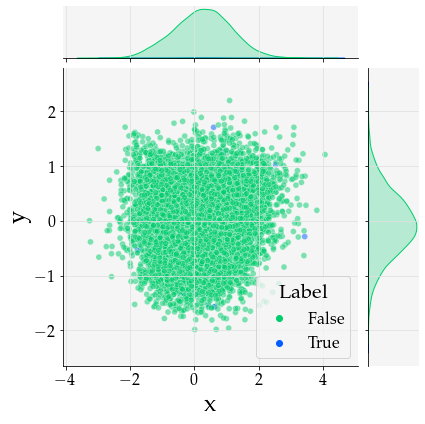

2021-07-30 16:55:12,748 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,749 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,749 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:12,750 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:12,750 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:12,751 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:12,751 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:12,751 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,752 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,752 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:12,787 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:12,788 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:12,789 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,789 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,790 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:12,791 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:12,793 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:12,794 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:12,794 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:12,794 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:12,836 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,836 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:12,836 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:55:12,837 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:12,840 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,840 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,841 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:12,841 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:12,841 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:12,842 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:12,889 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:12,890 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,890 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,892 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:12,893 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:12,894 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:12,895 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,895 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:12,896 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:12,896 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:12,932 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:12,933 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:12,933 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:12,933 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,934 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,934 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:12,934 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:55:12,937 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:12,942 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:12,943 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:12,984 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:12,984 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:12,985 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:12,985 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:12,985 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:12,986 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,986 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:12,987 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:12,987 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:12,988 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:13,523 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:13,523 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:13,524 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:13,524 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:13,524 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:13,525 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:13,525 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:13,525 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:13,525 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:13,526 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:13,568 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:55:13,568 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:13,569 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:13,570 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:13,571 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:13,571 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:13,571 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:13,572 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:13,572 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:13,572 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:13,620 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:13,621 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:13,621 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:13,622 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-07-30 16:55:13,622 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:13,624 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:13,625 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:13,625 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:13,626 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:13,626 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:13,677 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:13,677 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:13,677 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:13,677 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:13,678 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:13,678 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-07-30 16:55:13,679 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:13,682 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:13,684 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:13,684 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:13,721 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:13,722 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:13,722 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:13,722 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:13,723 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:13,723 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:13,724 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:13,725 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:55:13,725 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:13,727 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:55:13,763 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:13,764 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:13,764 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:13,764 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:13,765 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:13,765 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:13,766 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:13,766 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:13,766 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:13,767 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-07-30 16:55:13,812 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:13,812 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:13,813 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:13,813 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:13,813 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:13,814 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:13,814 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:13,815 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:13,815 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:13,816 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:13,816 - DEBUG - fam

2021-07-30 16:55:13,962 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:13,962 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-07-30 16:55:13,963 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:13,968 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:13,969 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:13,969 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:13,969 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:13,970 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:13,970 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:13,970 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:14,046 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:14,047 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:14,047 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:14,048 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:14,048 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:14,050 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:14,050 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:14,050 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:14,051 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,051 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,052 - DEBUG - fam

2021-07-30 16:55:14,090 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:14,090 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:55:14,092 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:14,093 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:14,093 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:14,094 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:14,094 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:14,094 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:14,095 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:14,095 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:14,134 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:14,135 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:14,135 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:14,136 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:14,136 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:14,137 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:14,137 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:14,137 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:14,138 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,138 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:14,189 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:14,189 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:14,189 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:14,189 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:14,190 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,190 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,190 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:14,191 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:14,191 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:14,191 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:14,243 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,243 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,243 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:14,243 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-07-30 16:55:14,244 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:14,246 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:14,246 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:14,247 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:14,247 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:14,247 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:14,295 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,295 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,295 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:14,296 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:14,297 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:14,297 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:14,301 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:14,301 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:14,303 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:14,303 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:14,338 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,338 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,339 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:14,339 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:55:14,340 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:14,342 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:14,342 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:14,343 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:14,343 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:14,344 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:14,376 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:14,377 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:14,377 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:14,377 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:14,378 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:14,378 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:14,378 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,378 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,379 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:14,379 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dv

2021-07-30 16:55:14,429 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:14,430 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:14,430 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:14,430 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:14,431 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:14,432 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:14,434 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,434 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,434 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:14,435 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:55:14,579 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:14,579 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:14,579 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:14,580 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,580 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,580 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:14,581 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-07-30 16:55:14,582 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:14,587 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:14,587 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:14,894 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:14,894 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:14,894 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:14,895 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,895 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,895 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:14,895 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:14,897 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:14,898 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:14,900 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:14,945 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:14,945 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:14,945 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:14,945 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:14,946 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:14,946 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,946 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:14,947 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:14,947 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:55:14,948 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:14,998 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:14,998 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:14,998 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:14,999 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:14,999 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:14,999 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,000 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,000 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:15,001 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:15,001 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:15,037 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:15,038 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-07-30 16:55:15,039 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:15,040 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:15,040 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:15,041 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:15,041 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:15,041 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:15,042 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:15,042 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:15,086 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:15,086 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:15,087 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:15,087 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:15,087 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:15,088 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:15,088 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,088 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,089 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:15,089 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dv

2021-07-30 16:55:15,623 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,624 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,624 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:15,624 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:15,625 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:15,625 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:15,625 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:15,626 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:15,626 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:15,626 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:15,669 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:15,670 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:15,670 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,671 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,671 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:15,672 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-07-30 16:55:15,672 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:15,674 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:15,674 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:15,674 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:15,764 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:15,765 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:15,765 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:15,766 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:15,766 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,766 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,767 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:15,767 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:15,768 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:15,769 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:55:15,815 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:15,815 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:15,815 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:15,816 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:15,816 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:15,817 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:15,817 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,818 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,818 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:15,818 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dv

2021-07-30 16:55:15,855 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:15,857 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:15,857 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:15,858 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:15,858 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:15,858 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:15,859 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:15,859 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:15,859 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,860 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,860 - DEBUG - fam

2021-07-30 16:55:15,909 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,909 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:15,909 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-07-30 16:55:15,911 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:15,914 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:15,914 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:15,914 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:15,915 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:15,915 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:15,915 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:15,955 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:15,955 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,956 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,956 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:15,956 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:15,957 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:15,959 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:15,959 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:15,960 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:15,960 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:15,993 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:15,993 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:15,994 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:15,994 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,994 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:15,995 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:15,995 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dvi
2021-07-30 16:55:15,999 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:16,001 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:16,001 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:16,042 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:16,042 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:16,043 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:16,043 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:16,043 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:16,044 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,046 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,046 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:16,046 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-07-30 16:55:16,047 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:16,104 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:16,104 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:16,105 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:16,105 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:16,105 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:16,106 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:16,106 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:16,106 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,107 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,107 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:16,168 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:16,168 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:16,168 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:16,168 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:16,169 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:16,171 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,171 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,172 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:16,172 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-07-30 16:55:16,173 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:16,211 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:16,211 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:16,211 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:16,212 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:16,213 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:16,213 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:16,214 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:16,214 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,215 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,216 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:16,267 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:16,267 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:16,268 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:16,268 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:16,269 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:16,269 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,269 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,269 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:16,270 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:55:16,271 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:16,805 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,805 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:16,806 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-07-30 16:55:16,807 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:16,807 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:16,808 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:16,808 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:16,808 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:16,808 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:16,809 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:16,837 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:16,837 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:16,837 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:16,838 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:16,838 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:16,838 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:16,838 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:16,839 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,839 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,839 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:16,868 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:16,869 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:16,869 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:16,869 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:16,870 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:16,870 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,870 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,870 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:16,871 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:16,871 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:16,906 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:16,907 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:16,907 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:16,908 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,908 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:16,908 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:16,909 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-07-30 16:55:16,910 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:16,918 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:16,918 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

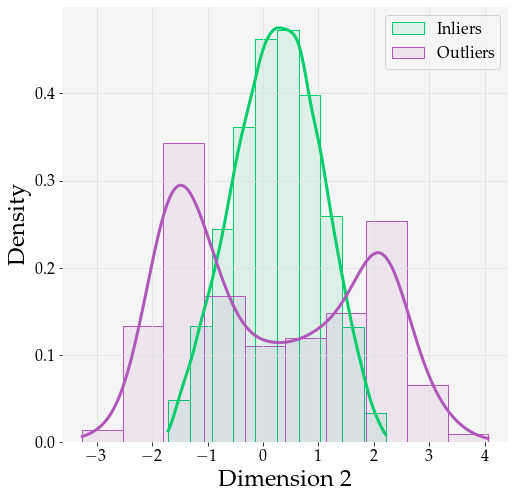

2021-07-30 16:55:17,066 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,067 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,067 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,068 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,068 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,071 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,075 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,075 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,076 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,076 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:17,111 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:17,112 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,112 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,113 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,113 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,113 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,113 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,114 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,114 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,114 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:17,153 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,153 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,153 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:55:17,154 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,155 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,155 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,156 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,156 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,156 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,157 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:17,186 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,186 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,187 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,187 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,187 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:17,188 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,189 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,190 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,190 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,190 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:17,226 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,227 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,227 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,227 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,227 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,228 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,228 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/806c1f5f415245c110fabc22d099acbc.dvi
2021-07-30 16:55:17,229 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,230 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,230 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:17,274 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,274 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,274 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,275 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,275 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,276 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,277 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,277 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,277 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:17,278 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:17,375 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,376 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,376 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,376 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,377 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,377 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,378 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,379 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,379 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,379 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:17,418 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,419 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-07-30 16:55:17,420 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,426 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,426 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,426 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,427 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,427 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,427 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,428 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:17,473 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,474 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,474 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,474 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:17,475 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,476 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,476 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,476 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,477 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,477 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:17,531 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,531 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,531 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,532 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,532 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,533 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-07-30 16:55:17,533 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,534 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,534 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,535 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:17,579 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,579 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,580 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,580 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,581 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,581 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,581 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,582 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:17,582 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,583 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:55:17,628 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,629 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,629 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,630 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,631 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,631 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,631 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,631 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,632 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,632 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dv

2021-07-30 16:55:17,675 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,676 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,676 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,677 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,677 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,677 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,678 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,678 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,680 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,680 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,681 - DEBUG - fam

2021-07-30 16:55:17,727 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,727 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-07-30 16:55:17,728 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,730 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,731 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,731 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,731 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,732 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,732 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,732 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:17,791 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,792 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,792 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,793 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,794 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,795 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,795 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,795 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,796 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,796 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,796 - DEBUG - fam

2021-07-30 16:55:17,832 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,834 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,838 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,838 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,839 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:17,839 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,840 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,841 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,842 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,842 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,842 - DEBUG - fam

2021-07-30 16:55:17,882 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,883 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,883 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,883 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,883 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:55:17,885 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,887 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,888 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,888 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,888 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:17,932 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,932 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,932 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,932 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,933 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:17,934 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,934 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,935 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:17,935 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:17,935 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:17,973 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:17,974 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:17,974 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:17,974 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,975 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:17,976 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:17,977 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dvi
2021-07-30 16:55:17,978 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:17,979 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:17,980 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:18,029 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,029 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,029 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:18,030 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:18,030 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:18,030 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,030 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,031 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:18,032 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:18,032 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:18,079 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,079 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,079 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:18,079 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-07-30 16:55:18,080 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:18,082 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:18,082 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,082 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,083 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,083 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:18,125 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,125 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,126 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,128 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:18,128 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:18,129 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:18,129 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,129 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,129 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:18,130 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d276a205ffefd47add8bda20557c7c92.dv

2021-07-30 16:55:18,168 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:18,171 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:18,171 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:18,172 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,172 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,172 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:18,173 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:18,173 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,174 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,175 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:18,218 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,218 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,219 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:18,219 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-07-30 16:55:18,220 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:18,223 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:18,223 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,223 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,224 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,225 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:18,325 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,325 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,326 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:18,328 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:18,329 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:18,331 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:18,332 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,332 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,332 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,333 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:18,370 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,371 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,375 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:18,376 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:55:18,376 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:18,378 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:18,378 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,379 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,379 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,379 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:18,408 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,409 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,409 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,409 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:18,409 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:18,410 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:18,410 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,410 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,410 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:18,411 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dv

2021-07-30 16:55:18,443 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,443 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,443 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,444 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:18,444 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:18,444 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:18,445 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,445 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,445 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:18,445 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:55:18,473 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:18,473 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:18,474 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,474 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,474 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,474 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:18,475 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:18,475 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:18,475 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,475 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,476 - DEBUG - fam

2021-07-30 16:55:18,503 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:18,504 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/806c1f5f415245c110fabc22d099acbc.dvi
2021-07-30 16:55:18,504 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:18,505 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:18,505 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,505 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,505 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,506 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:18,506 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:18,506 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:18,533 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,534 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,534 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,534 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:18,534 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:18,535 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:18,535 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,535 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,535 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:18,536 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dv

2021-07-30 16:55:18,565 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:18,565 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,565 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,566 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:18,566 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:18,566 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,566 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,567 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,567 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:18,567 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:18,596 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-07-30 16:55:18,597 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:18,598 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:18,598 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,599 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,599 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,599 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:18,599 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:18,600 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:18,600 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:18,633 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:18,633 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:18,634 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:18,634 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:18,634 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:18,634 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:18,635 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:18,635 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,635 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:18,635 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

In [20]:
def latent_vis_envelope_2d(latent_vecs, labels, dim_x: int = 2, dim_y: int = 4, save_name=None, stat='density', color='C1'):

    dim_x = 2
    dim_y = 4
    cov_2d = EllipticEnvelope(random_state=49).fit(latent_vecs[:, [dim_x, dim_y]])
    pred_2d = cov_2d.predict(latent_vecs[:, [dim_x, dim_y]])

    inliers_2d = ((pred_2d + 1) // 2).astype(bool)
    outliers_2d = ~inliers_2d
    
    # Setup some long form data
    dat = pd.DataFrame.from_dict({
        'Label': np.array(labels),
        'x': latent_vecs[:, dim_x],
        'y': latent_vecs[:, dim_y]
    })
    
    plt.figure(figsize=(10, 10))
    sns.jointplot(data=dat, x='x', y='y', hue='Label', kind='scatter', palette=[color, 'C5'], alpha=0.5)
    plt.savefig(f'JointPlotScatter-{sn}.pdf', format='pdf', bbox_inches='tight')
    plt.show()
    
    # Plot the 2d results
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(latent_vecs[inliers_2d, dim_x], latent_vecs[inliers_2d, dim_y], s=2**5, 
               label='Inliers', color=color, alpha=0.7)

    ax.scatter(latent_vecs[outliers_2d, dim_x], latent_vecs[outliers_2d, dim_y], s=2**5,
               label='Outliers', color='C0', alpha=0.7)
    # Novelies plotted here
    ax.scatter(latent_vecs[np.array(labels).astype(bool), dim_x], latent_vecs[np.array(labels).astype(bool), dim_y],
               s=2**5, label='Novelties', color='C5', alpha=1.0)  # This line is for seeing the distr. of novelties

    
    ax.axhline(0, 0, c='k', lw=0.5)
    ax.axvline(0, 0, c='k', lw=0.5)
    ax.set_xlabel(f'Dimension {dim_x}')
    ax.set_ylabel(f'Dimension {dim_y}')
    ax.legend()
    if save_name is not None and isinstance(save_name, str):
        plt.savefig(f'2dOutliers-{save_name}.pdf', format='pdf',  bbox_inches='tight')
    plt.show()

    # Plot x dimension
    fig, ax = plt.subplots(figsize=(8, 8))
    sns.histplot(data=latent_vecs[inliers_2d, dim_x], bins=10, alpha=0.1, stat=stat, 
                 kde=True, color=color, edgecolor=color, label='Inliers')
    sns.histplot(data=latent_vecs[outliers_2d, dim_x], bins=10, alpha=0.1, stat=stat,
                 kde=True, color='C3', edgecolor='C3', label='Outliers')
    
    ax.set_xlabel(f'Dimension {dim_x}')
    ax.legend()
    if save_name is not None and isinstance(save_name, str):
        plt.savefig(f'InlierOutlierDensityX-{save_name}.pdf', format='pdf',  bbox_inches='tight')
    plt.show()

    # Plot y dimension
    fig, ax = plt.subplots(figsize=(8, 8))
    sns.histplot(data=latent_vecs[inliers_2d, dim_y], bins=10, alpha=0.1, stat=stat,
                 kde=True, color=color, edgecolor=color, label='Inliers')
    sns.histplot(data=latent_vecs[outliers_2d, dim_y], bins=10, alpha=0.1, stat=stat, 
                 kde=True, color='C3', edgecolor='C3', label='Outliers')
    ax.set_xlabel(f'Dimension {dim_y}')
    ax.legend()
    if save_name is not None and isinstance(save_name, str):
        plt.savefig(f'InlierOutlierDensityY-{save_name}.pdf', format='pdf',  bbox_inches='tight')
    plt.show()
    
    # Here, the negative mahalanobis distance is used as the novelty score
    return -cov_2d.mahalanobis(latent_vecs[:, [dim_x, dim_y]])

# Use the negative Mahalanobis distance as the novelty score
latent_scores_catalog = {}

for sn, res in lt_results.items():
    lt_vecs = np.stack(res['latent_vecs'], axis=0)
    labels = res['labels']
    color = 'C1' if 'AAE' in sn else 'C6'
    scores_2d = latent_vis_envelope_2d(lt_vecs, labels, save_name=sn, color=color)
#     latent_scores_catalog[f'{sn}-2d'] = scores_2d

2021-07-30 16:55:32,984 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:32,985 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:32,985 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:32,986 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:32,986 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:32,987 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:32,987 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:32,988 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:32,988 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:32,989 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:33,034 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:33,035 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,036 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,036 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,036 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,037 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,037 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,037 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,038 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,038 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:33,094 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,094 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,094 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:55:33,096 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,098 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,098 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,098 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,099 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,100 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,100 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:33,153 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,153 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,153 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,154 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,154 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:33,155 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,156 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,158 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,159 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,159 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:33,217 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,218 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,218 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,218 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,218 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,219 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,220 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8c2984e455853b50e949b834fad640c0.dvi
2021-07-30 16:55:33,221 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,278 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,279 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:33,314 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,314 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,315 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,315 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,315 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,315 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,316 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,316 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,316 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:33,317 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:33,354 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:55:33,355 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,357 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,357 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,358 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,358 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,358 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,359 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,359 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,360 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:33,395 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,395 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,395 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,395 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:55:33,396 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,397 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,397 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,397 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,397 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,398 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:33,433 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,434 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,434 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,434 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,435 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,435 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:33,436 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,437 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,437 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,438 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:33,478 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,479 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,479 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,480 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,481 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,482 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,482 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,483 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:55:33,483 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,484 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:55:33,525 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,527 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,528 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,528 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,529 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,529 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,529 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,529 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,530 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,530 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,530 - DEBUG - fam

2021-07-30 16:55:33,584 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,584 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:55:33,585 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,587 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,589 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,590 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,590 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,590 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,591 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,591 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:33,659 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,660 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,660 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,660 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,661 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,661 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,663 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,663 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,663 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,664 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:33,701 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:33,702 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,702 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,703 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,703 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,704 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,707 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,708 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,708 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,710 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:33,752 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,753 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,753 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,753 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,754 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,754 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,755 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,755 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,756 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,756 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:33,795 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,795 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,796 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,796 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,797 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,797 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,797 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/33ab8e5ded6bbd8f0cfd36a9a865efd3.dvi
2021-07-30 16:55:33,798 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,799 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,800 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:33,836 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,836 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,838 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,838 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,839 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,839 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,840 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:33,841 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,841 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,842 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:33,881 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,882 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,882 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,882 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,883 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,883 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,884 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:55:33,885 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:33,886 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,890 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:33,924 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,925 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:33,925 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,925 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,926 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,926 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,926 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,927 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,927 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,927 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:33,972 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:33,972 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:33,972 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:33,973 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:33,973 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:33,974 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:33,974 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,975 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:33,975 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:33,975 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:55:34,016 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,017 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:34,017 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:55:34,018 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:34,021 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:34,023 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:34,025 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:34,026 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:34,026 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,026 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:34,073 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:34,073 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:34,073 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:34,073 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:34,074 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,074 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:34,074 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:34,075 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,075 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,075 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:34,117 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,117 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:34,117 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:34,118 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,118 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,118 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:34,119 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:55:34,121 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:34,122 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:34,123 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:34,252 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,253 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:34,254 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:34,255 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,255 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,255 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:34,256 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:55:34,257 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:34,258 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:34,258 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:34,297 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:34,298 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:34,298 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,298 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:34,299 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:34,299 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,300 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,300 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:34,300 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:34,300 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:34,332 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:34,332 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:55:34,333 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:34,334 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:34,335 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:34,335 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:34,335 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:34,336 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,336 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:34,336 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:34,377 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:34,378 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:34,378 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:34,378 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:34,379 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:34,379 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,380 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:34,380 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:34,381 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,382 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,383 - DEBUG - fam

2021-07-30 16:55:34,416 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:34,416 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-07-30 16:55:34,417 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:34,419 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:34,419 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:34,419 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:34,419 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:34,420 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,420 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:34,422 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:34,460 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:34,460 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:34,460 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:34,461 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,461 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:34,461 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:34,462 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,462 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,462 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:34,463 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dv

2021-07-30 16:55:34,506 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,510 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:34,510 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:34,511 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,511 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,512 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:34,512 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:34,512 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:34,513 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:34,513 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:34,551 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:34,553 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:34,554 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:34,554 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:34,555 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:34,555 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,556 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:34,556 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:34,557 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,558 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,559 - DEBUG - fam

2021-07-30 16:55:34,593 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,593 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:34,593 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:34,594 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,594 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,595 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:34,596 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/4d1c8120671f2664512ec665080d8a0c.dvi
2021-07-30 16:55:34,596 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:34,605 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:34,606 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:34,640 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:34,640 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:34,640 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:34,641 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:34,641 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:34,641 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:34,643 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:34,643 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:34,643 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:34,644 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

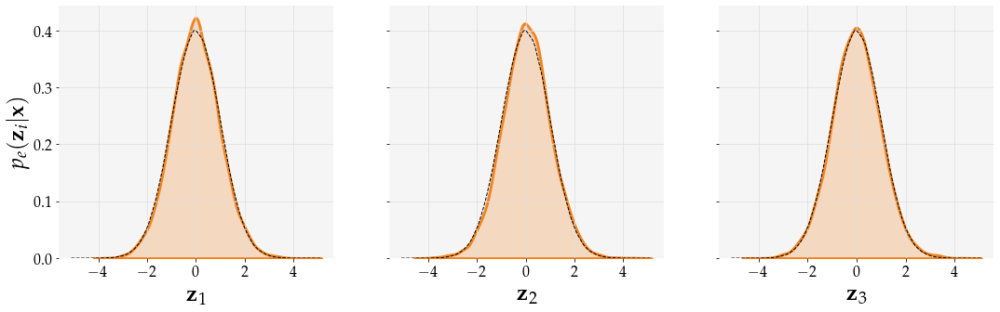

2021-07-30 16:55:49,779 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:49,780 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:49,780 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:49,780 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:49,781 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:49,781 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:49,781 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:49,782 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:49,782 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:49,782 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:49,811 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:49,812 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:49,812 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:49,812 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:49,813 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:49,813 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:49,813 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:49,814 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:49,814 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:49,814 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:49,852 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:49,852 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:49,853 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:55:49,853 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:49,855 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:49,855 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:49,856 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:49,856 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:49,856 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:49,857 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:49,889 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:49,889 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:49,890 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:49,890 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:49,890 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:49,891 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:49,892 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:49,892 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:49,892 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:49,893 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:55:49,945 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:49,945 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:49,945 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:49,946 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:49,946 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:49,947 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:49,948 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8c2984e455853b50e949b834fad640c0.dvi
2021-07-30 16:55:49,949 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,008 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,008 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:50,044 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,045 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,045 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,045 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,045 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,046 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,046 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,046 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,047 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:50,048 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:55:50,086 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:55:50,087 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,089 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,089 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:50,089 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,090 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,090 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,090 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,091 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,091 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:50,127 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,128 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,129 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,129 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:55:50,129 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,130 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,131 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:50,131 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,131 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,132 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:55:50,163 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,163 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,164 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,164 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,164 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,164 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:50,166 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,166 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,167 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:50,167 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:55:50,205 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,206 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,206 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,206 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,206 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,207 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,207 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,207 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:55:50,208 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,209 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:55:50,251 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,254 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,254 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:50,255 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,255 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,255 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,256 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,256 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,256 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,257 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,257 - DEBUG - fam

2021-07-30 16:55:50,317 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,317 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:55:50,318 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,319 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,320 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:50,320 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,321 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,321 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,321 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,322 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:50,391 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,391 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:50,391 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,392 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,392 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,393 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,393 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,393 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,393 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,394 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:50,433 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:50,434 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,435 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,435 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:50,436 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,436 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,436 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,437 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,438 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,438 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:55:50,478 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,479 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:50,479 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,479 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,480 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,480 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,480 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,480 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,481 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,481 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:50,513 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,514 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,514 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,514 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,515 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,516 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,517 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/33ab8e5ded6bbd8f0cfd36a9a865efd3.dvi
2021-07-30 16:55:50,517 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,518 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,519 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:50,552 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,553 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,553 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,553 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,553 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,554 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,554 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:55:50,555 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,556 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,556 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:50,584 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,584 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,584 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,585 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,585 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,585 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,585 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:55:50,587 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,588 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,588 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:50,626 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,626 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,626 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:50,626 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,627 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,627 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,627 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,627 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,628 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,628 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:50,671 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:50,671 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,671 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,671 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,672 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,672 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,672 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,673 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,674 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,675 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:55:50,713 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,713 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,713 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:55:50,715 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,720 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,720 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:50,720 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,721 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,721 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,721 - DEBUG - Textile font is not compatible with

2021-07-30 16:55:50,776 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,776 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:50,777 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,777 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,778 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,778 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,778 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,779 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,779 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,779 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:50,821 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,821 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,822 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,822 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,822 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,823 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,823 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:55:50,824 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,825 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,825 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:50,949 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,949 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,951 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,951 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,952 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,952 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,952 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:55:50,953 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:50,954 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,955 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:50,995 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:50,995 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:50,996 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:50,996 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:50,996 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:50,997 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,997 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:50,997 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:50,997 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:50,998 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:55:51,034 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:51,035 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:55:51,037 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:51,038 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:51,039 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:51,039 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:51,039 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:51,040 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:51,040 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:51,040 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:51,079 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:51,080 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:51,080 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:51,081 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:51,081 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:51,081 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:51,081 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:51,081 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:51,082 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:51,082 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:51,082 - DEBUG - fam

2021-07-30 16:55:51,126 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:51,127 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-07-30 16:55:51,127 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:51,128 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:51,128 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:51,129 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:51,129 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:51,129 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:51,130 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:51,130 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:55:51,171 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:51,171 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:51,172 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:51,172 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:51,173 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:51,173 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:51,173 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:51,173 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:51,174 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:51,174 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dv

2021-07-30 16:55:51,213 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:51,213 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:51,213 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:51,214 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:51,214 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:51,215 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:51,215 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:51,218 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:51,218 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:51,218 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:55:51,258 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:51,260 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:51,260 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:51,261 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:51,262 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:51,262 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:51,262 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:51,262 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:51,263 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:51,263 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:51,263 - DEBUG - fam

2021-07-30 16:55:51,309 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:51,309 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:51,309 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:51,310 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:51,311 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:55:51,311 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:51,312 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/4d1c8120671f2664512ec665080d8a0c.dvi
2021-07-30 16:55:51,312 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:55:51,321 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:51,321 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:55:51,358 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:55:51,358 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:55:51,358 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:55:51,360 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:55:51,360 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:55:51,360 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:55:51,361 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:55:51,361 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:55:51,361 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:55:51,362 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

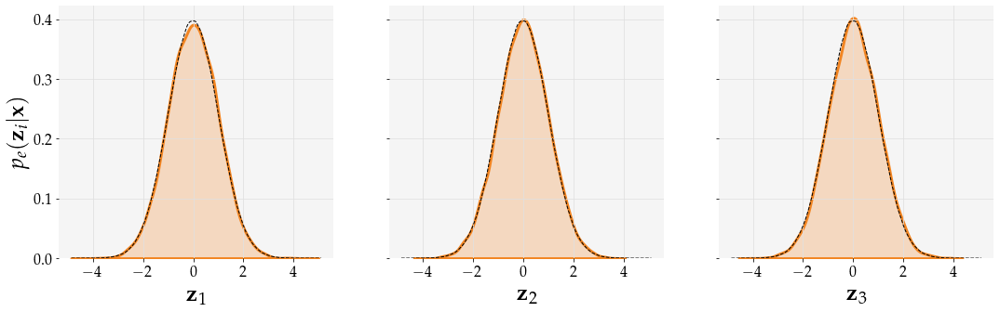

2021-07-30 16:56:04,208 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,209 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:04,209 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,209 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:04,210 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,210 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:04,210 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:04,211 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,211 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,211 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:04,245 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:04,250 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:04,251 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,252 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:04,252 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,252 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:04,253 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,253 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:04,253 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:04,254 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:04,294 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,294 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:04,295 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:56:04,299 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:04,301 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,301 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:04,301 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,302 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:04,302 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,302 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:04,340 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:04,340 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,340 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,341 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:04,341 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:04,342 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:04,343 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,343 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:04,344 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,344 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:04,396 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,396 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:04,397 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:04,397 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,397 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,397 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:04,402 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/4d1c8120671f2664512ec665080d8a0c.dvi
2021-07-30 16:56:04,403 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:04,413 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,416 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:04,509 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,509 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:04,509 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,510 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:04,511 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:04,511 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,512 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,512 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:04,513 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:04,513 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:04,547 - DEBUG - Assigning font /b'F1' = b'cmsy10' (dvi)
2021-07-30 16:56:04,547 - DEBUG - Assigning font /b'F2' = b'pplr8r' (dvi)
2021-07-30 16:56:04,549 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,549 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:04,549 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,550 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:04,550 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,551 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:04,551 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:04,552 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,552 - DEBUG - Bitstream Vera Sans Mono font is not compatible wit

2021-07-30 16:56:04,592 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:04,592 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/33ab8e5ded6bbd8f0cfd36a9a865efd3.dvi
2021-07-30 16:56:04,593 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:04,593 - DEBUG - Assigning font /b'F3' = b'pplb8r' (dvi)
2021-07-30 16:56:04,596 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,597 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:04,597 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,598 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:04,598 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,598 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 1

2021-07-30 16:56:04,632 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:04,633 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,633 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,634 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:04,634 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:04,635 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:04,635 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,636 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:04,636 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,636 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:04,669 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,670 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:04,670 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:04,670 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,670 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,671 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:04,671 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e5e322fdddbe6793c3847197ff838d63.dvi
2021-07-30 16:56:04,672 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:04,674 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,674 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:04,719 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,720 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:04,720 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,720 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:04,720 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:04,721 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,721 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,722 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:04,722 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9074668f87fe25d62ab5e75daacca313.dvi
2021-07-30 16:56:04,723 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:04,774 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:56:04,775 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:04,775 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,776 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:04,776 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,777 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:04,778 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,778 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:04,779 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:04,785 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:04,837 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,837 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:04,838 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:56:04,839 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:04,841 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,842 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:04,842 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,843 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:04,843 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,843 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:04,908 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:56:04,909 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:04,910 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,910 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:04,911 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,911 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:04,911 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,912 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:04,914 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:04,915 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:04,953 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:04,953 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:04,954 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:04,955 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:04,955 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,956 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:04,956 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,956 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:04,957 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:04,957 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:04,995 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:04,995 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:04,996 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:04,996 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:04,996 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,002 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,003 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,003 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,004 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,004 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:05,054 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,055 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,056 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,056 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,056 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,057 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,057 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/33ab8e5ded6bbd8f0cfd36a9a865efd3.dvi
2021-07-30 16:56:05,058 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:05,060 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,060 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:05,098 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,099 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,099 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,100 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,100 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,101 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,101 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,101 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,102 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:05,102 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:05,141 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,141 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,141 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,142 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,142 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,142 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,143 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,143 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,143 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:56:05,145 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:05,187 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,188 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,188 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,188 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,189 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:05,190 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,190 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,190 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,191 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,191 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:56:05,228 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:05,236 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,236 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:05,237 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,237 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,237 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,238 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,238 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,238 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,238 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,239 - DEBUG - fam

2021-07-30 16:56:05,283 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,283 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,283 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,284 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,284 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:56:05,285 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:05,286 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,286 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:05,287 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,287 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:05,334 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,334 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,335 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,335 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:05,335 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,335 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,337 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,338 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,338 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,339 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:05,377 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,377 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,378 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,378 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,378 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,381 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,382 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,382 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,383 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,383 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:05,520 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,520 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,520 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,521 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,522 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,522 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,523 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-07-30 16:56:05,524 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:05,525 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,525 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:05,566 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,567 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,568 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,568 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,568 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,569 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,569 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,569 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,570 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:05,570 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:05,609 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,609 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,609 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,610 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:56:05,611 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:05,612 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,613 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:05,613 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,614 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,618 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:05,653 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,653 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,654 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:05,654 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,654 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,655 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,655 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,655 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,655 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,656 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:05,698 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,700 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-07-30 16:56:05,701 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:05,702 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,703 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:05,703 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,703 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,703 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,704 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,705 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:05,740 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,740 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,740 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,741 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,741 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:05,741 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,742 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,742 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,742 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,743 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:56:05,783 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:05,783 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,784 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,784 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,785 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,785 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,785 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,786 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,787 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,787 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:56:05,822 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,824 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,824 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,824 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,825 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9074668f87fe25d62ab5e75daacca313.dvi
2021-07-30 16:56:05,825 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:05,830 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,831 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:05,831 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,831 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:05,870 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,870 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:05,871 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,871 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,871 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,872 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,872 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,872 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,872 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,873 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:05,934 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,934 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,935 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,935 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,936 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:05,936 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,936 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:05,937 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,937 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,938 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:05,975 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:05,975 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:56:05,976 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:05,977 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:05,978 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:05,979 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:05,979 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:05,980 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:05,980 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:05,980 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

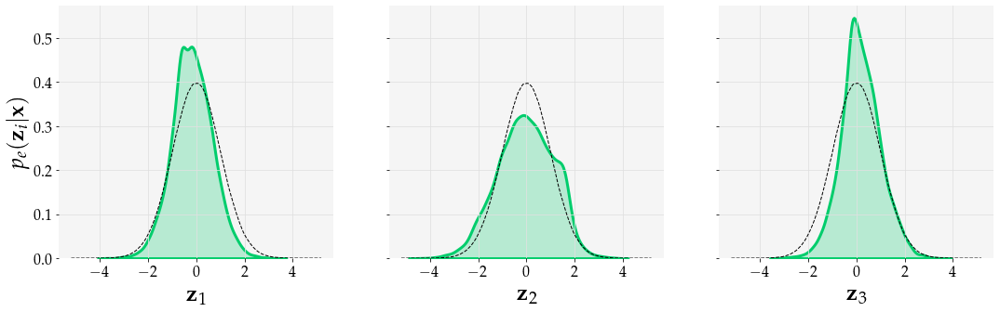

2021-07-30 16:56:20,493 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:20,494 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:20,494 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:20,494 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:20,495 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:20,495 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:20,495 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:20,495 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,496 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,496 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:20,535 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:20,537 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:20,537 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:20,538 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:20,538 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:20,538 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:20,539 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:20,539 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:20,540 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:20,540 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:20,586 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,586 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:20,586 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:56:20,587 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:20,588 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:20,588 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:20,589 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:20,589 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:20,589 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:20,589 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:20,625 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:20,626 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,626 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,627 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:20,627 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:20,628 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:20,628 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:20,629 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:20,629 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:20,629 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:20,681 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:20,681 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:20,681 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:20,682 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,682 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,682 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:20,683 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8c2984e455853b50e949b834fad640c0.dvi
2021-07-30 16:56:20,683 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:20,742 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:20,742 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:20,779 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:20,779 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:20,780 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:20,780 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:20,781 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:20,781 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,782 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,782 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:20,783 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:20,783 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:20,825 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:56:20,826 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:20,828 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:20,828 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:20,828 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:20,829 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:20,829 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:20,830 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:20,830 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:20,831 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:20,865 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,865 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,865 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:20,865 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:56:20,866 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:20,867 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:20,868 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:20,868 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:20,868 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:20,869 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:20,901 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:20,902 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:20,902 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,902 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,903 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:20,903 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:20,904 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:20,905 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:20,905 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:20,905 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:56:20,941 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:20,941 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:20,941 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:20,942 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:20,942 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,942 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,942 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:20,943 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:56:20,944 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:20,945 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:56:20,993 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:20,996 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:20,996 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:20,997 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:20,997 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:20,997 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:20,998 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:20,998 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:20,999 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,999 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:20,999 - DEBUG - fam

2021-07-30 16:56:21,044 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,045 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-07-30 16:56:21,045 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:21,047 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,047 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,048 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,048 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,048 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,048 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,049 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:21,121 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,121 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,122 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,122 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,122 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,122 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,123 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,123 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,123 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,123 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:21,162 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:21,162 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:21,163 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,164 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,164 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,164 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,164 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,165 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,165 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,167 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:21,199 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,200 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,200 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,201 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,201 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,202 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,202 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,203 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,203 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,203 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:21,240 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,241 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,242 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,242 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,242 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,242 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,243 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/33ab8e5ded6bbd8f0cfd36a9a865efd3.dvi
2021-07-30 16:56:21,243 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:21,244 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,245 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:21,281 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,282 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,282 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,282 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,284 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,285 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,285 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:21,286 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:21,287 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,287 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:21,324 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,325 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,325 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,326 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,327 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,327 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,329 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:56:21,330 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:21,332 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,332 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:21,363 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,363 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,364 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,364 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,365 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,365 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,368 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,369 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,370 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,370 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:21,415 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,423 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,423 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,424 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,424 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,424 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,424 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,425 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,425 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,425 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:56:21,462 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,462 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,463 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:56:21,464 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:21,468 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,469 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,469 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,469 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,470 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,471 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:21,512 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,513 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,513 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,513 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,513 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,514 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,514 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,514 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,515 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,516 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:21,554 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,554 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,555 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,555 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,555 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,556 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,557 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:56:21,558 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:21,559 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,559 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:21,687 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,687 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,687 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,688 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,688 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,688 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,689 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-07-30 16:56:21,689 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:21,690 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,691 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:21,730 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,731 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,731 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,731 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,732 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,735 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,735 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,736 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,736 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,736 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:21,774 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,775 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-07-30 16:56:21,775 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:21,777 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,778 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,778 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,778 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,779 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,780 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,780 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:21,827 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:21,827 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,828 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,828 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,828 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,829 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,829 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,829 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,829 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,830 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,830 - DEBUG - fam

2021-07-30 16:56:21,870 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,870 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-07-30 16:56:21,871 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:21,872 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,873 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,873 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,874 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,874 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,874 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,875 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:21,915 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,915 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,915 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:21,915 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,916 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,916 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,916 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,921 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,922 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,922 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dv

2021-07-30 16:56:21,960 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:21,960 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:21,961 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:21,961 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,962 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:21,962 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:21,962 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:21,962 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:21,963 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:21,963 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:21,998 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:22,000 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:22,000 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:22,001 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:22,001 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:22,001 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:22,001 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:22,002 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:22,002 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:22,003 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:22,003 - DEBUG - fam

2021-07-30 16:56:22,038 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:22,039 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:22,039 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:22,039 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:22,040 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:22,040 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:22,040 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/4d1c8120671f2664512ec665080d8a0c.dvi
2021-07-30 16:56:22,041 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:22,050 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:22,051 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:22,088 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:22,088 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:22,088 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:22,089 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:22,089 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:22,089 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:22,090 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:22,091 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:22,093 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:22,093 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

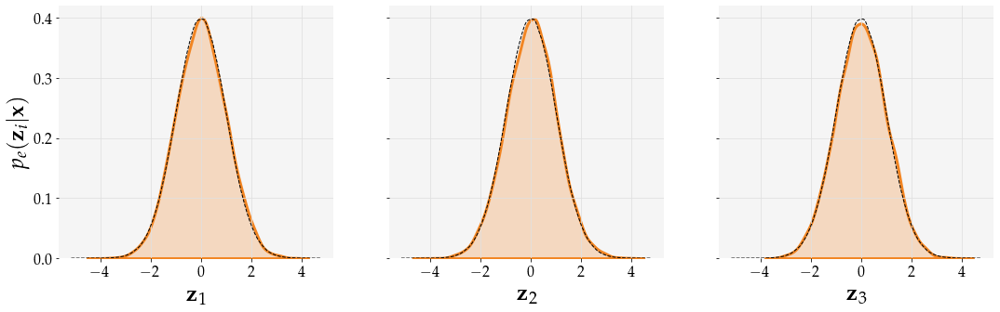

2021-07-30 16:56:36,482 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:36,482 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:36,483 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:36,483 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:36,483 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:36,484 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:36,484 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:36,485 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,485 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,486 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:36,526 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:36,527 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:36,527 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:36,528 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:36,528 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:36,528 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:36,529 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:36,529 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:36,529 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:36,530 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:36,580 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,580 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:36,580 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:56:36,581 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:36,582 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:36,582 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:36,583 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:36,583 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:36,583 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:36,583 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:36,626 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:36,626 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,626 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,627 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:36,627 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:36,629 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:36,630 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:36,631 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:36,631 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:36,631 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:36,665 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:36,665 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:36,666 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:36,666 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,666 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,666 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:36,667 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/806c1f5f415245c110fabc22d099acbc.dvi
2021-07-30 16:56:36,668 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:36,674 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:36,674 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:36,714 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:36,716 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:36,716 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:36,717 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:36,717 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:36,717 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,717 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,720 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:36,720 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:36,721 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:36,758 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:36,758 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:36,759 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:36,759 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:36,759 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:36,760 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:36,760 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:36,761 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,761 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,763 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:36,891 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/f0aec9ae15bfd4aa46180becb376f329.dvi
2021-07-30 16:56:36,891 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:36,892 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:36,893 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:36,893 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:36,894 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:36,894 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:36,894 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:36,895 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:36,895 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:36,932 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,933 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:36,933 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:36,933 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:36,934 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:36,934 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:36,935 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:36,935 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:36,935 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:36,937 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:36,985 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:36,985 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:36,987 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:36,988 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,988 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:36,988 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:36,988 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:56:36,989 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:36,990 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:36,990 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:37,024 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,025 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,025 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,025 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,025 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,026 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,026 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,026 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,027 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,027 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:56:37,064 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:37,065 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,065 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,066 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,066 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,066 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,066 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,067 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,067 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,067 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,067 - DEBUG - fam

2021-07-30 16:56:37,109 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,109 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e5e322fdddbe6793c3847197ff838d63.dvi
2021-07-30 16:56:37,110 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:37,112 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,112 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,112 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,113 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,113 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,113 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,114 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:37,174 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,174 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,175 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,175 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:56:37,176 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:37,176 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,177 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,177 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,177 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,178 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:37,219 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,219 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,220 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,220 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,225 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,227 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,227 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,228 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:37,229 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:37,229 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:56:37,270 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,271 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,271 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,272 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,272 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,273 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,273 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,273 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,274 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,275 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dv

2021-07-30 16:56:37,318 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:37,330 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,331 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,332 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,334 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,334 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,334 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,335 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,335 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,336 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,336 - DEBUG - fam

2021-07-30 16:56:37,380 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,380 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:56:37,380 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:37,382 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,383 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,383 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,384 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,384 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,384 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,385 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:37,456 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:37,456 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,456 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,457 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,458 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,458 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,458 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,459 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,459 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,459 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,460 - DEBUG - fam

2021-07-30 16:56:37,497 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,497 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6ca9ec77f0adfa643d38aef07125fc47.dvi
2021-07-30 16:56:37,498 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:37,499 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,500 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,500 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,500 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,500 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,501 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,501 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:37,539 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,540 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,540 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,540 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,541 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,541 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,542 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,542 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,542 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,542 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dv

2021-07-30 16:56:37,585 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,585 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,585 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,585 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,586 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,586 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,586 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,587 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,587 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,587 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:37,629 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,631 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,631 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,632 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,633 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,633 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,634 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-07-30 16:56:37,634 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:37,635 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,636 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:37,667 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,668 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,670 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,670 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,671 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,671 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,671 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,671 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,673 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:37,673 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:37,714 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,715 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,715 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,715 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,716 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,716 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,716 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e5e322fdddbe6793c3847197ff838d63.dvi
2021-07-30 16:56:37,718 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:37,719 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,720 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:37,759 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,760 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,760 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,760 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,760 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,761 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,761 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,761 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,762 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,762 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:37,806 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,806 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,806 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,807 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,807 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,808 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,808 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,808 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,808 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,809 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:56:37,856 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,857 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,857 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,857 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,858 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,858 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,858 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,862 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,864 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,865 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-07-30 16:56:37,900 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,900 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,900 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,900 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,901 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:37,901 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:37,901 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,901 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,902 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,902 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:56:37,941 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,943 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,943 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-07-30 16:56:37,944 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:37,946 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,947 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:37,947 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:37,947 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:37,948 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:37,948 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:37,999 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:37,999 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:37,999 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:37,999 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:38,000 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:38,000 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:38,001 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:38,002 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:38,003 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:38,003 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:38,042 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:38,043 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:38,043 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:38,044 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:38,044 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:38,044 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,045 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,046 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:38,046 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:38,046 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:38,093 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:38,093 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:38,094 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:38,094 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,094 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,095 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:38,095 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:38,096 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:38,096 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:38,097 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:38,239 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:38,239 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:38,239 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:38,240 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,240 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,240 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:38,241 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:56:38,242 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:38,243 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:38,243 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:38,279 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:38,279 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:38,279 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:38,280 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,280 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,280 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:38,281 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:38,281 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:38,281 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:38,281 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:38,310 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:38,314 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:38,314 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:38,315 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:38,315 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:38,315 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:38,316 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:38,316 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:38,317 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,317 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,317 - DEBUG - fam

2021-07-30 16:56:38,352 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:38,354 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:38,354 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:38,354 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:38,355 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:38,355 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:38,355 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:38,356 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:38,356 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,357 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,357 - DEBUG - fam

In [21]:
latent_scores_catalog = {}

def latent_vis_envelope_nd(latent_vecs, dim_x: int = 2, dim_y: int = 4, save_name=None, color='C1'):

    cov = EllipticEnvelope(random_state=49).fit(latent_vecs)

    pred = cov.predict(latent_vecs)
    standard_normal = np.random.normal(0., 1., 1000000)

    inliers = ((pred + 1) // 2).astype(bool)
    outliers = ~inliers

    fig, ax = plt.subplots(1, 3, sharey=True, figsize=(18,5))
    sns.kdeplot(ax=ax[0], data=standard_normal, color='k', lw=1, ls='--')
    sns.kdeplot(ax=ax[0], data=latent_vecs[:, 3], fill=True, lw=3, color=color)
    ax[0].set_ylabel('$p_{e}(\\mathbf{z}_i|\\mathbf{x})$')
    ax[0].set_xlabel('$\\mathbf{z}_1$')
    
    sns.kdeplot(ax=ax[1], data=standard_normal, color='k', lw=1, ls='--')
    sns.kdeplot(ax=ax[1], data=latent_vecs[:, 4], fill=True, lw=3, color=color)
    ax[1].set_xlabel('$\\mathbf{z}_2$')
    
    sns.kdeplot(ax=ax[2], data=standard_normal, color='k', lw=1, ls='--')
    sns.kdeplot(ax=ax[2], data=latent_vecs[:, 5], fill=True, lw=3, color=color)
    ax[2].set_xlabel('$\\mathbf{z}_3$')
    
    plt.savefig(f'LatentProfiles-{sn}.pdf', bbox_inches='tight')
    plt.show()
    
    # Here, the negative mahalanobis distance is used as the novelty score
#     return -cov.mahalanobis(latent_vecs)
    return cov.score_samples(latent_vecs)
    
for sn, res in lt_results.items():
    lt_vecs = np.stack(res['latent_vecs'], axis=0)
    color = 'C1' if 'AAE' in sn else 'C6'
    scores_nd = latent_vis_envelope_nd(lt_vecs, save_name=sn, color=color)
    latent_scores_catalog[f'{sn}-nd'] = scores_nd

In [22]:
fig, ax = plt.subplots(figsize=(8, 8))

for sn in lt_results:
    
    if 'VAE-nre1' in sn:
        continue
    
    for suf in ['nd']:
        scores = latent_scores_catalog[f'{sn}-{suf}']
        fpr, tpr, thresholds, auc = metrics.roc(scores, lt_results[sn]['labels'])

        ax.plot(fpr, tpr, label=f'{sn.replace("nre", "ss") if ("nre" in sn) else sn}: {auc:.2f}')
    

ax.plot([0., 1.], [0., 1.], 'k:', lw=2, label='Random: 0.5')
ax.legend(title='AUC')#, bbox_to_anchor=(1.05, 1.), loc='upper left')

ax.axhline(0, 0, c='k', lw=1)
ax.axvline(0, 0, c='k', lw=1)

ax.set_xlabel('FPR')
ax.set_ylabel('TPR')

plt.savefig('ROC-latentspace_LunarAnalogueRP.pdf', format='pdf', bbox_inches='tight')
plt.show()

2021-07-30 16:56:38,819 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:38,819 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:38,819 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:38,820 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:38,820 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:38,820 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:38,821 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:38,821 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,821 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,822 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:38,848 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:38,849 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:38,849 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:38,850 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:38,850 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:38,850 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:38,850 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:38,852 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:38,852 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:38,852 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:38,883 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,883 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:38,883 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/5a1b54d1674e03d50d5b4e7398b6dfbf.dvi
2021-07-30 16:56:38,884 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:38,891 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:38,892 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:38,892 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:38,892 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:38,893 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:38,893 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:38,920 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:38,920 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,920 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,920 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:38,921 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:38,921 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:38,922 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:38,922 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:38,923 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:38,923 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:38,952 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:38,953 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:38,953 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:38,953 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,953 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,954 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:38,954 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/fda417fe2a5232217a193014adcbfbe5.dvi
2021-07-30 16:56:38,954 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:38,957 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:38,958 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:38,988 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:38,988 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:38,989 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:38,998 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,998 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:38,999 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:39,000 - DEBUG - latex -interaction=nonstopmode --halt-on-error /home/brahste/.cache/matplotlib/tex.cache/03e31c4a5ba68482c9b14dcf8840c020.tex
2021-07-30 16:56:39,089 - DEBUG - b"This is pdfTeX, Version 3.14159265-2.6-1.40.18 (TeX Live 2017/Debian) (preloaded format=latex)\n restricted \\write18 enabled.\nentering extended mode\n\n(/home/brahste/.cache/matplotlib/tex.cache/03e31c4a5ba68482c9b14dc

2021-07-30 16:56:39,214 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/4ace0aeabf6bb9772d2e53fc85b93443.dvi
2021-07-30 16:56:39,214 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:39,217 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,218 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:39,220 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:39,221 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:39,221 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:39,221 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:39,222 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:39,222 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:39,342 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:39,393 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,394 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:39,394 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:39,395 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:39,395 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:39,395 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:39,396 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:39,396 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,396 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,397 - DEBUG - fam

2021-07-30 16:56:39,432 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:39,432 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:39,433 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:39,434 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,434 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:39,434 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:39,435 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:39,435 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:39,435 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:39,436 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:39,477 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:39,477 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,477 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,477 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:39,478 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-07-30 16:56:39,479 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:39,481 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,482 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:39,482 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:39,482 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:39,526 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:39,527 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:39,527 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:39,527 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,528 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,528 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:39,529 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/5a1b54d1674e03d50d5b4e7398b6dfbf.dvi
2021-07-30 16:56:39,529 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:39,531 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,532 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:39,571 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:39,571 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:39,572 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:39,572 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:39,572 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:39,573 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,577 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,577 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:39,577 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:39,578 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:39,620 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,620 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:39,620 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:39,621 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:39,621 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:39,624 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:39,626 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:39,626 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,627 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,628 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:39,666 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/fda417fe2a5232217a193014adcbfbe5.dvi
2021-07-30 16:56:39,668 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:39,669 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,670 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:39,670 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:39,670 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:39,670 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:39,674 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:39,675 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:39,675 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:39,717 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,717 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:39,717 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/03e31c4a5ba68482c9b14dcf8840c020.dvi
2021-07-30 16:56:39,718 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:39,720 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,721 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:39,721 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:39,722 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:39,724 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:39,724 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:39,777 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:39,778 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,778 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,779 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:39,779 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/07288c87ec5d40636248bdb9fac00e9b.dvi
2021-07-30 16:56:39,780 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:39,784 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,784 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:39,784 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:39,785 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:39,837 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:39,838 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,838 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:39,838 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:39,840 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:39,840 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:39,841 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:39,841 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:39,842 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,842 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,843 - DEBUG - fam

2021-07-30 16:56:39,883 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:39,883 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d276a205ffefd47add8bda20557c7c92.dvi
2021-07-30 16:56:39,884 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:39,885 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,885 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:39,886 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:39,886 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:39,887 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:39,887 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:39,888 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:39,929 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:39,930 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,930 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:39,931 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:39,931 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:39,931 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:39,931 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:39,932 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:39,932 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,932 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:39,970 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:39,970 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:39,971 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:39,971 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:39,971 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,971 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:39,972 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:39,972 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:39,972 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:39,973 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:40,019 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,019 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,019 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,020 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,020 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:40,020 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:56:40,021 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:40,024 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,025 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,025 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:56:40,060 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,060 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,061 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,061 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,061 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,062 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,063 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:40,064 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:40,065 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:40,065 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:56:40,107 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,108 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,109 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,109 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,110 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:40,110 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-07-30 16:56:40,111 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:40,112 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,112 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,112 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:56:40,148 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,149 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,149 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:40,150 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,150 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,151 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,151 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,152 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,152 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,152 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:40,200 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,201 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,201 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:40,202 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,202 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,202 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,203 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,203 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,204 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,204 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:40,250 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:40,250 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:40,251 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,251 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,251 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:40,252 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,252 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,253 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,253 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,254 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:40,305 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,305 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,305 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:40,306 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,306 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,307 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,307 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,307 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,308 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,308 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:40,492 - DEBUG - STREAM b'tRNS' 101 15
2021-07-30 16:56:40,493 - DEBUG - STREAM b'pHYs' 128 9
2021-07-30 16:56:40,493 - DEBUG - STREAM b'IDAT' 149 752
2021-07-30 16:56:40,494 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,494 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,494 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:40,495 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,495 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,496 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,496 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,496 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,496 - DEBUG - Bitstream Vera Sans Mono font i

2021-07-30 16:56:40,599 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:40,665 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,665 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,665 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:40,666 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,666 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,666 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,667 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,667 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,667 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,667 - DEBUG - fam

2021-07-30 16:56:40,703 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:40,703 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:40,703 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:40,704 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,704 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,705 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:40,710 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,711 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,711 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,711 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:40,752 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:40,752 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:56:40,754 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:40,755 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,759 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,763 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:40,765 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,765 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,765 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,766 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:40,809 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,809 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,809 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,810 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,810 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,810 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,810 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:40,811 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35fc8a5d7b792fb5dcda0900f8005783.dvi
2021-07-30 16:56:40,812 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:40,813 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:56:40,857 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,857 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,857 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,858 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,859 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:40,859 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:40,860 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:40,860 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,861 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,861 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:56:40,901 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,901 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,901 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,901 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,902 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,902 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,902 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:40,903 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d276a205ffefd47add8bda20557c7c92.dvi
2021-07-30 16:56:40,904 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:40,905 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:56:40,942 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,942 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,942 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,943 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,943 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,943 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:40,944 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:40,944 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,944 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,945 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:40,980 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35fc8a5d7b792fb5dcda0900f8005783.dvi
2021-07-30 16:56:40,981 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:40,983 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:40,984 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:40,984 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:40,984 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:40,984 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:40,985 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:40,986 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:40,987 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:41,031 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:41,031 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:41,032 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:41,033 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:41,033 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:41,034 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:41,034 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:41,035 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:41,035 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:41,035 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:41,078 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/4ace0aeabf6bb9772d2e53fc85b93443.dvi
2021-07-30 16:56:41,079 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:41,081 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:41,081 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:41,081 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:41,082 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:41,082 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:41,082 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:41,082 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:41,083 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:41,401 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:41,401 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:41,402 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:41,402 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:41,402 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:41,403 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:41,403 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:41,403 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:41,404 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:41,404 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:41,444 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:56:41,445 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:41,446 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:41,447 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:41,447 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:41,448 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:41,448 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:41,448 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:41,449 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:41,449 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:41,517 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:41,517 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:41,518 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6a1b78f778d003faaf098d47719947a6.dvi
2021-07-30 16:56:41,520 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:41,521 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:41,522 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:41,522 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:41,523 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:41,523 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:41,523 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:41,573 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:41,574 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:41,574 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:41,575 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:41,575 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:41,576 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:41,576 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:41,577 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:41,577 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:41,577 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:41,629 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:41,629 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:41,629 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:41,630 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:41,630 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:41,630 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:41,631 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:41,631 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:41,632 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:41,632 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:41,829 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a70b1992665f21ba958e32dfa5768c72.dvi
2021-07-30 16:56:41,830 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:41,834 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:41,834 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:41,835 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:41,835 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:41,835 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:41,836 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:41,836 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:41,836 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:42,013 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,014 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,014 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:42,015 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,016 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,016 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,017 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,017 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,017 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,018 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:42,054 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:42,054 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,054 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,055 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,057 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,057 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/af857692af3206d03ba4149c97013763.dvi
2021-07-30 16:56:42,058 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,060 - DEBUG - Assigning font /b'F2' = b'pplri8r' (dvi)
2021-07-30 16:56:42,061 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,063 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,

2021-07-30 16:56:42,108 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,109 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,110 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,110 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:42,110 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,111 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,111 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,111 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,112 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:42,112 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:42,158 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,159 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,159 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,159 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,160 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,160 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:42,160 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,161 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,161 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,161 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:42,202 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/4852de5d0ef42809d93ed177745b2eca.dvi
2021-07-30 16:56:42,202 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,204 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,206 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,207 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,207 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,208 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,208 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:42,208 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,209 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:42,254 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,260 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,261 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/b57ee53f0ce2ac4ba13e94b113cf1751.dvi
2021-07-30 16:56:42,261 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,263 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,263 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,263 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,264 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,264 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,264 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:42,310 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,310 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,310 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,311 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,311 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a70b1992665f21ba958e32dfa5768c72.dvi
2021-07-30 16:56:42,311 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,314 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,315 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,315 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,316 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:42,400 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,401 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:42,401 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,401 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,402 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,402 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,403 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/85686eb64f301fa21733c4670f76e7c5.dvi
2021-07-30 16:56:42,403 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,409 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,410 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:42,462 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,462 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,463 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,463 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,463 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:42,464 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,465 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,465 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,466 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,466 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:42,501 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,502 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,502 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,502 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,503 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d69e3e4a0996ea28107d6615f868c8f4.dvi
2021-07-30 16:56:42,504 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,505 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,506 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,506 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,510 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:42,550 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,550 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,551 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,551 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,551 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,552 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,552 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,552 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:42,553 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,553 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:42,597 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,597 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,598 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6a1b78f778d003faaf098d47719947a6.dvi
2021-07-30 16:56:42,599 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,600 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,600 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,600 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,601 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,601 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,601 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:42,641 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,641 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,642 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,642 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,643 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:42,643 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,644 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,644 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,644 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,645 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:42,684 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,684 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,684 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,685 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/4852de5d0ef42809d93ed177745b2eca.dvi
2021-07-30 16:56:42,686 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,687 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,687 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,688 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,688 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,689 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:42,729 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,730 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,730 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,730 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,730 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,731 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,731 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,731 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:42,732 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,732 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:42,767 - DEBUG - STREAM b'PLTE' 41 48
2021-07-30 16:56:42,767 - DEBUG - STREAM b'tRNS' 101 15
2021-07-30 16:56:42,767 - DEBUG - STREAM b'pHYs' 128 9
2021-07-30 16:56:42,768 - DEBUG - STREAM b'IDAT' 149 170
2021-07-30 16:56:42,769 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,769 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,769 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,770 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,770 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,770 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:42,771 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,771 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:42,818 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/85686eb64f301fa21733c4670f76e7c5.dvi
2021-07-30 16:56:42,818 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,821 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,822 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,822 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,823 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,823 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,823 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:42,824 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,824 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:42,861 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,861 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:42,861 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:42,862 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:42,863 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,863 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,863 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,864 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,864 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,865 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:42,945 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:42,945 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:42,945 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:42,946 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:42,946 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:42,946 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:42,946 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:42,947 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,947 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:42,947 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:43,120 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,120 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,120 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:43,121 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:43,121 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:43,121 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:43,122 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,124 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:43,124 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:43,125 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:56:43,165 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8ac797807ec4d1277fb6d3c4255c0fbe.dvi
2021-07-30 16:56:43,166 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:43,292 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:43,293 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:43,293 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:43,294 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,294 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:43,295 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:43,295 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:43,295 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:43,328 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,329 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:43,329 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:43,330 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:43,330 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:43,331 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,331 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:43,332 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:43,332 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:43,332 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:43,371 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:43,371 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:43,374 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:43,375 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,375 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:43,376 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:43,376 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:43,376 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,376 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,377 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:43,413 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:43,413 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:43,413 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:43,414 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,414 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:43,414 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:43,415 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:43,415 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,416 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,416 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:43,458 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/46de17df7d48b7418e4a03283110f16c.dvi
2021-07-30 16:56:43,459 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:43,460 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:43,461 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:43,461 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:43,461 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,462 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:43,462 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:43,463 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:43,463 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:43,503 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:43,503 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,503 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:43,503 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:43,504 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:43,504 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,504 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,505 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:43,506 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6a1b78f778d003faaf098d47719947a6.dvi
2021-07-30 16:56:43,511 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:43,560 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,561 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,561 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:43,562 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:43,562 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:43,562 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:43,563 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,563 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:43,563 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:43,564 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:56:43,605 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:43,607 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/85686eb64f301fa21733c4670f76e7c5.dvi
2021-07-30 16:56:43,607 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:43,610 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:43,612 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:43,613 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:43,613 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,614 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:43,614 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:43,614 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:43,657 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,657 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,659 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:43,659 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:43,660 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:43,661 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:43,661 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:43,662 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:43,662 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,663 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:43,746 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:43,746 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/234ac9aea9f95ec2dbe4efa2f512d556.dvi
2021-07-30 16:56:43,747 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:43,751 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:43,751 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:43,752 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:43,753 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,753 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:43,753 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:43,754 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:43,797 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,798 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:43,799 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:43,799 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:43,800 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,800 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:43,800 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:43,801 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8ac797807ec4d1277fb6d3c4255c0fbe.dvi
2021-07-30 16:56:43,801 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt


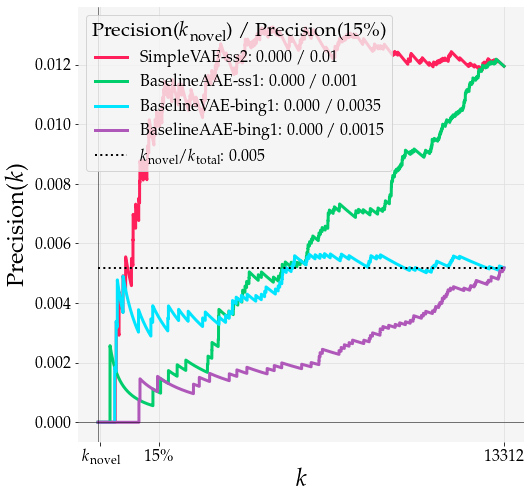

In [23]:
fig, ax = plt.subplots(figsize=(8, 8))

for sn in lt_results:
    if 'VAE-nre1' in sn:
        continue
    
    for suf in ['nd']:
        scores = latent_scores_catalog[f'{sn}-{suf}']


        pak = metrics.precision_at_k(scores, lt_results[sn]['labels'])

        uniques, counts = np.unique(lt_results[sn]['labels'], return_counts=True)
        random = counts.min() / counts.sum()
        pat15 = int(0.15 * counts.sum())

        ax.plot(pak, label=f'{sn.replace("nre", "ss") if ("nre" in sn) else sn}: {pak[int(sum(lt_results[sn]["labels"]))]:.3f} / {pak[pat15]:.2}')
    
ax.plot([0, len(pak)], [random, random], 'k:', lw=2, 
        label='$k_{\mathrm{novel}}/k_{\mathrm{total}}$: '+f'{counts[1]/counts.sum():.3f}')

ax.set_xlabel('$k$')
ax.set_ylabel('Precision($k$)')
ax.legend(title='Precision($k_{\mathrm{novel}}$) / Precision(15\%)')#, bbox_to_anchor=(1.05, 1.), loc='upper left')

ax.set_xticks([pat15, counts[1], counts.sum()])
ax.set_xticklabels(['15\%', '$k_{\mathrm{novel}}$', counts.sum()])

# Draw axes for styling
ax.axhline(0, 0, c='k', lw=0.5)
ax.axvline(0, 0, c='k', lw=0.5)

plt.savefig('Pak-latentspace_LunarAnalogueRP.pdf', format='pdf', bbox_inches='tight')
plt.show()

2021-07-30 16:56:43,997 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:43,998 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:43,998 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:43,998 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:43,998 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:43,999 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:43,999 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:43,999 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,000 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,001 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

dict_keys(['SimpleVAE-nre1-nd', 'SimpleVAE-nre2-nd', 'BaselineAAE-nre1-nd', 'BaselineVAE-bing1-nd', 'BaselineAAE-bing1-nd'])


2021-07-30 16:56:44,044 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,044 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:44,045 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,046 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,046 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,046 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:44,047 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,047 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:44,048 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:44,048 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:56:44,096 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,097 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:44,097 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,101 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:44,101 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,101 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,102 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,102 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/425f04f4efc7d1df4847629a64f82b57.dvi
2021-07-30 16:56:44,103 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,106 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:56:44,144 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:44,145 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:44,145 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,145 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:44,145 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,146 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:44,146 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,146 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,147 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,149 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:56:44,186 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,187 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:44,187 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:44,187 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:44,187 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,188 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:44,191 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,192 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:44,192 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,193 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,193 - DEBUG - fam

2021-07-30 16:56:44,235 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,235 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8e78cbf20214890fa9d1cce476dcd9b0.dvi
2021-07-30 16:56:44,236 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,238 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:44,238 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:44,242 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:44,243 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,243 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:44,244 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,244 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:44,411 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,411 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,411 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,412 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:44,412 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,413 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:44,413 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:44,413 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:44,414 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,414 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:44,448 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,448 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:44,449 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,450 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,450 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,450 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9575a85e4ba078e95e723f60008367b4.dvi
2021-07-30 16:56:44,451 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,453 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:44,453 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:44,454 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:56:44,497 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:44,497 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,498 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:44,498 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,499 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:44,499 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,499 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,500 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,500 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:56:44,501 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:44,546 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,547 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:44,547 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:44,547 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:44,548 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,548 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:44,549 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,549 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:44,549 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,550 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,550 - DEBUG - fam

2021-07-30 16:56:44,584 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,585 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:44,586 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,586 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:44,587 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:44,587 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:44,587 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,588 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:44,588 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,588 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:44,629 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,629 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,630 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,630 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e33d6e46c120caff2604b893a09d1332.dvi
2021-07-30 16:56:44,631 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,633 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:44,634 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:44,634 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:44,634 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,634 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:44,681 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,682 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:44,682 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,682 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,682 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,683 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:56:44,684 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,684 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:44,685 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:44,685 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:56:44,747 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,747 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:44,748 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,748 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:44,749 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,749 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,750 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,750 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8e78cbf20214890fa9d1cce476dcd9b0.dvi
2021-07-30 16:56:44,751 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,753 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:56:44,819 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:44,819 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,820 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:44,820 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,820 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,821 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,821 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:44,822 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,823 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:44,823 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:44,861 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:44,862 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,862 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:44,862 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,862 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:44,863 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,863 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,863 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,864 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9575a85e4ba078e95e723f60008367b4.dvi
2021-07-30 16:56:44,865 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:44,902 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,903 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,903 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:44,903 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:44,904 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:44,904 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:44,905 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,905 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:44,907 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,908 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:56:44,948 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:44,950 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:44,951 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:44,951 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:44,952 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:44,952 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:44,952 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:44,952 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:44,953 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,953 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:44,953 - DEBUG - fam

2021-07-30 16:56:45,003 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:45,004 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,004 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:45,004 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,006 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,007 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,008 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,008 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:45,009 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,009 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,010 - DEBUG - fam

2021-07-30 16:56:45,044 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,044 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c2ad046775c699d06e76946f22922358.dvi
2021-07-30 16:56:45,045 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:45,046 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,046 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:45,047 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,047 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,047 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,048 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,048 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:45,083 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,084 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,084 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:45,084 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,086 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,086 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,086 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,086 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:45,087 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,087 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:45,132 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,132 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,133 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,133 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:45,133 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,133 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,134 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,135 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,135 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:45,136 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:45,178 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,179 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,179 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,180 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6a9f0ed149fe1fd09f31f7aa6b5e81c4.dvi
2021-07-30 16:56:45,180 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:45,181 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,181 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:45,182 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,182 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,182 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:45,240 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,240 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,241 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,241 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,241 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:45,243 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,243 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,243 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,244 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,244 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:56:45,436 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,437 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-07-30 16:56:45,437 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:45,438 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,439 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:45,442 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,442 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,443 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,444 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,444 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:45,477 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,477 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,478 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,478 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:45,479 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:45,480 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,480 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:45,480 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,481 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,481 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:45,520 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:45,521 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,522 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:45,522 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,523 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,523 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,527 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,527 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:45,528 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,528 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,528 - DEBUG - fam

2021-07-30 16:56:45,565 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,565 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,566 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:45,566 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,566 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,566 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,567 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/425f04f4efc7d1df4847629a64f82b57.dvi
2021-07-30 16:56:45,568 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:45,570 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,570 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:45,612 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,613 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,613 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:45,613 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,613 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,614 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,614 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:45,615 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:45,616 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,616 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:45,651 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,651 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,652 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,652 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,652 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:45,653 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,653 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,653 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,653 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c2ad046775c699d06e76946f22922358.dvi
2021-07-30 16:56:45,654 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:45,691 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,691 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,692 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,692 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,692 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:45,693 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,693 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,693 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,694 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,694 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:45,733 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,734 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/80ebdd707c25a7c9dae65042bc3e9fd2.dvi
2021-07-30 16:56:45,734 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:45,735 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:45,736 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:45,736 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,736 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,737 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,737 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,738 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:45,778 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:45,778 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,779 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,779 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,779 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,779 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:45,780 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,780 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,780 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,780 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6a9f0ed149fe1fd09f31f7aa6b5e81c4.dv

2021-07-30 16:56:45,836 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:45,836 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:45,836 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:45,837 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:45,837 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:45,838 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:45,838 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,839 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:45,840 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:45,841 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

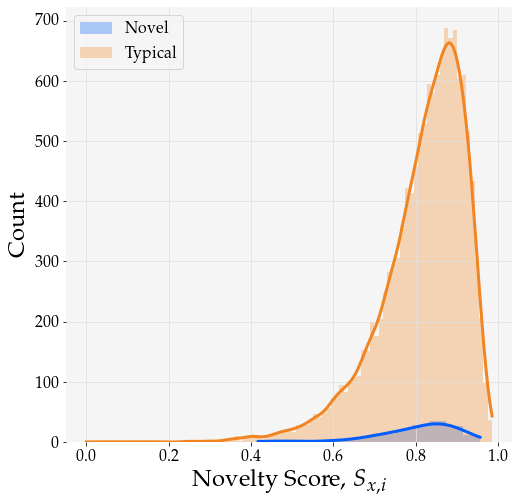

dict_keys(['SimpleVAE-nre1-nd', 'SimpleVAE-nre2-nd', 'BaselineAAE-nre1-nd', 'BaselineVAE-bing1-nd', 'BaselineAAE-bing1-nd'])


2021-07-30 16:56:46,136 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:46,136 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:46,137 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:46,137 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:46,137 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:46,138 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:46,138 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:46,139 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:46,139 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:46,140 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:46,177 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:46,177 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:46,178 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:46,178 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:46,179 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:46,179 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:46,180 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:46,180 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:46,181 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:46,181 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:46,217 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:46,218 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:46,218 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d276a205ffefd47add8bda20557c7c92.dvi
2021-07-30 16:56:46,219 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:46,220 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:46,220 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:46,221 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:46,221 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:46,223 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:46,225 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:46,270 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:46,271 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:46,271 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:46,272 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:46,274 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:46,274 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:46,275 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:46,276 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:46,276 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
IOPub message rate exceeded.
The notebook server will temporarily stop sending outp

2021-07-30 16:56:47,403 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:47,403 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:47,403 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:47,404 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:47,404 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:47,404 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/643cf41e7951529fcc9a3fcb10c62b53.dvi
2021-07-30 16:56:47,405 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:47,406 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:47,406 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:47,407 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:56:47,436 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:56:47,436 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:47,436 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:47,437 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:47,437 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:47,437 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:47,438 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:47,438 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:47,438 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:47,438 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:47,467 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e33d6e46c120caff2604b893a09d1332.dvi
2021-07-30 16:56:47,467 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:47,468 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:47,470 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:47,471 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:47,471 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:47,472 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:47,472 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:47,472 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:47,472 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:47,499 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:47,500 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:47,500 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:47,500 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:47,501 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:47,502 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:47,502 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:47,503 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:47,503 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:47,503 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:47,535 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e33d6e46c120caff2604b893a09d1332.dvi
2021-07-30 16:56:47,537 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:47,542 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:47,542 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:47,542 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:47,543 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:47,543 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:47,543 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:47,543 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:47,544 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:47,575 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:47,576 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:47,576 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:47,576 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:47,577 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:47,577 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:47,578 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c2ad046775c699d06e76946f22922358.dvi
2021-07-30 16:56:47,578 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:47,580 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:47,580 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:47,620 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:47,620 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:47,620 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:47,621 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:47,622 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:47,622 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:47,623 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:47,623 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:47,624 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:47,624 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:47,677 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:47,677 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/529bfac556d34e70e638742a816d5538.dvi
2021-07-30 16:56:47,678 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt


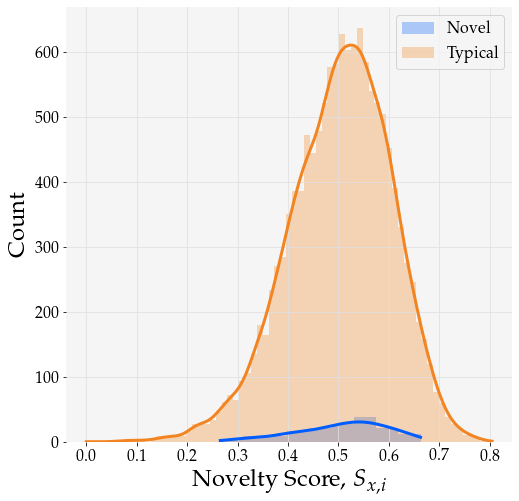

2021-07-30 16:56:47,901 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:47,901 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:47,902 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:47,903 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:47,903 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:47,903 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:47,904 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:47,904 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:47,905 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.


dict_keys(['SimpleVAE-nre1-nd', 'SimpleVAE-nre2-nd', 'BaselineAAE-nre1-nd', 'BaselineVAE-bing1-nd', 'BaselineAAE-bing1-nd'])


2021-07-30 16:56:47,905 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:47,905 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:47,906 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:47,907 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:47,908 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:47,908 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:47,908 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:47,909 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:47,909 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:47,909 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:47,949 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:47,950 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:47,950 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:47,951 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d276a205ffefd47add8bda20557c7c92.dvi
2021-07-30 16:56:47,951 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:47,952 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:47,953 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:47,953 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:47,953 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:47,954 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:47,988 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:47,988 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:47,988 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:47,988 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:47,989 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:47,991 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:47,991 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:47,992 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:47,992 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:47,993 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-07-30 16:56:48,027 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,027 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,028 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,028 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,028 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,028 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,029 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,029 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/983a2a6b0b66424692d45994f6bb1f67.dvi
2021-07-30 16:56:48,030 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:48,031 - DEBUG - family: serif, font: Palatino, info

2021-07-30 16:56:48,065 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:48,065 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,066 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,066 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,067 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,067 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,068 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,068 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,068 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,069 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-07-30 16:56:48,114 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:48,114 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,115 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:48,115 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,115 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,115 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,116 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,116 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,116 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,117 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,117 - DEBUG - fam

2021-07-30 16:56:48,293 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,293 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dvi
2021-07-30 16:56:48,294 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:48,295 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,295 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:48,295 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,296 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,296 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,296 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,297 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:48,331 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,331 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,331 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,331 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-07-30 16:56:48,333 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:48,333 - DEBUG - Assigning font /b'F1' = b'pplr8r' (dvi)
2021-07-30 16:56:48,335 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,337 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:48,339 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,339 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type

2021-07-30 16:56:48,385 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,385 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,388 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,388 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,389 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,389 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,389 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/425f04f4efc7d1df4847629a64f82b57.dvi
2021-07-30 16:56:48,390 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:48,392 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,392 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:48,430 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:48,430 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,430 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,431 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,431 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,431 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,432 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,432 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,432 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,433 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/25c1b725f827a8629238f3775925c694.dv

2021-07-30 16:56:48,468 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:48,471 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,472 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:48,472 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,473 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,473 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,474 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,475 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,475 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,475 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,476 - DEBUG - fam

2021-07-30 16:56:48,521 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,521 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/25c1b725f827a8629238f3775925c694.dvi
2021-07-30 16:56:48,522 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:48,524 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,525 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:48,525 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,525 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,526 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,526 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,527 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:48,576 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,576 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,576 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,577 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6a9f0ed149fe1fd09f31f7aa6b5e81c4.dvi
2021-07-30 16:56:48,578 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:48,579 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,579 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:48,580 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,581 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,581 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:48,637 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,638 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,638 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,638 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,638 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,639 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/529bfac556d34e70e638742a816d5538.dvi
2021-07-30 16:56:48,639 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:48,641 - DEBUG - Embedding Type-1 font b'pplr8r' from dvi.
2021-07-30 16:56:48,641 - DEBUG - Embedding TeX font b'pplr8r' - fontinfo={'dvifont': <DviFont: b'pplr8r'>, 'pdfname': <Name b'F1'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/urw/palatino/uplr8

2021-07-30 16:56:48,708 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,708 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,708 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,709 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dvi
2021-07-30 16:56:48,710 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:48,711 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,712 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:48,713 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,714 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,714 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:48,750 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,750 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,751 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,751 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,753 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,753 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,754 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:48,754 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,754 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,754 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:48,795 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:48,796 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,797 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:48,797 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,797 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,798 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,798 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,798 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,798 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,799 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,799 - DEBUG - fam

2021-07-30 16:56:48,834 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,834 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,835 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,836 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,837 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,837 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,838 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/425f04f4efc7d1df4847629a64f82b57.dvi
2021-07-30 16:56:48,839 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:48,842 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,843 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:48,874 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,875 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,875 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,875 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,876 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,876 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,876 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,877 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,877 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:48,878 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:48,914 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,914 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:48,914 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,915 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,915 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,915 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,915 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,916 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,916 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,916 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:48,961 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:48,961 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:48,962 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:48,962 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:48,962 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:48,963 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,963 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:48,963 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:48,963 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:48,964 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:49,001 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:49,002 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c2ad046775c699d06e76946f22922358.dvi
2021-07-30 16:56:49,003 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:49,004 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:49,004 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:49,005 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:49,006 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:49,007 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:49,007 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:49,007 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-07-30 16:56:49,044 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:49,045 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:49,045 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:49,046 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:49,047 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:49,047 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:49,048 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:49,048 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:49,048 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:49,049 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6a9f0ed149fe1fd09f31f7aa6b5e81c4.dv

2021-07-30 16:56:49,107 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:49,108 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:49,108 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:49,108 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:49,109 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:49,109 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:49,110 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:49,111 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:49,112 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:49,112 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:56:49,298 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:49,298 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:49,299 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:49,299 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:49,299 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:49,300 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:49,300 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:49,301 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:49,301 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:49,301 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dv

2021-07-30 16:56:49,337 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:49,339 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:49,339 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:49,340 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:49,340 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:49,341 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:49,341 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:49,341 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:49,341 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:49,342 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:49,343 - DEBUG - fam

2021-07-30 16:56:49,378 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:49,378 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:49,378 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:49,378 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:49,379 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d276a205ffefd47add8bda20557c7c92.dvi
2021-07-30 16:56:49,380 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:49,381 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:49,382 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:49,382 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:49,382 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:49,425 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:49,426 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:49,427 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:49,427 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:49,428 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:49,428 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:49,428 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:49,428 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:49,429 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:49,429 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:49,471 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:49,472 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:49,472 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/25c1b725f827a8629238f3775925c694.dvi
2021-07-30 16:56:49,473 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:49,474 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:49,474 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:49,475 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:49,475 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:49,475 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:49,476 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:50,818 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:50,823 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:50,823 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:50,823 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:50,823 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d276a205ffefd47add8bda20557c7c92.dvi
2021-07-30 16:56:50,824 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:50,825 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:50,825 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:50,825 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:50,826 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:50,852 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:50,853 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:50,853 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:50,853 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:50,853 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:50,854 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:50,854 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:50,854 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:50,854 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:50,855 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:50,885 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:50,885 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:50,886 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:50,886 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:50,886 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:50,887 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:50,887 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:50,887 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:50,887 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:50,888 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:50,916 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:50,917 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:50,917 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:50,917 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:50,917 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:50,918 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:50,918 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:50,919 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:50,919 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:50,920 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:50,959 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c2ad046775c699d06e76946f22922358.dvi
2021-07-30 16:56:50,959 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:50,960 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:50,961 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:50,961 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:50,961 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:50,962 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:50,962 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:50,962 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:50,962 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:50,996 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:50,996 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:50,997 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:50,997 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:50,997 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:50,998 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,004 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,004 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:51,004 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/25c1b725f827a8629238f3775925c694.dvi
2021-07-30 16:56:51,005 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:51,052 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,052 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,053 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:51,053 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:51,053 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:51,054 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:51,054 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:51,055 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:51,055 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:51,056 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:56:51,094 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:51,095 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8e78cbf20214890fa9d1cce476dcd9b0.dvi
2021-07-30 16:56:51,095 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:51,097 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:51,097 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:51,098 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:51,098 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:51,099 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:51,099 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:51,099 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

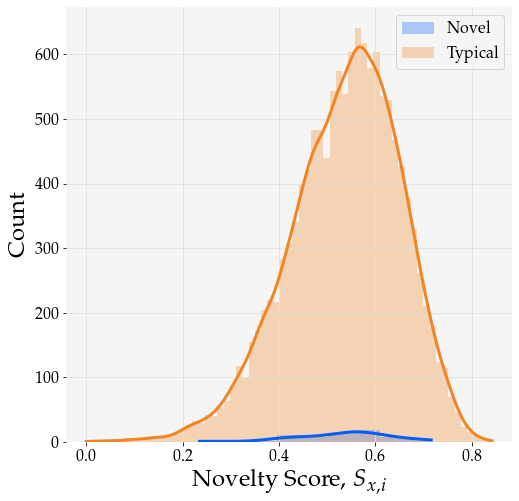

dict_keys(['SimpleVAE-nre1-nd', 'SimpleVAE-nre2-nd', 'BaselineAAE-nre1-nd', 'BaselineVAE-bing1-nd', 'BaselineAAE-bing1-nd'])


2021-07-30 16:56:51,414 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:51,415 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:51,415 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:51,415 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:51,416 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:51,416 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:51,417 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:51,417 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,417 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,418 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:51,456 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:51,456 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:51,457 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:51,458 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:51,458 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:51,458 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:51,459 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:51,459 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:51,460 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:51,460 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:51,497 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,500 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:51,503 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/425f04f4efc7d1df4847629a64f82b57.dvi
2021-07-30 16:56:51,506 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:51,508 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:51,509 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:51,509 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:51,509 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:51,510 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:51,510 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:51,548 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:51,548 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,549 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,550 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:51,550 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:51,551 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:51,552 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:51,552 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:51,553 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:51,553 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-07-30 16:56:51,591 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:51,591 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:51,591 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:51,591 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,592 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,592 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:51,592 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/681f96a2424d9e6ece162e15d6c6b491.dvi
2021-07-30 16:56:51,593 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:51,595 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:51,595 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:51,644 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:51,645 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:51,645 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:51,645 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:51,645 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:51,646 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,646 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,646 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:51,647 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:51,648 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:51,902 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:51,903 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:51,903 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:51,903 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:51,904 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:51,904 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:51,904 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:51,905 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,905 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,905 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:51,937 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9575a85e4ba078e95e723f60008367b4.dvi
2021-07-30 16:56:51,938 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:51,940 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:51,941 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:51,941 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:51,941 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:51,941 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:51,942 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:51,942 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:51,943 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:51,991 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,991 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:51,992 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:51,992 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:56:51,993 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:51,993 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:51,994 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:51,994 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:51,996 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:51,996 - DEBUG - Apple Chancery font is not compat

2021-07-30 16:56:52,037 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,037 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,037 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,038 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,038 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,038 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:52,040 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:52,040 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:52,041 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:52,041 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:52,078 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:52,079 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:52,079 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,079 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,080 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,080 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,080 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,081 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:52,081 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c2ad046775c699d06e76946f22922358.dvi
2021-07-30 16:56:52,081 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:52,132 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:52,134 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:52,134 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:52,135 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:52,136 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,137 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,137 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,137 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,138 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,138 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:52,189 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-07-30 16:56:52,191 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:52,192 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:52,192 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:52,193 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:52,193 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:52,194 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,194 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,194 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,195 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:52,263 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,264 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:52,267 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8e78cbf20214890fa9d1cce476dcd9b0.dvi
2021-07-30 16:56:52,268 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:52,270 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:52,270 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:52,271 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:52,271 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:52,271 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,273 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:52,370 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:52,371 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:52,372 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:52,372 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:52,373 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:52,373 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:52,373 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,374 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,374 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,375 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:

2021-07-30 16:56:52,417 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,419 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:52,420 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9575a85e4ba078e95e723f60008367b4.dvi
2021-07-30 16:56:52,420 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:52,423 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:52,425 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:52,426 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:52,427 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:52,427 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,427 - DEBUG - Textile font is not compatible with

2021-07-30 16:56:52,469 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:52,469 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:52,470 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,470 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,470 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,471 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,471 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,471 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:52,472 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d276a205ffefd47add8bda20557c7c92.dvi
2021-07-30 16:56:52,473 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:52,519 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,520 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,520 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,521 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,521 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,521 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:52,522 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:52,522 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:52,522 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:52,522 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 

2021-07-30 16:56:52,565 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,565 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,566 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,569 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,570 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,570 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:52,570 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/25c1b725f827a8629238f3775925c694.dvi
2021-07-30 16:56:52,571 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:52,572 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:52,573 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:52,611 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:52,611 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:52,611 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,612 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,612 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,612 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,613 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,613 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:52,614 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:52,617 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:52,659 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,660 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,660 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,660 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,661 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,662 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:52,662 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e33d6e46c120caff2604b893a09d1332.dvi
2021-07-30 16:56:52,663 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:52,664 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:52,667 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:52,708 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:52,708 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:52,709 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:52,709 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:52,709 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:52,709 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,710 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,710 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,710 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,710 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 

2021-07-30 16:56:52,748 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:52,751 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:52,751 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:52,752 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,754 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,754 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,754 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,755 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,755 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:52,755 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 

2021-07-30 16:56:52,821 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:52,822 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:52,822 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:52,822 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,823 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:52,823 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:52,824 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8e78cbf20214890fa9d1cce476dcd9b0.dvi
2021-07-30 16:56:52,825 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:52,827 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:52,828 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:53,094 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:53,094 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:53,095 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:53,095 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:53,096 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:53,096 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:53,097 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-07-30 16:56:53,098 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:53,098 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:53,099 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30

2021-07-30 16:56:53,133 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:53,133 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:53,133 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:53,134 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:53,134 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:53,135 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:53,135 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:53,135 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:53,136 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9575a85e4ba078e95e723f60008367b4.dvi
2021-07-30 16:56:53,136 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-07-30 16:56:53,178 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:53,178 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:53,179 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-07-30 16:56:53,179 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:53,179 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:53,179 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:53,180 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:53,180 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:53,180 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:53,181 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 

2021-07-30 16:56:53,231 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:53,234 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:53,235 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:53,235 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:53,236 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:53,236 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:53,237 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:53,237 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:53,238 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:53,238 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:53,238 - DEBUG - fam

2021-07-30 16:56:53,278 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-07-30 16:56:53,279 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-07-30 16:56:53,281 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-07-30 16:56:53,283 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-07-30 16:56:53,283 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-07-30 16:56:53,284 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-07-30 16:56:53,284 - DEBUG - Textile font is not compatible with usetex.
2021-07-30 16:56:53,285 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-07-30 16:56:53,285 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-07-30 16:56:53,286 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-07-30 16:56:53,286 - DEBUG - fam

In [24]:
def score_density_vis_lt(lt_scores,labels, sn, color='C1'):
    
    labels = np.array(labels).astype(bool)

    
    fig, ax = plt.subplots(figsize=(8, 8))
    sns.histplot(data=lt_scores[labels], label='Novel', color='C5', fill=True, lw=0, alpha=0.3, kde=True)
    sns.histplot(data=lt_scores[~labels], label='Typical', color=color, fill=True, lw=0, alpha=0.3, kde=True)
    ax.set_xlabel('Novelty Score, $S_{x,i}$')
    plt.legend()
    plt.savefig(f'LatentScoreDensity-{sn}.pdf', format='pdf', bbox_inches='tight')
    plt.show()

for sn, res in lt_results.items():
    print(latent_scores_catalog.keys())
            
    lt_scores = latent_scores_catalog[f'{sn}-nd']
    lt_scores = np.array(lt_scores)
    
    # Scale novelty scores between 0,1, though it doesn't really matter
    lt_scores /= np.max(np.abs(lt_scores))
    lt_scores += 1
    if 'AAE' in sn:
        color = 'C1'
    elif 'VAE' in sn:
        color='C6'
    score_density_vis_lt(lt_scores, res['labels'], sn, color=color)